**ARIMA**

In [ ]:
import pandas as pd
import numpy as np
from google.colab import drive
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [ ]:
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
df1 = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

In [ ]:
df1.head()

,ID,From,Date,Hour,Participation_Phase,Demand_kWh,Temperature,Temperature24,Temperature48,Temperature72
0,Exp_553,2020-02-01T00:00:00Z,2020-02-01,1,Phase_1,1.174,7.6,6.1,5.0,4.4
1,Exp_553,2020-02-01T01:00:00Z,2020-02-01,2,Phase_1,1.172,8.2,6.2,5.1,4.4
2,Exp_553,2020-02-01T02:00:00Z,2020-02-01,3,Phase_1,1.207,8.4,6.3,5.3,4.5
3,Exp_553,2020-02-01T03:00:00Z,2020-02-01,4,Phase_1,1.613,8.4,6.4,5.4,4.5
4,Exp_553,2020-02-01T04:00:00Z,2020-02-01,5,Phase_1,1.101,8.2,6.5,5.5,4.6


In [ ]:
df1['Date'] = pd.to_datetime(df1['Date'])

# Group by 'ID' and find the last date for each ID
last_date_per_id = df1.groupby('ID')['Date'].max()

# Print the last date for each ID
print("Last date for each ID:")
print(last_date_per_id)

Last date for each ID:
ID
Exp_103   2020-03-20
Exp_111   2020-03-20
Exp_12    2020-03-20
Exp_124   2020-03-20
Exp_128   2020-03-20
Exp_17    2020-03-20
Exp_182   2020-03-20
Exp_191   2020-03-20
Exp_208   2020-03-20
Exp_222   2020-03-20
Exp_223   2020-03-20
Exp_23    2020-03-20
Exp_266   2020-03-20
Exp_271   2020-03-20
Exp_272   2020-03-20
Exp_313   2020-03-20
Exp_315   2020-03-20
Exp_325   2020-03-20
Exp_332   2020-03-20
Exp_356   2020-03-20
Exp_365   2020-03-20
Exp_367   2020-03-20
Exp_401   2020-03-20
Exp_420   2020-03-20
Exp_445   2020-03-20
Exp_446   2020-03-20
Exp_451   2020-03-20
Exp_460   2020-03-20
Exp_462   2020-03-20
Exp_49    2020-03-20
Exp_500   2020-03-20
Exp_502   2020-03-20
Exp_509   2020-03-20
Exp_518   2020-03-20
Exp_52    2020-03-20
Exp_529   2020-03-20
Exp_547   2020-03-20
Exp_553   2020-03-20
Exp_56    2020-03-20
Exp_567   2020-03-20
Exp_570   2020-03-20
Exp_587   2020-03-20
Exp_612   2020-03-20
Exp_62    2020-03-20
Exp_635   2020-03-20
Exp_643   2020-03-20
Exp_649 

In [ ]:
df1.describe()

,Hour,Demand_kWh,Temperature,Temperature24,Temperature48,Temperature72
count,97200.000000,97200.000000,97200.000000,97200.000000,97200.000000,97200.000000
mean,12.500000,2.122136,3.395712,3.394164,3.373204,3.357848
std,6.922222,1.842637,2.937449,2.469360,2.234007,2.045551
min,1.000000,0.000000,-7.200000,-4.200000,-4.000000,-3.100000
25%,6.750000,0.629000,1.600000,1.800000,2.000000,2.100000
50%,12.500000,1.703000,3.800000,3.800000,3.700000,3.700000
75%,18.250000,3.150000,5.600000,5.200000,5.100000,5.000000
max,24.000000,16.145000,11.400000,7.900000,7.800000,7.400000


In [ ]:
df1.head()

,ID,From,Date,Hour,Participation_Phase,Demand_kWh,Temperature,Temperature24,Temperature48,Temperature72
0,Exp_553,2020-02-01T00:00:00Z,2020-02-01,1,Phase_1,1.174,7.6,6.1,5.0,4.4
1,Exp_553,2020-02-01T01:00:00Z,2020-02-01,2,Phase_1,1.172,8.2,6.2,5.1,4.4
2,Exp_553,2020-02-01T02:00:00Z,2020-02-01,3,Phase_1,1.207,8.4,6.3,5.3,4.5
3,Exp_553,2020-02-01T03:00:00Z,2020-02-01,4,Phase_1,1.613,8.4,6.4,5.4,4.5
4,Exp_553,2020-02-01T04:00:00Z,2020-02-01,5,Phase_1,1.101,8.2,6.5,5.5,4.6


In [ ]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 13.4 MB/s eta 0:00:00


In [ ]:
!pip install pandas pmdarima matplotlib


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 13.0 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima.model_selection import train_test_split
import matplotlib.pyplot as plt


In [ ]:
df1['DateTime'] = pd.to_datetime(df1['Date']) + pd.to_timedelta(df1['Hour'], unit='h')
df1 = df1.set_index('DateTime')


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


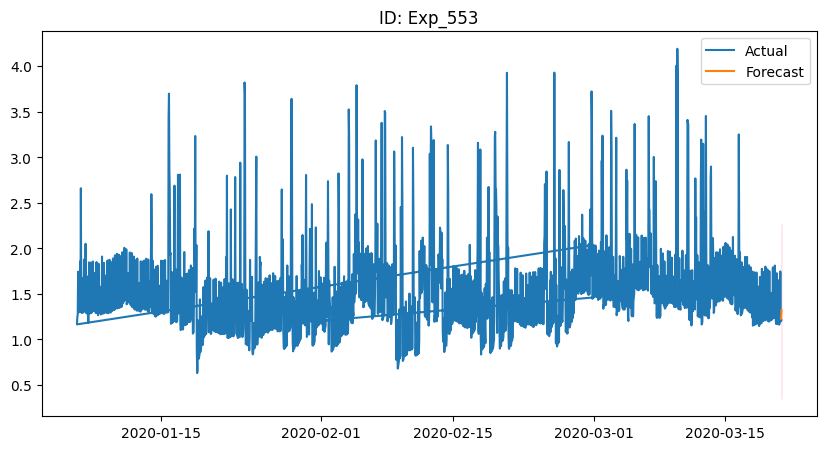

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


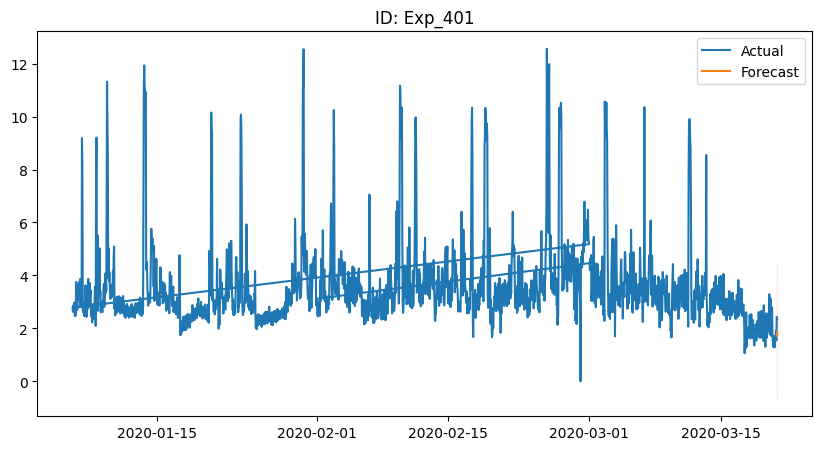

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


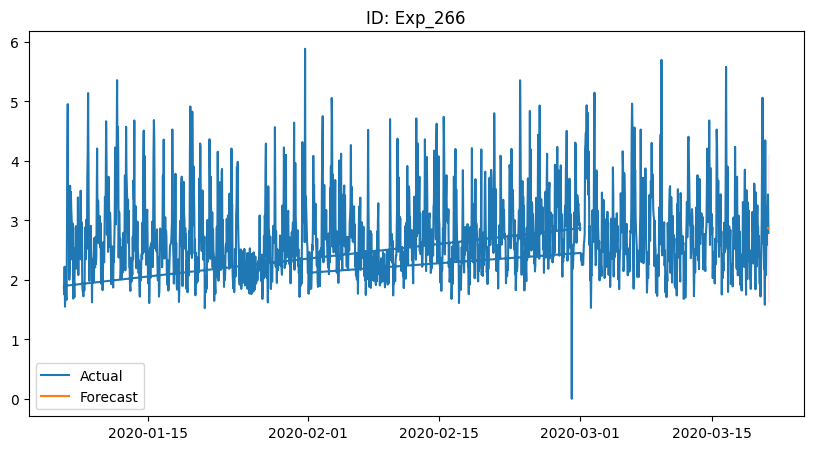

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


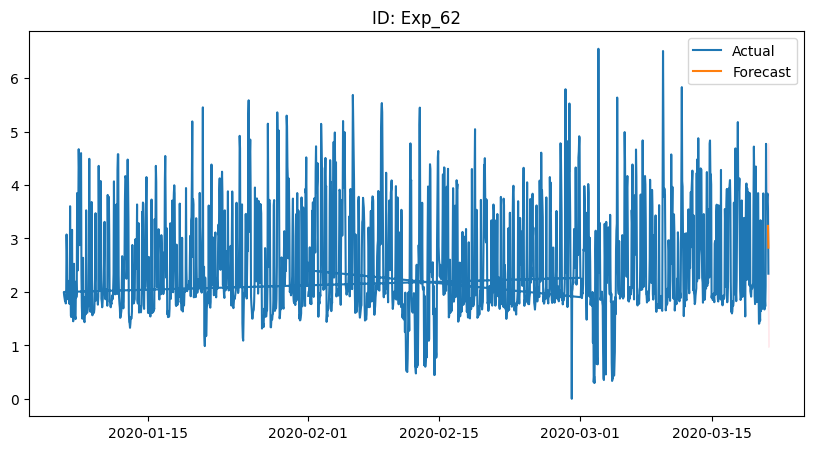

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


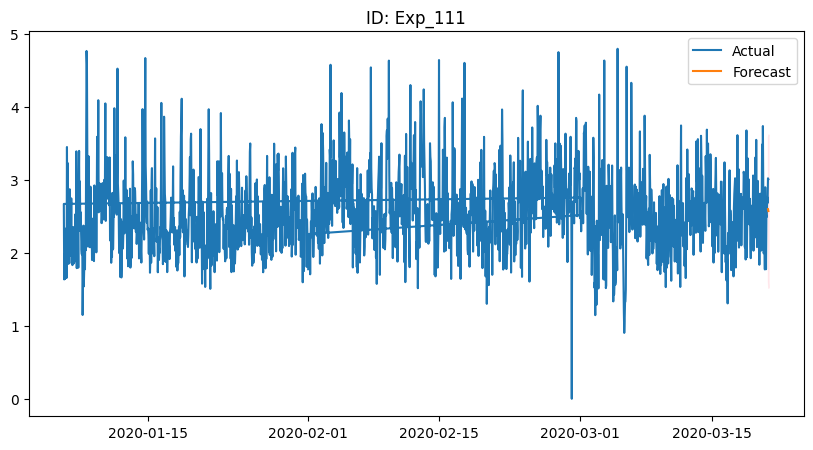

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


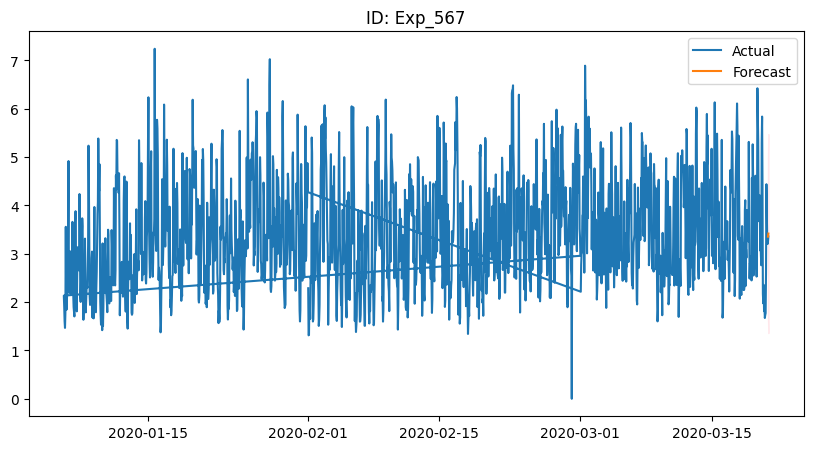

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


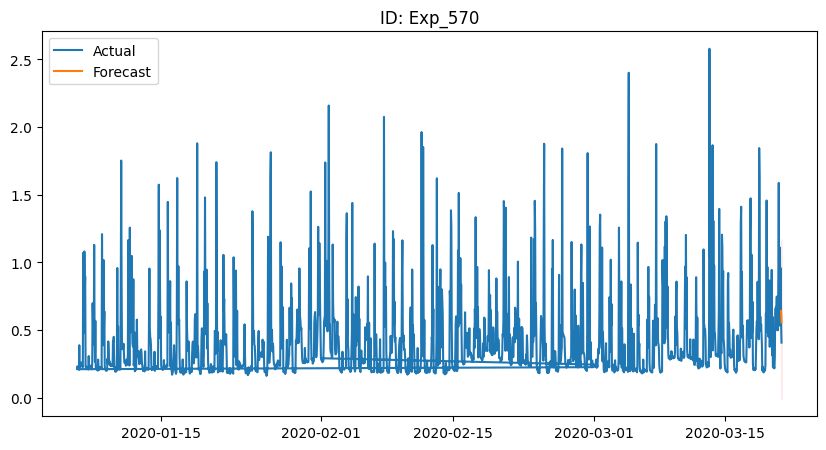

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


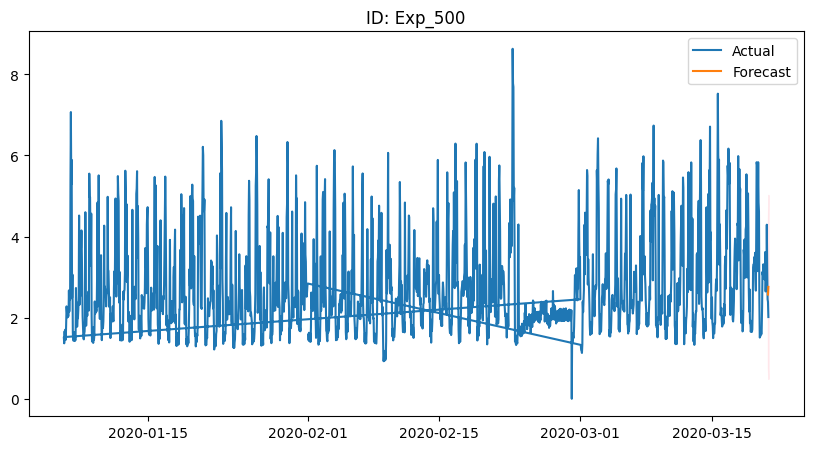

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


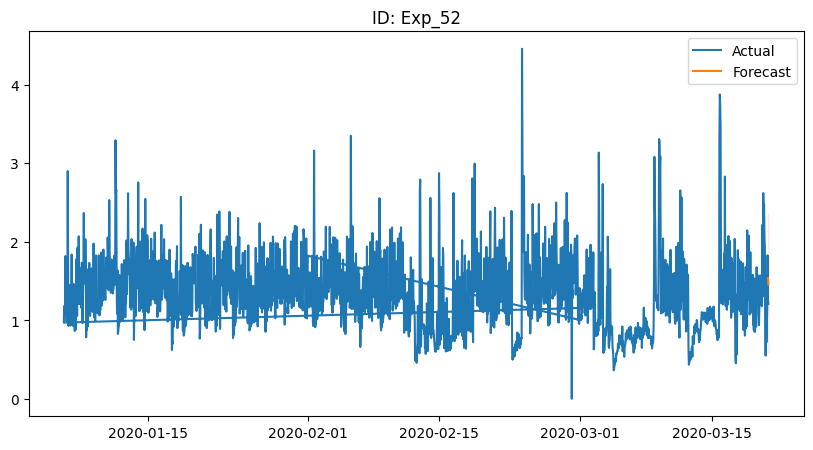

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


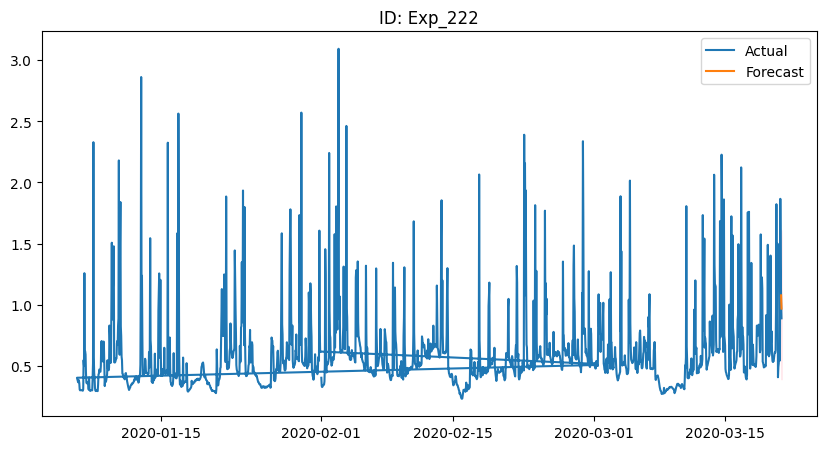

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


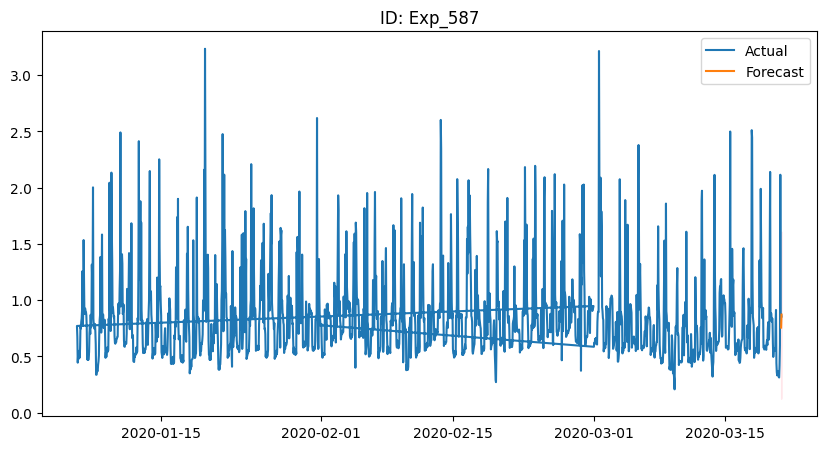

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


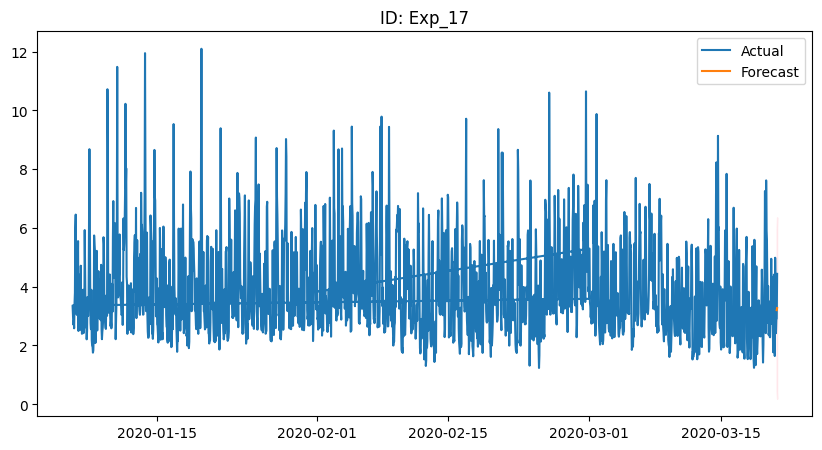

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


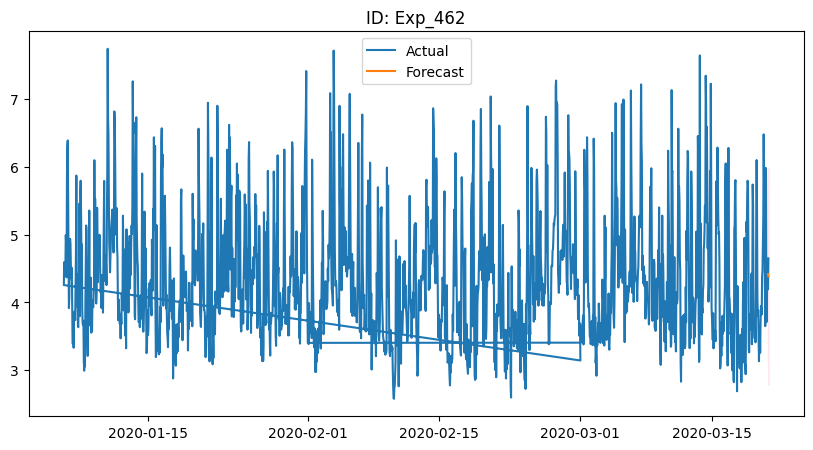

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


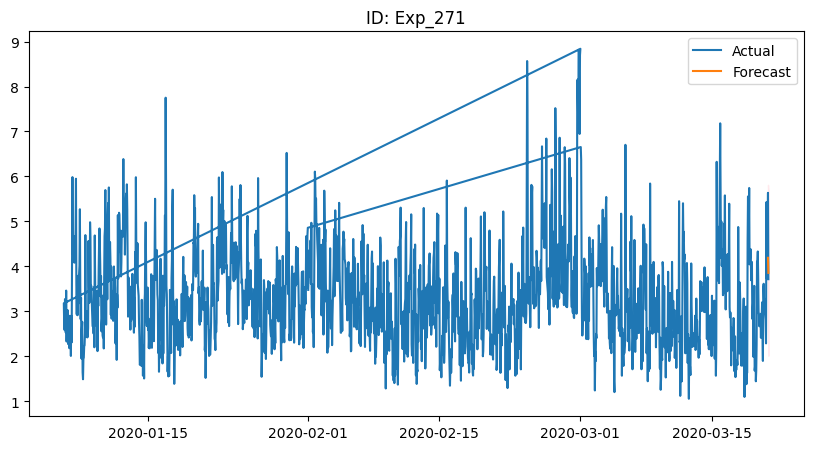

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


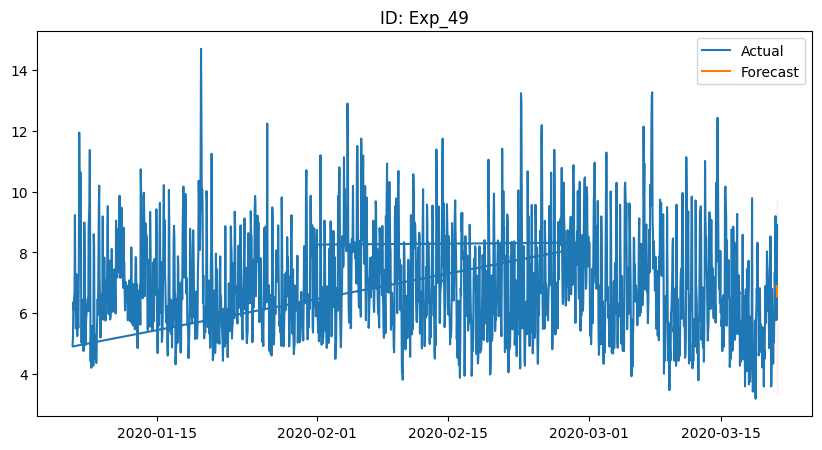

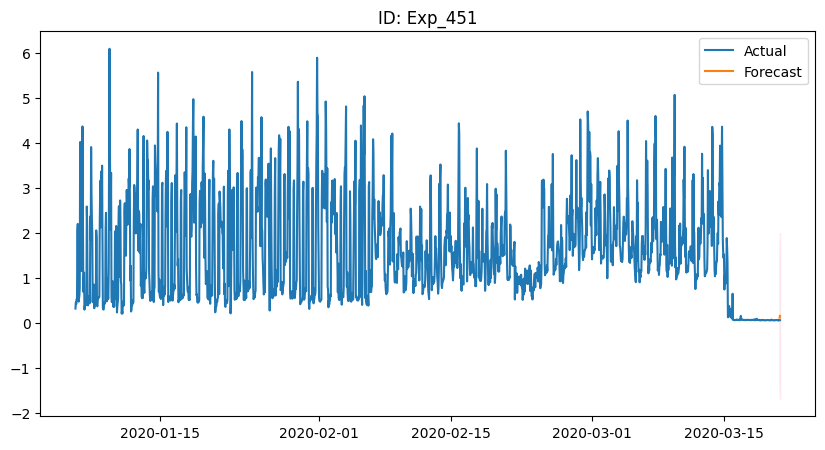

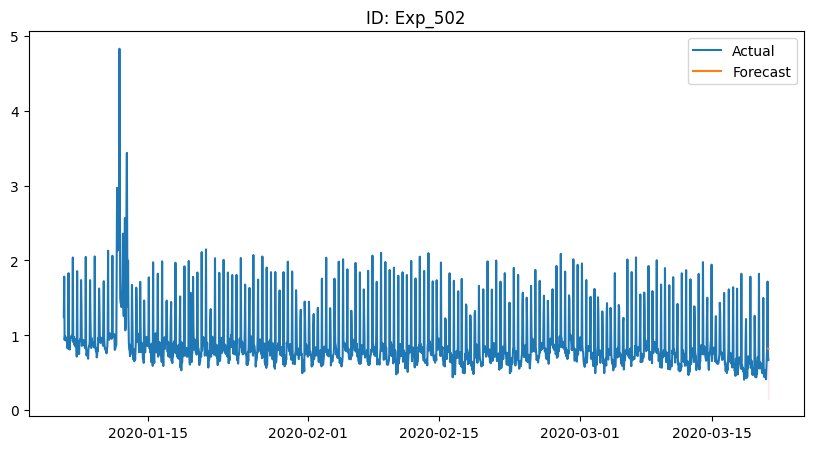

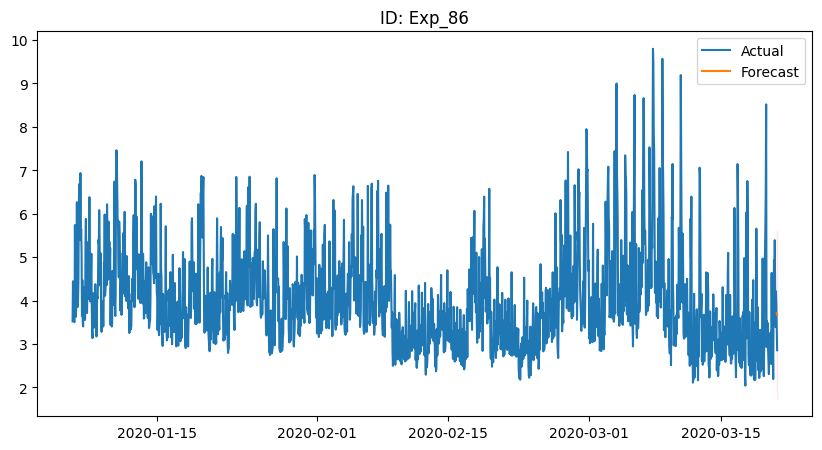

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


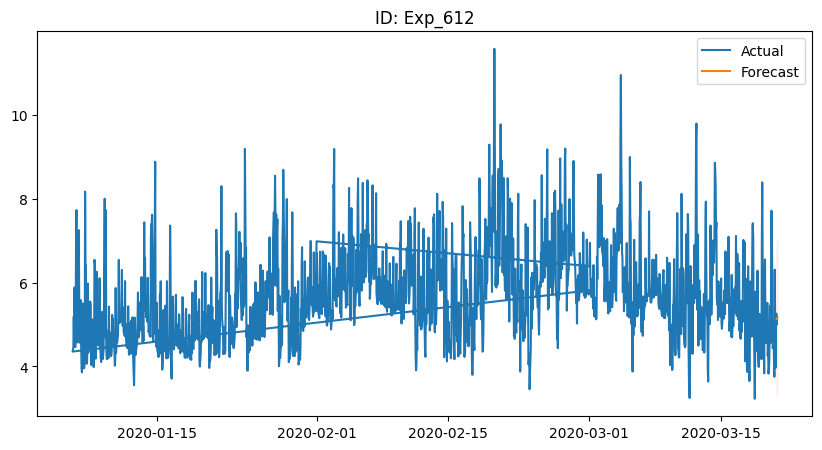

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


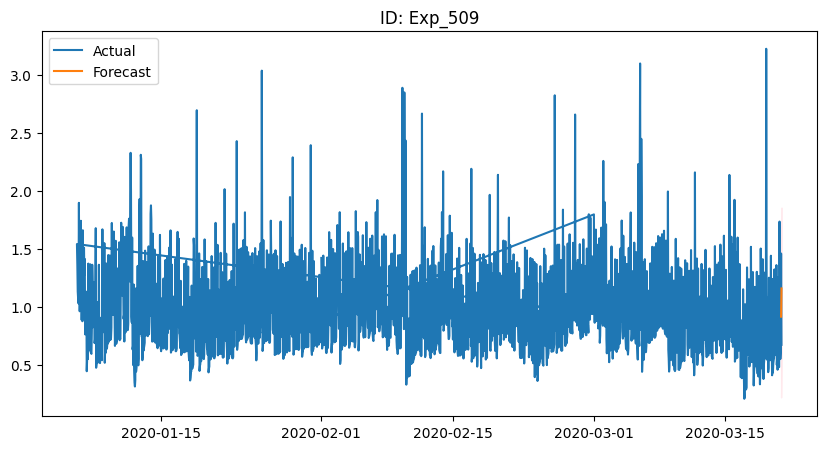

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


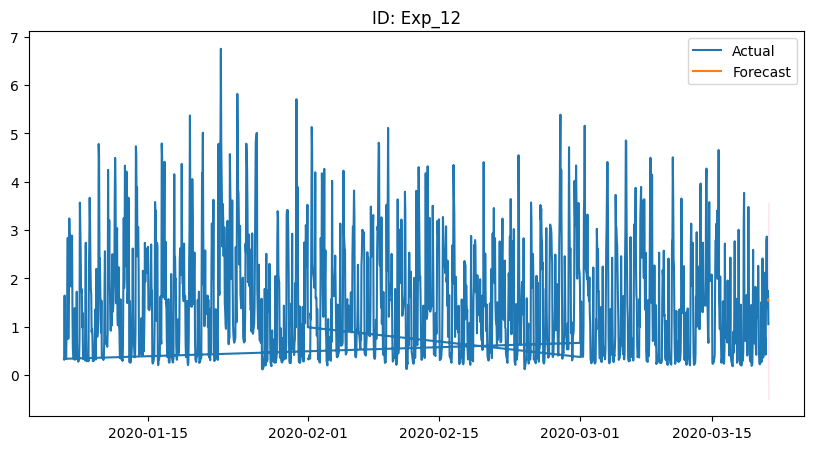

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


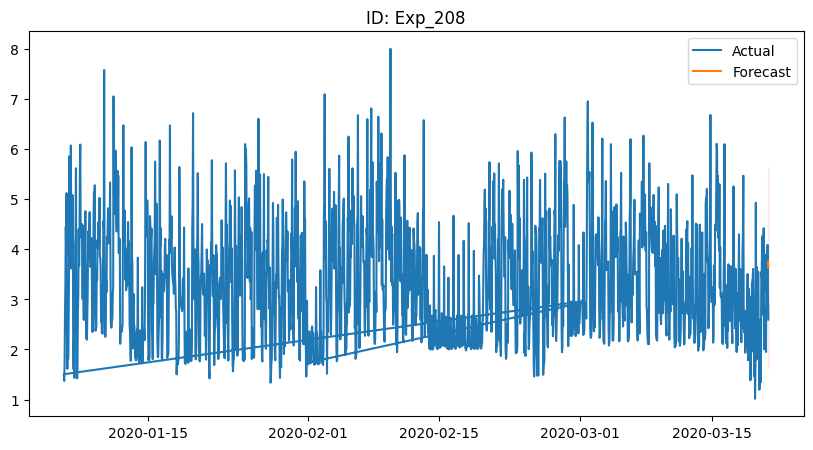

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


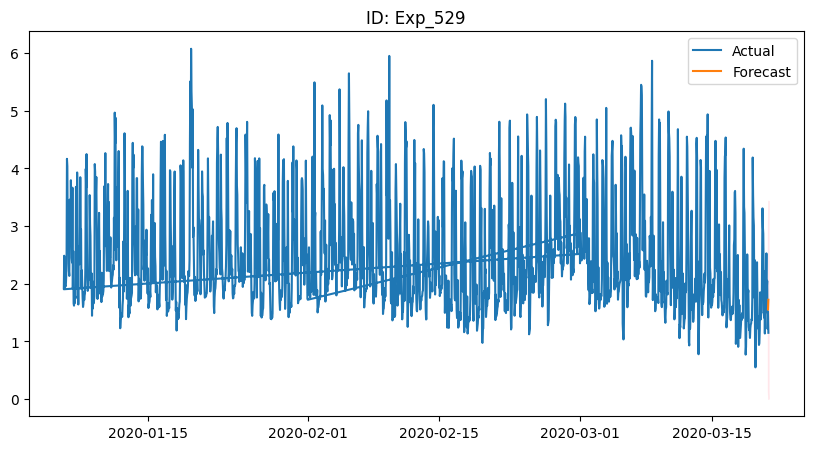

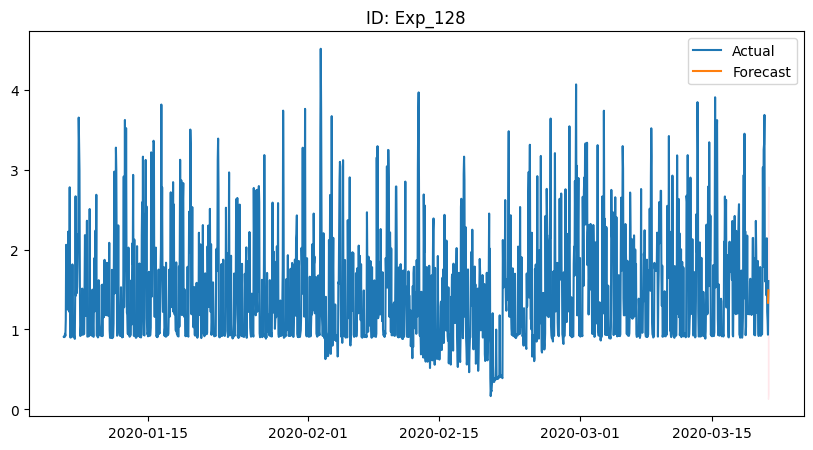

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


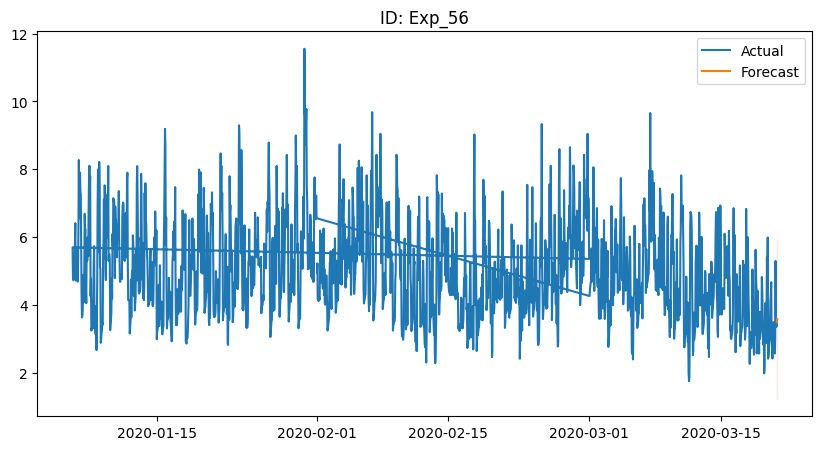

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


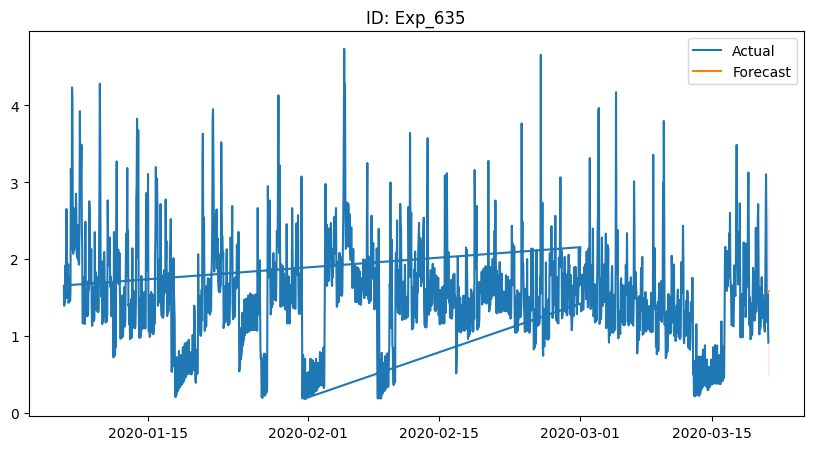

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


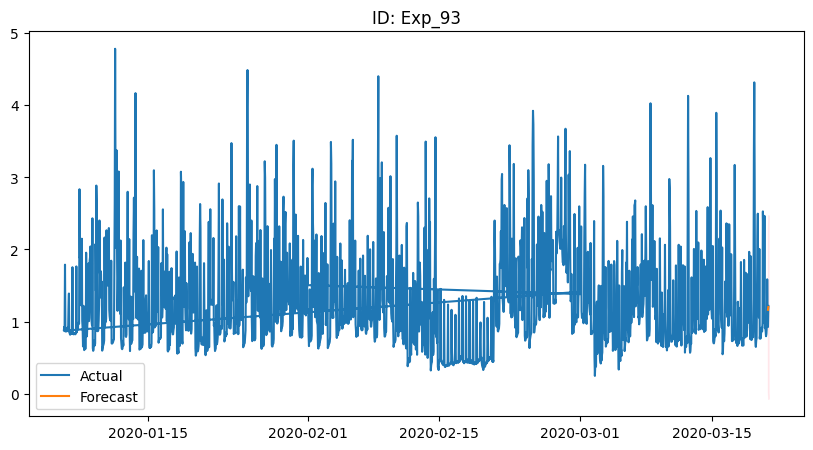

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


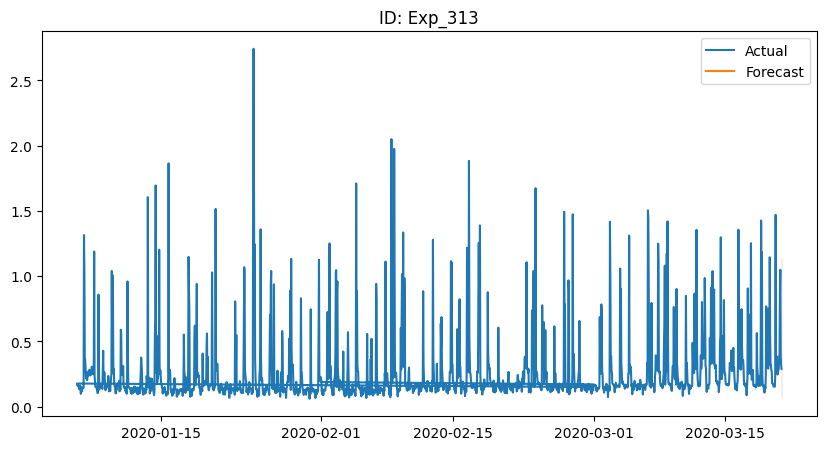

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


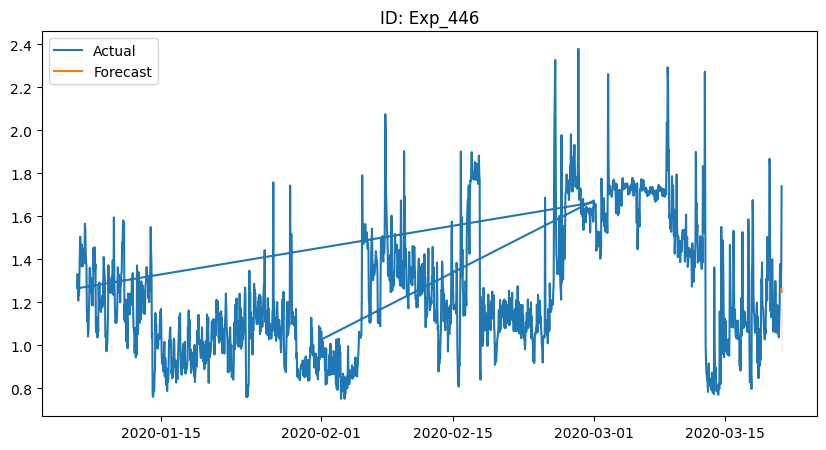

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


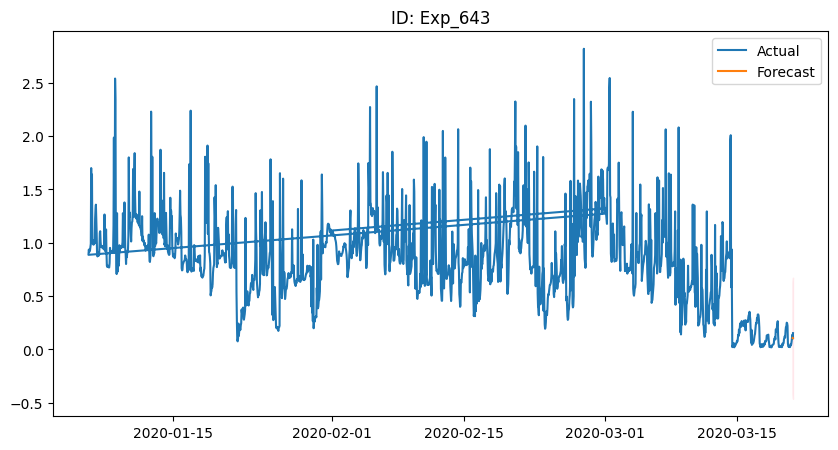

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


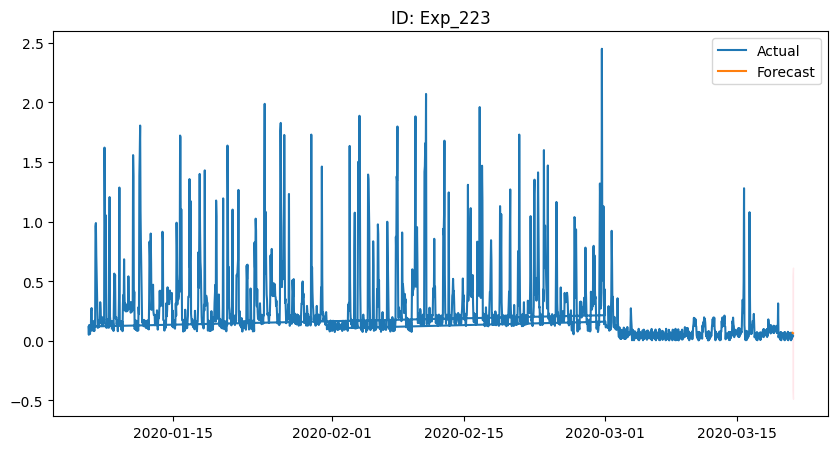

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


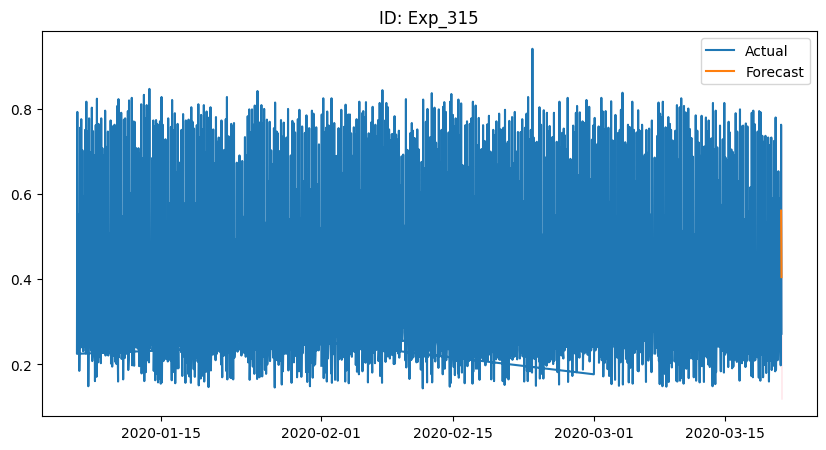

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


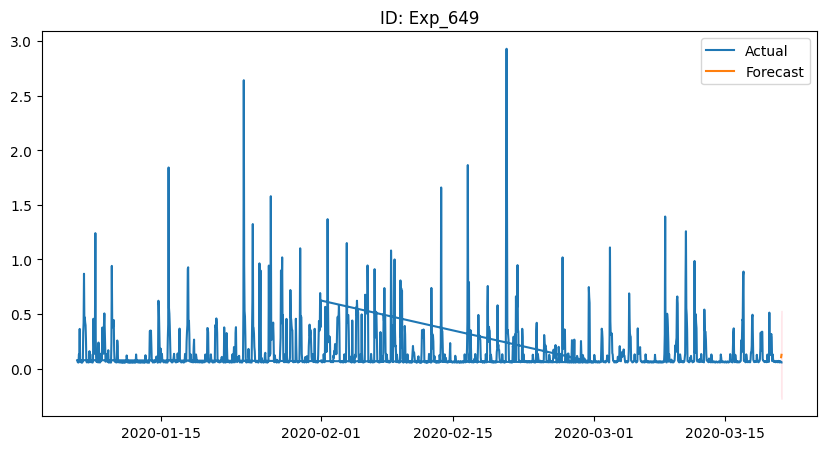

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


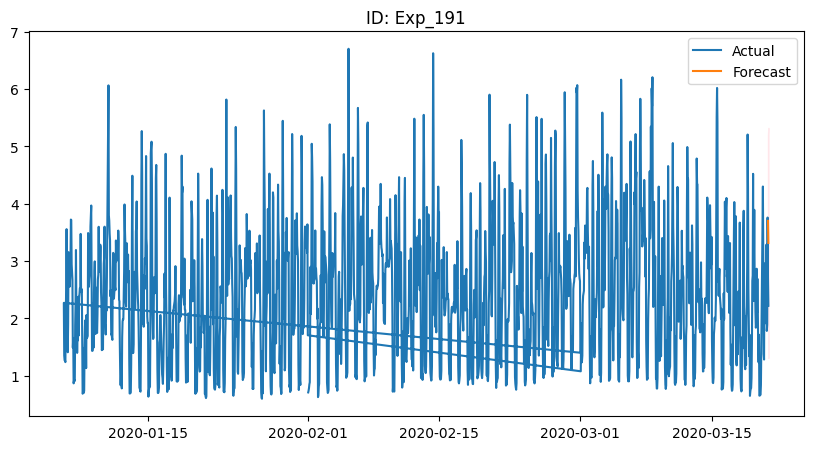

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


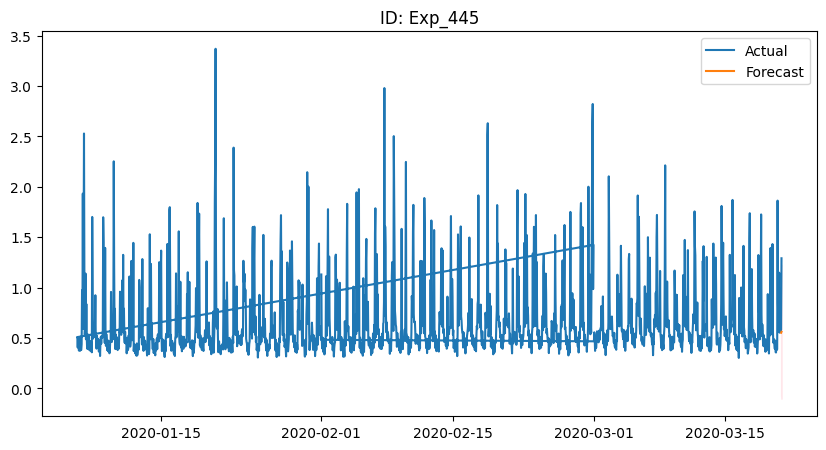

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


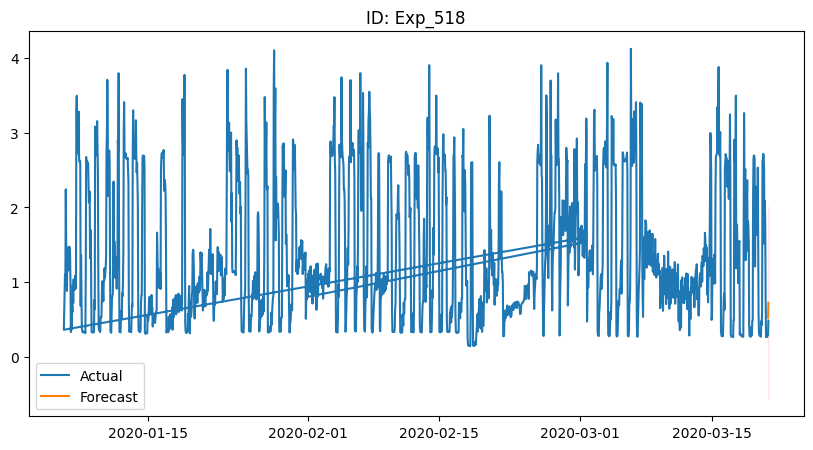

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


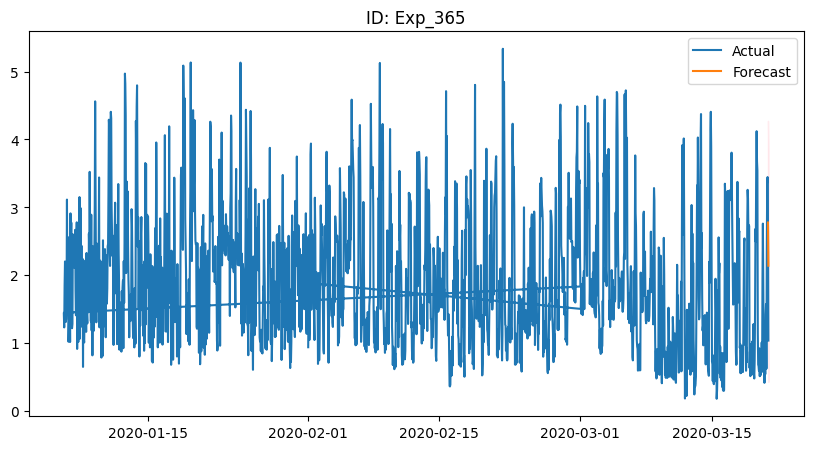

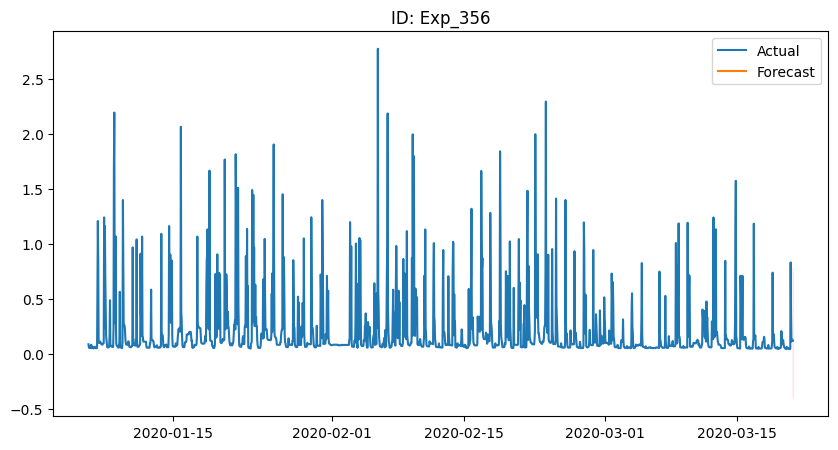

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


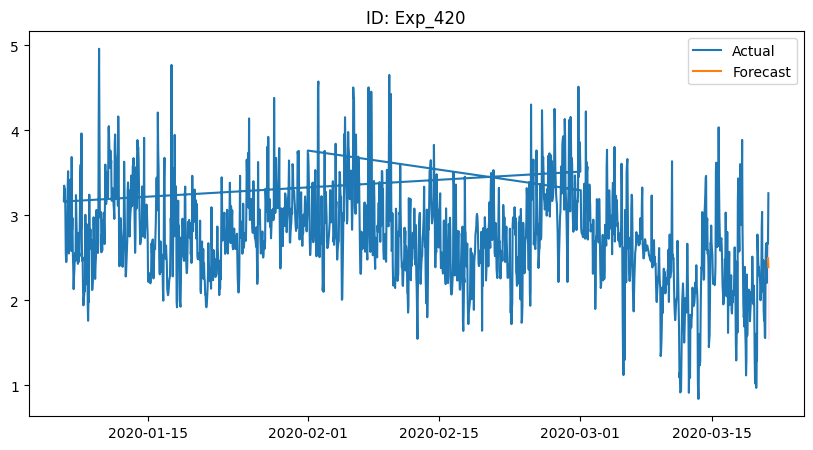

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


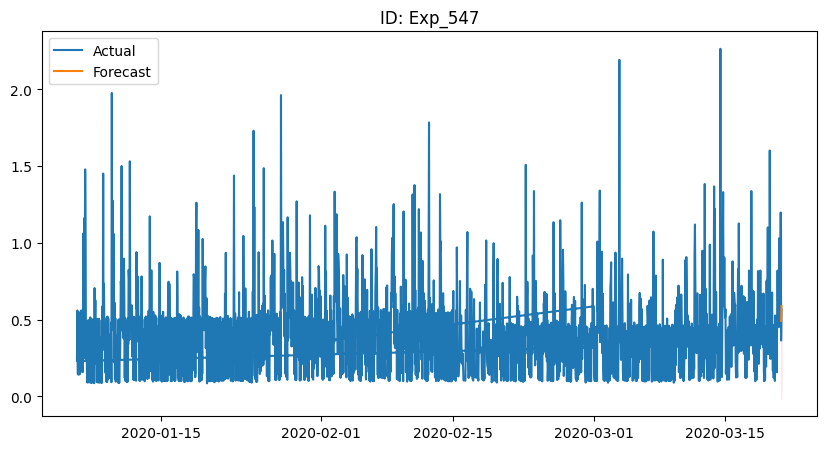

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


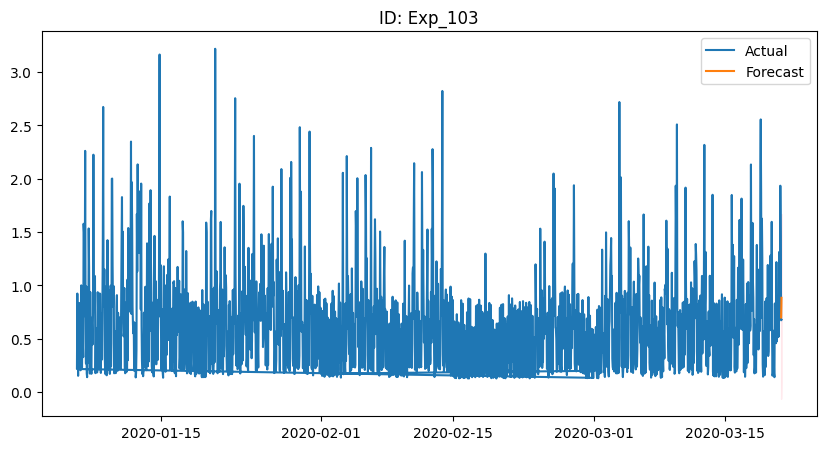

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


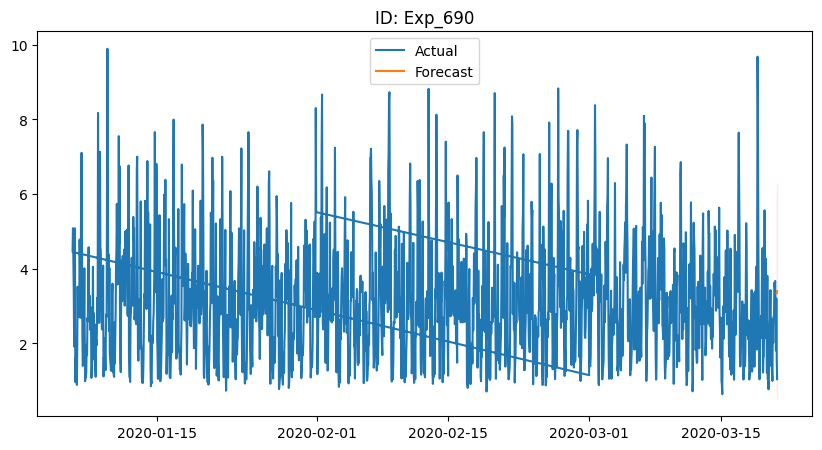

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


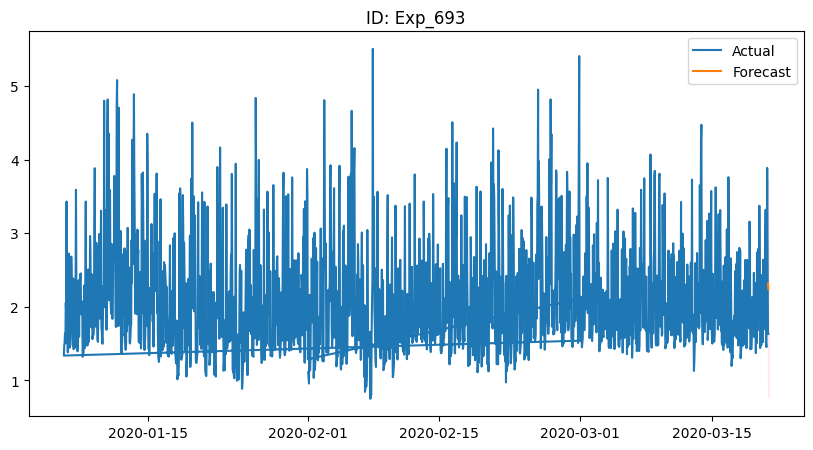

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


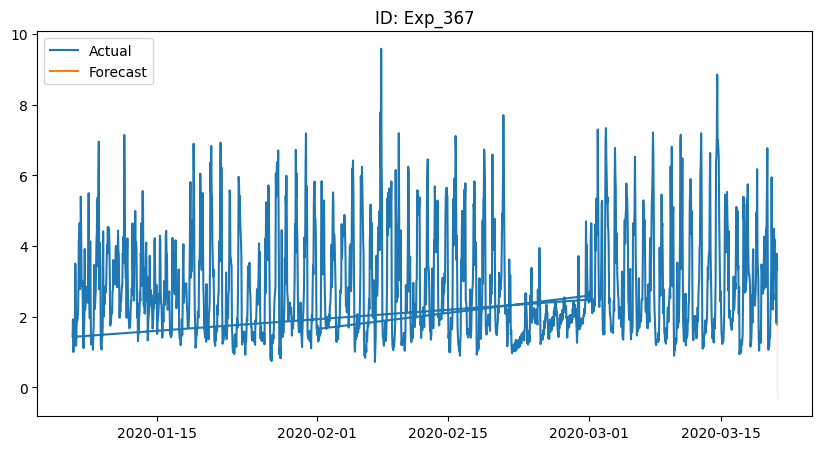

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


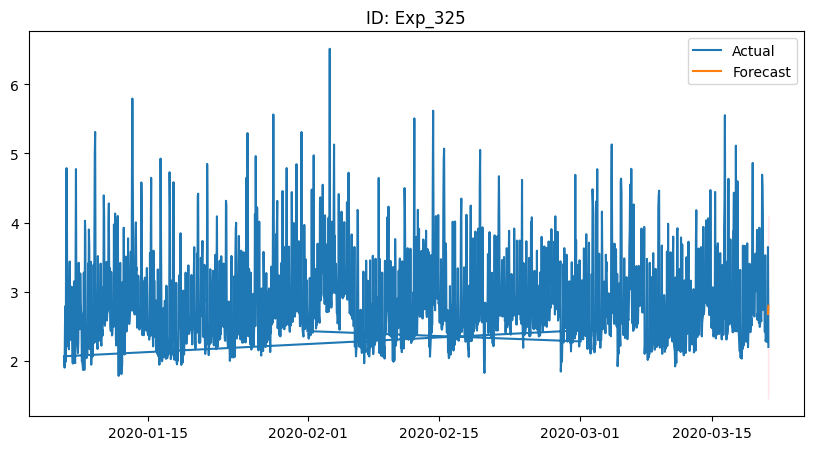

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


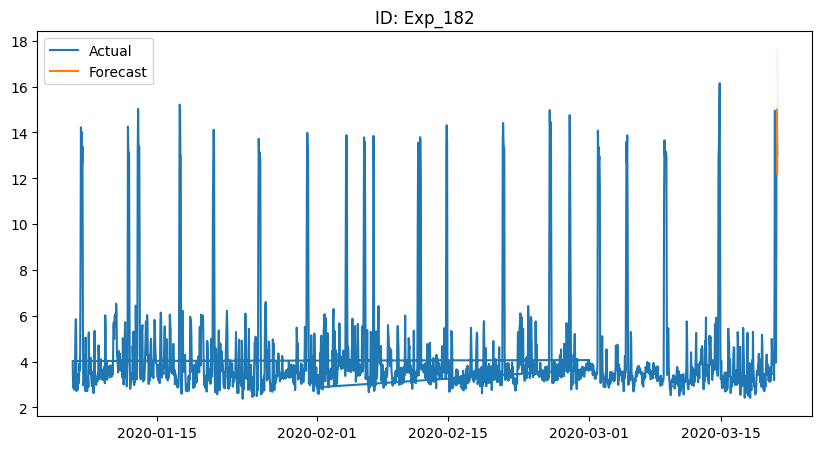

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


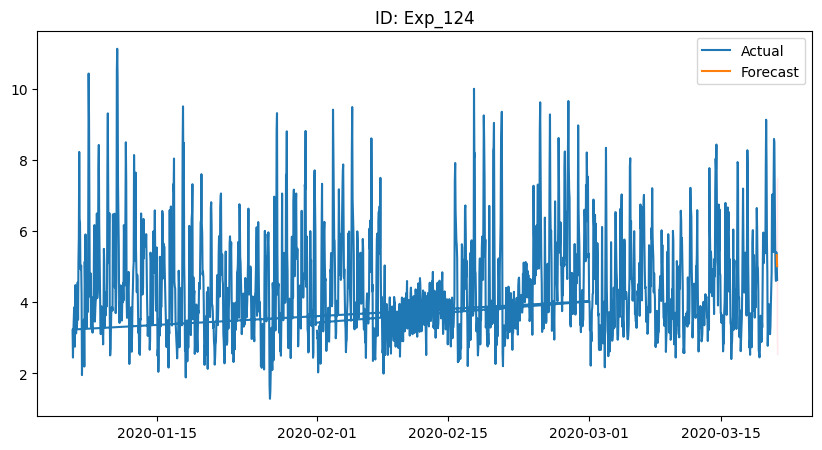

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


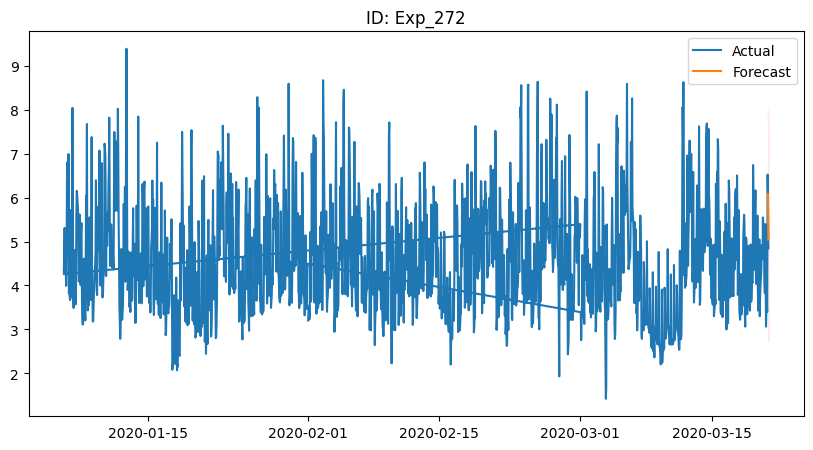

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


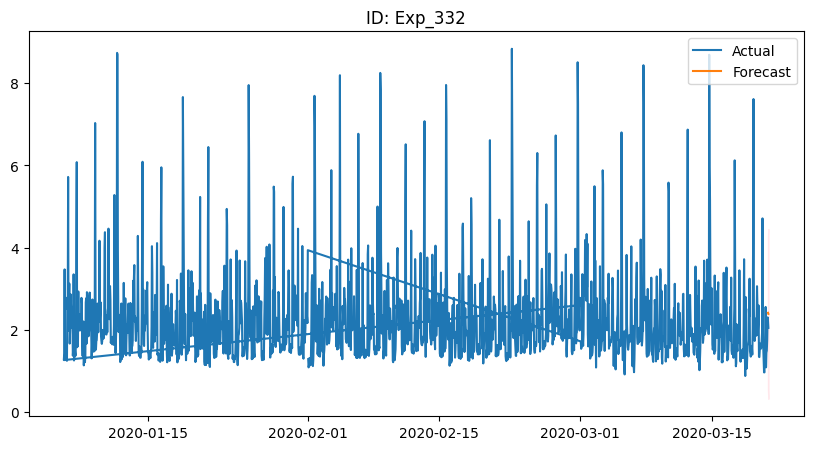

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


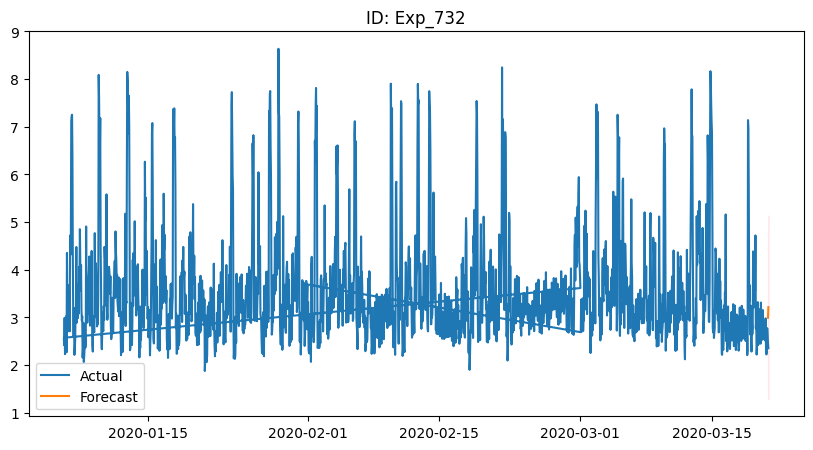

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


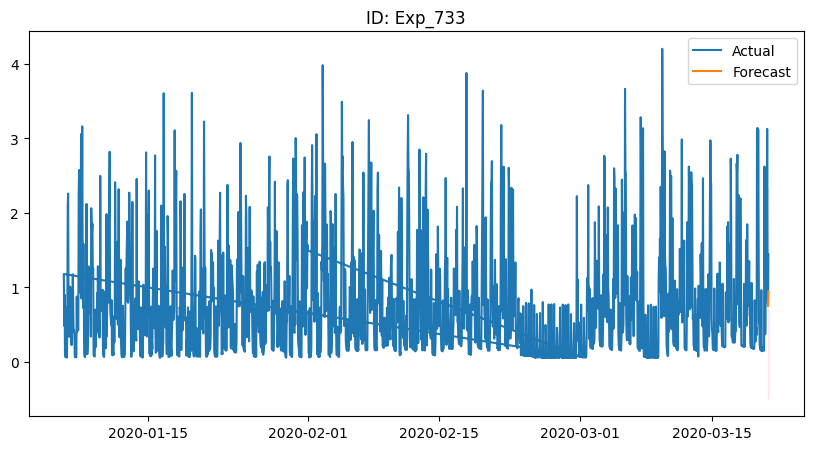

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


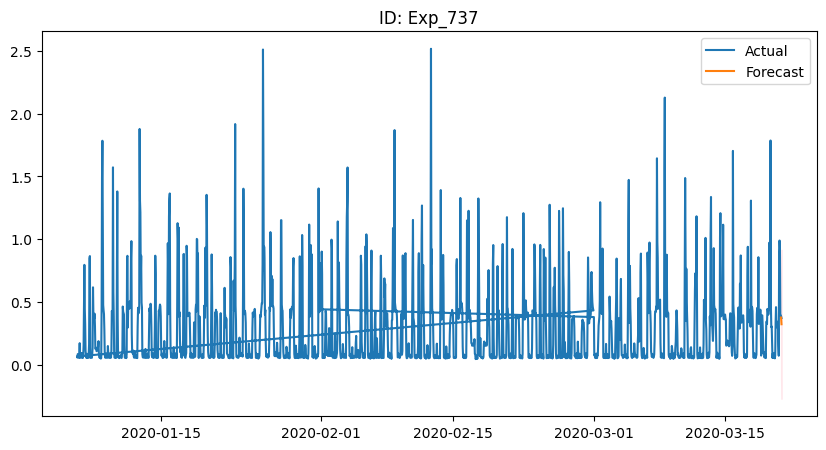

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


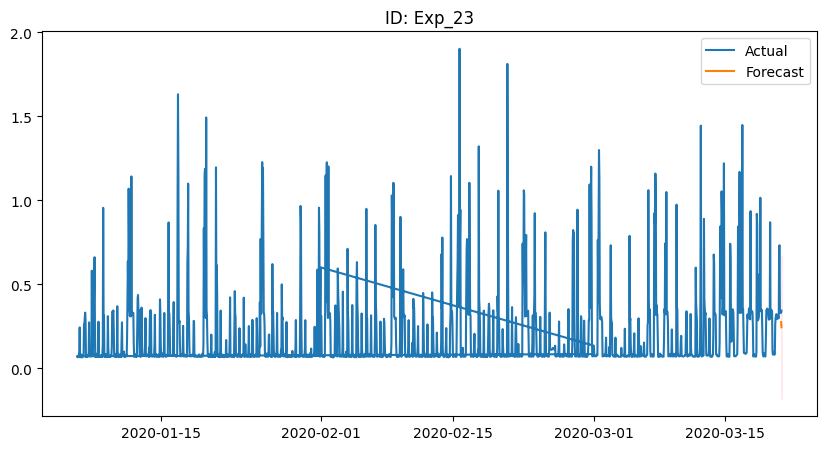

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


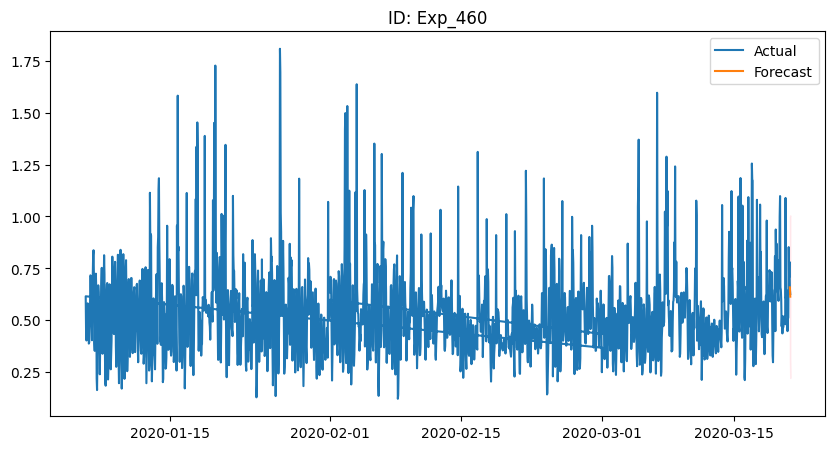

In [ ]:
# Function to perform auto ARIMAX and predict
def auto_arimax_forecast(df1, id_column, target_column, exogenous_column, forecast_periods):
    unique_ids = df1[id_column].unique()
    forecasts = {}

    for unique_id in unique_ids:
        subset = df1[df1[id_column] == unique_id]
        target = subset[target_column]
        exogenous = subset[[exogenous_column]]

        train_target, test_target, train_exog, test_exog = train_test_split(target, exogenous, test_size=forecast_periods)

        model = pm.auto_arima(train_target, exogenous=train_exog, seasonal=False, stepwise=True, suppress_warnings=True)
        forecast, conf_int = model.predict(n_periods=forecast_periods, exogenous=test_exog, return_conf_int=True)

        forecasts[unique_id] = {
            'forecast': forecast,
            'conf_int': conf_int,
            'model': model
        }

        # Plotting the results
        plt.figure(figsize=(10, 5))
        plt.plot(target.index, target, label='Actual')
        plt.plot(test_target.index, forecast, label='Forecast')
        plt.fill_between(test_target.index, conf_int[:, 0], conf_int[:, 1], color='pink', alpha=0.3)
        plt.title(f'ID: {unique_id}')
        plt.legend()
        plt.show()

    return forecasts

# Perform forecasting
forecasts = auto_arimax_forecast(df1, 'ID', 'Demand_kWh', 'Temperature', forecast_periods=2)

In [ ]:
def auto_arimax_forecast_with_accuracy(df1, id_column, target_column, exogenous_column, test_size=0.2):
    unique_ids = df1[id_column].unique()
    results = []

    for unique_id in unique_ids:
        subset = df1[df1[id_column] == unique_id]
        target = subset[target_column]
        exogenous = subset[[exogenous_column]]

        train_size = int(len(target) * (1 - test_size))
        train_target, test_target = target[:train_size], target[train_size:]
        train_exog, test_exog = exogenous[:train_size], exogenous[train_size:]

        model = pm.auto_arima(train_target, exogenous=train_exog, seasonal=False, stepwise=True, suppress_warnings=True)
        forecast, conf_int = model.predict(n_periods=len(test_target), exogenous=test_exog, return_conf_int=True)

        # Calculate accuracy metrics
        mae = mean_absolute_error(test_target, forecast)
        mse = mean_squared_error(test_target, forecast)
        rmse = np.sqrt(mse)

        results.append({
            'ID': unique_id,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'Forecast': forecast,
            'Conf_int': conf_int,
            'Model': model
        })

        # Plotting the results
        plt.figure(figsize=(10, 5))
        plt.plot(target.index, target, label='Actual')
        plt.plot(test_target.index, forecast, label='Forecast')
        plt.fill_between(test_target.index, conf_int[:, 0], conf_int[:, 1], color='pink', alpha=0.3)
        plt.title(f'ID: {unique_id}')
        plt.legend()
        plt.show()

    return results

# Perform forecasting with accuracy
results = auto_arimax_forecast_with_accuracy(df1, 'ID', 'Demand_kWh', 'Temperature', test_size=0.2)

i =1
# Display accuracy results
for result in results:
    print(f"ID: {result['ID']}")
    print(f"MAE: {result['MAE']:.2f}")
    print(f"MSE: {result['MSE']:.2f}")
    print(f"RMSE: {result['RMSE']:.2f}\n")
    i = i+1


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


NameError: name 'mean_absolute_error' is not defined

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


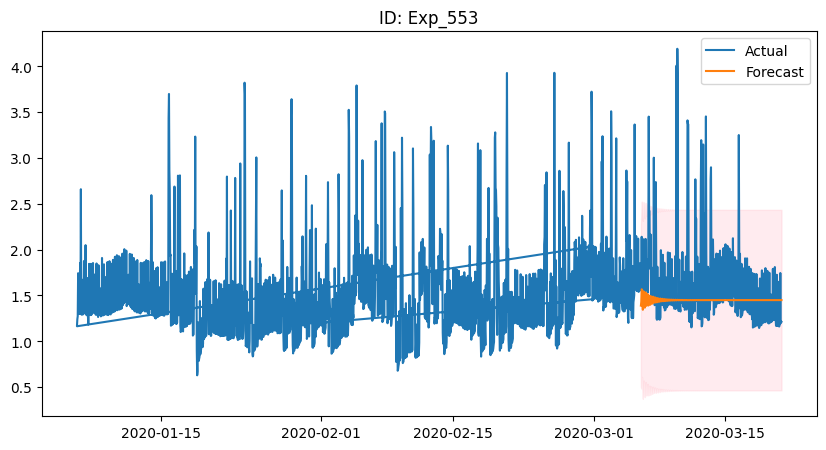

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


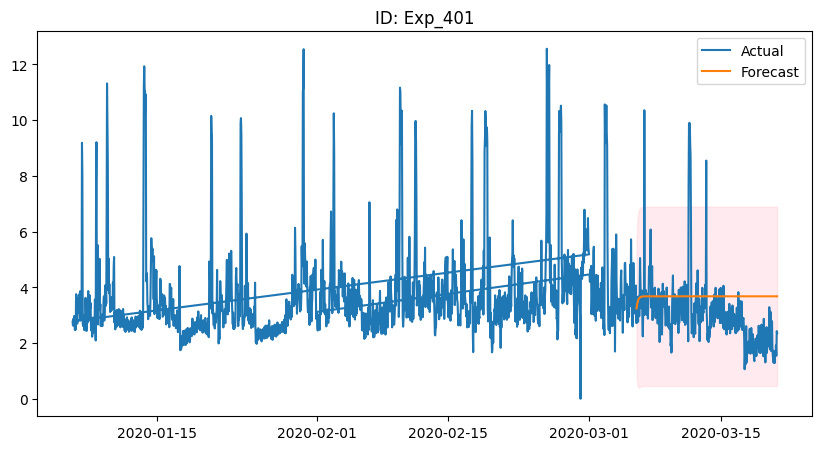

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


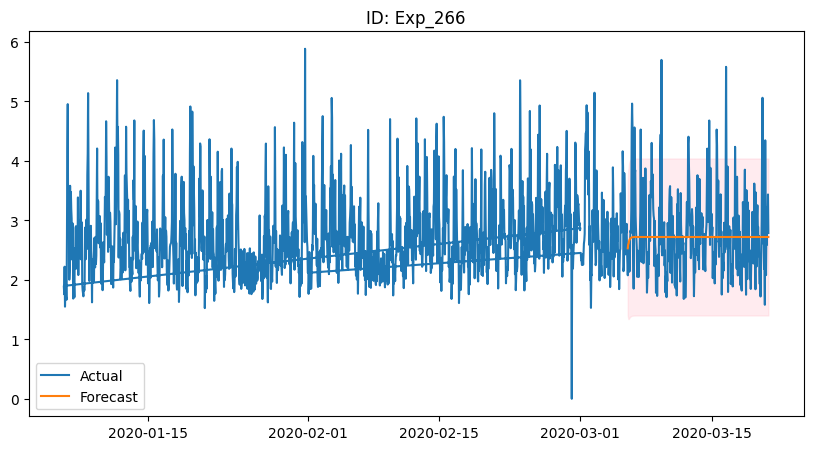

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


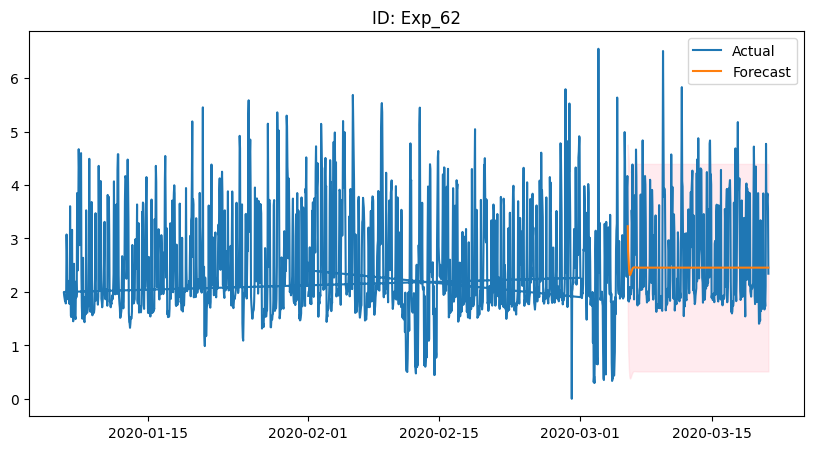

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


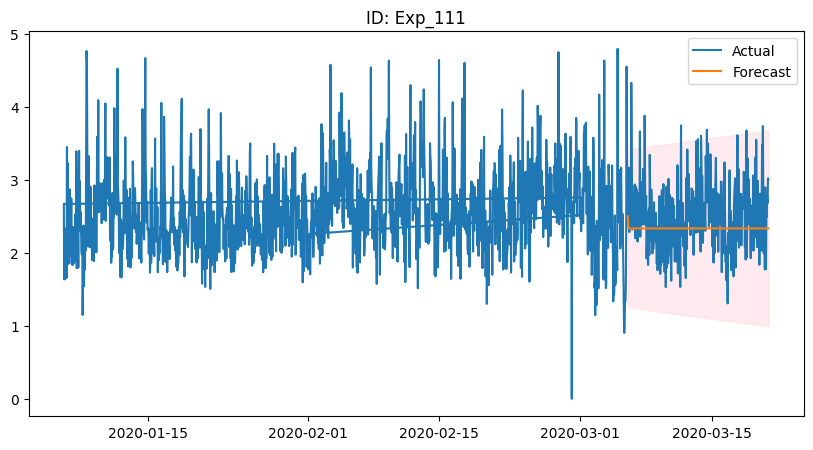

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


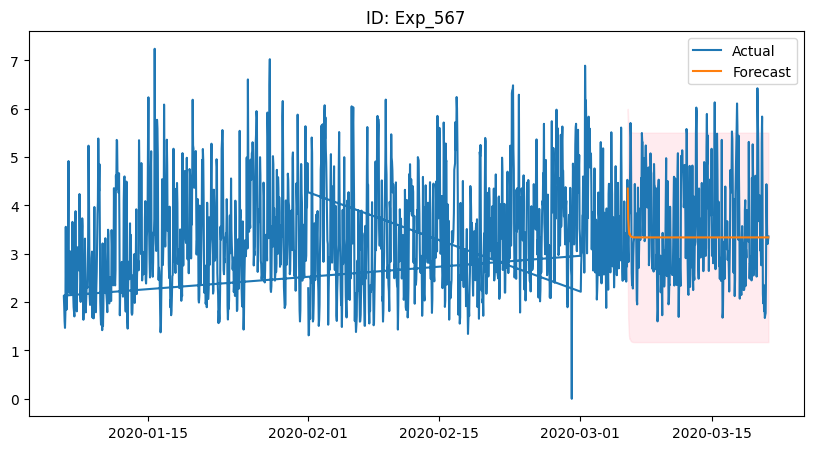

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


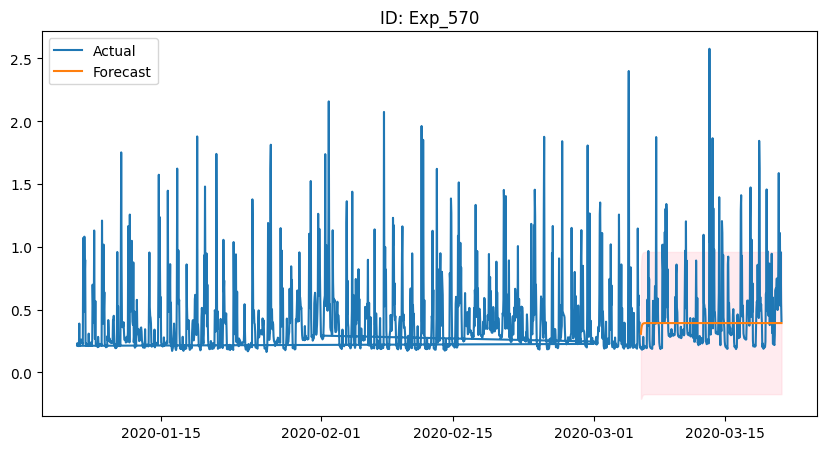

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


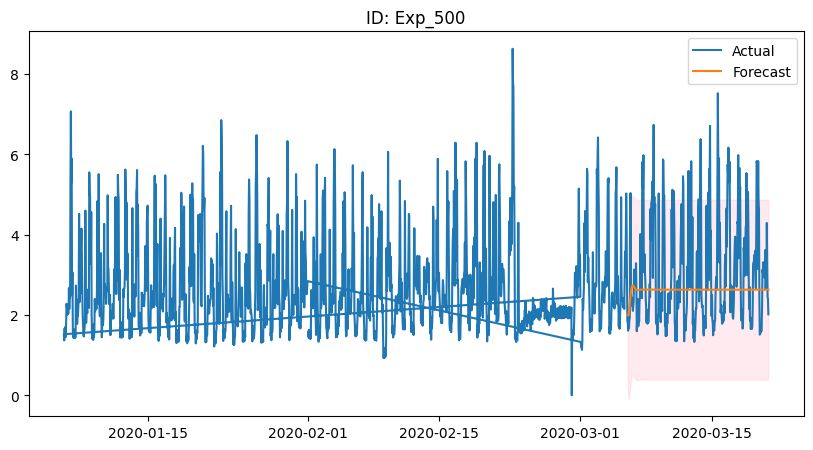

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


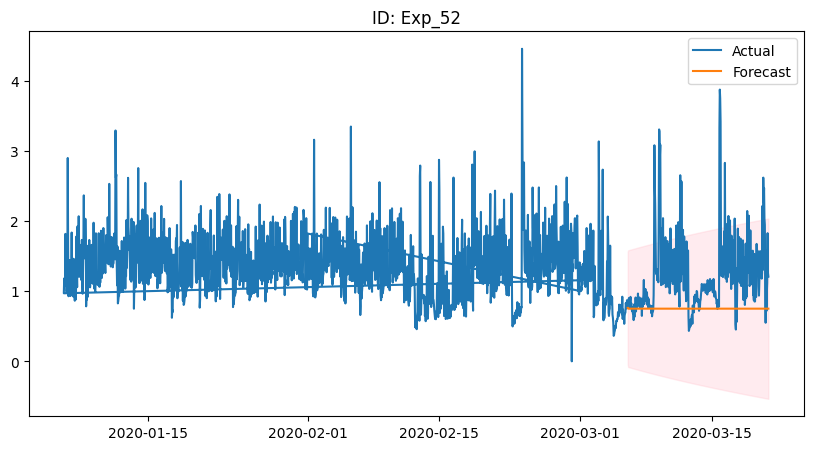

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


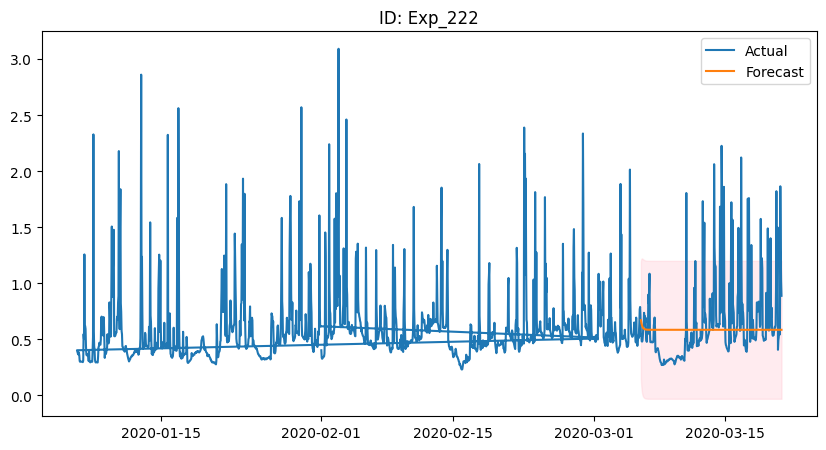

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


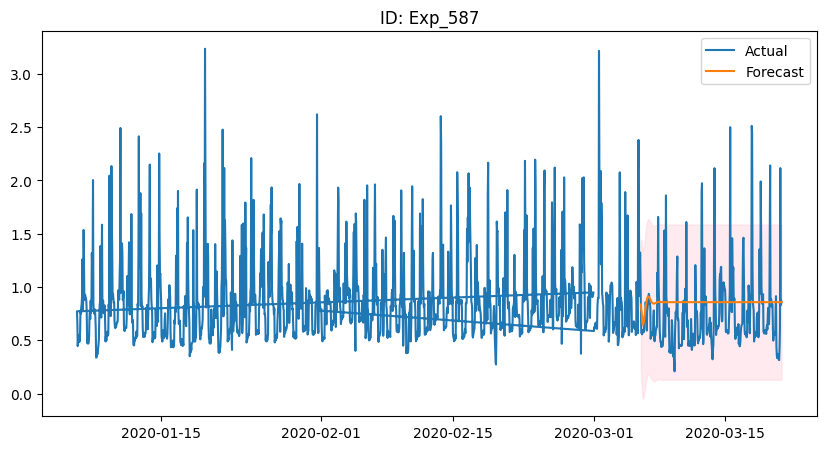

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


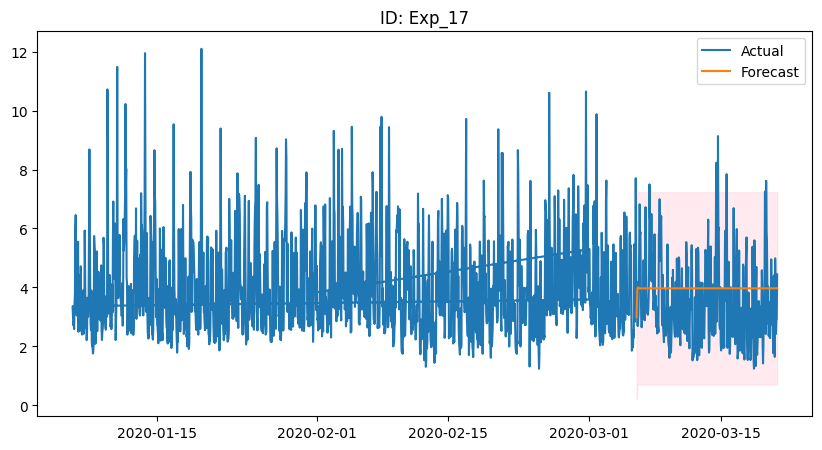

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


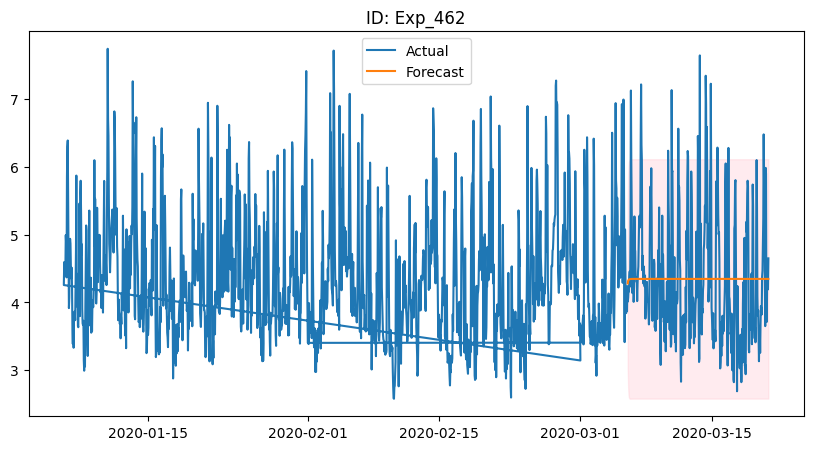

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


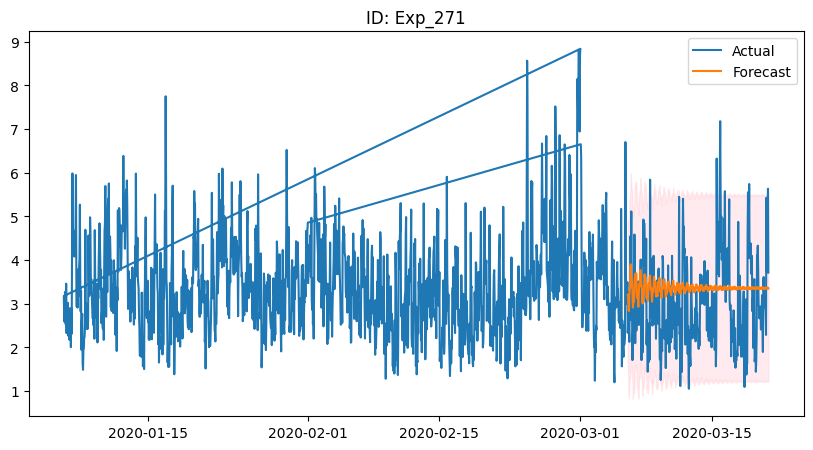

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


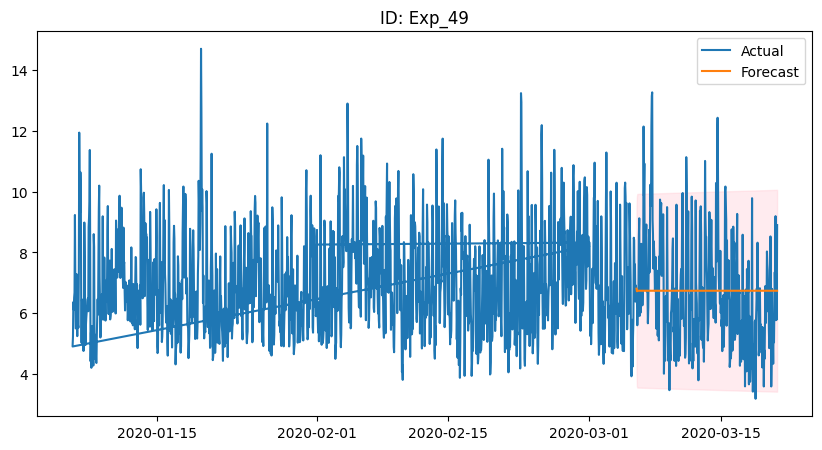

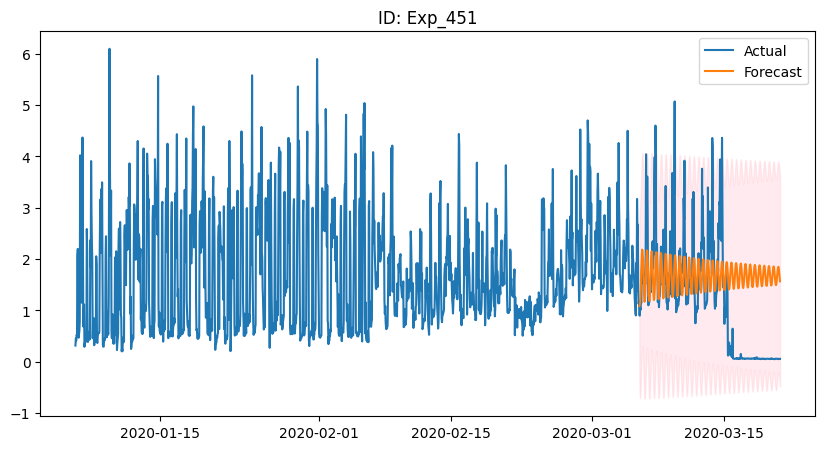

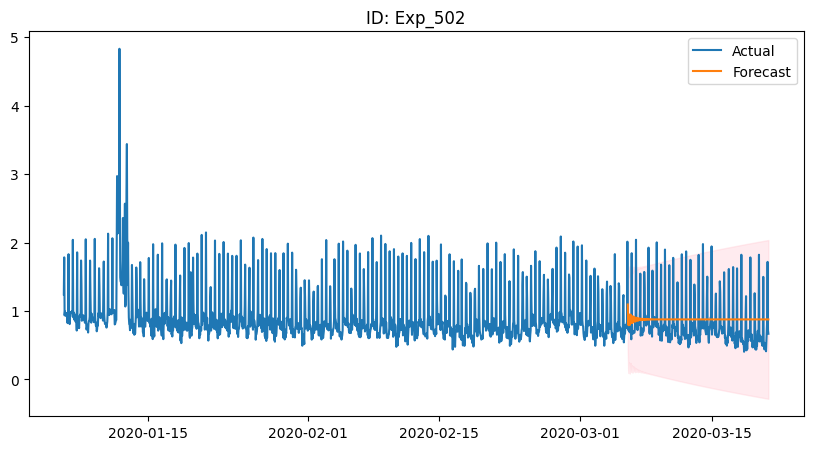

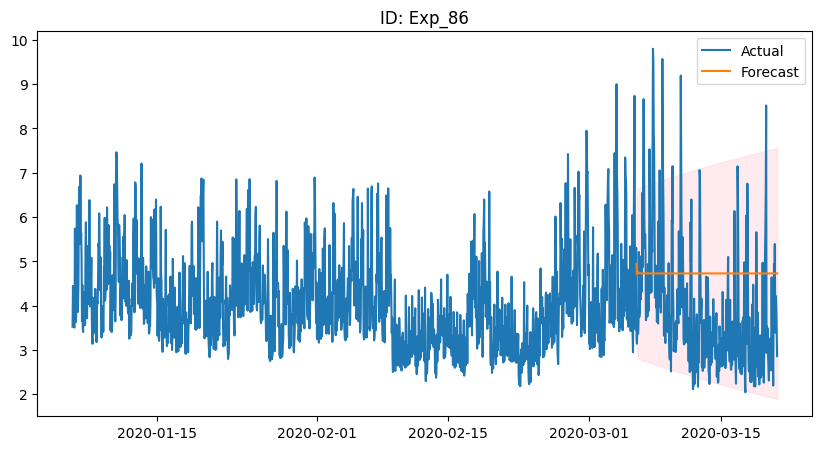

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


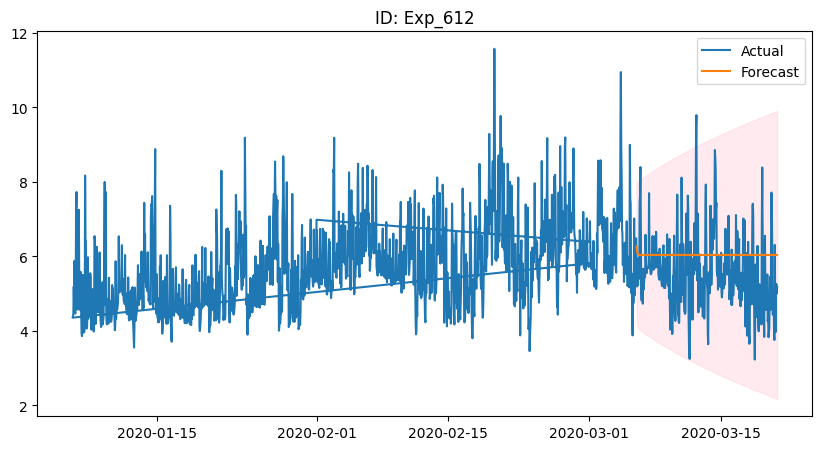

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


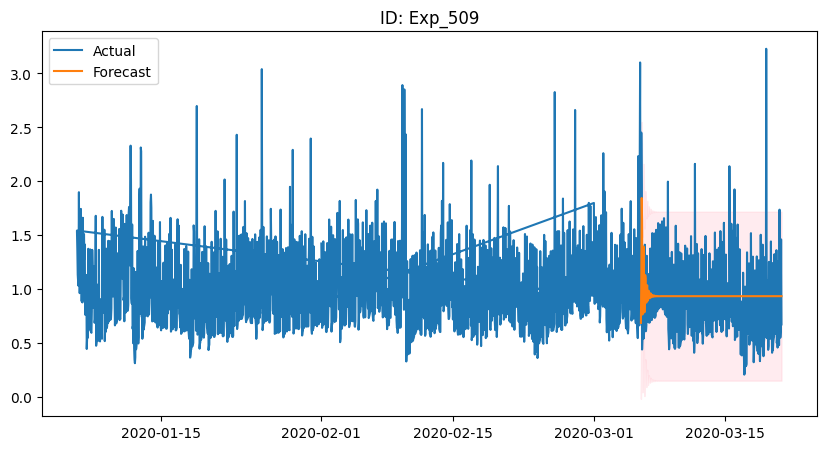

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


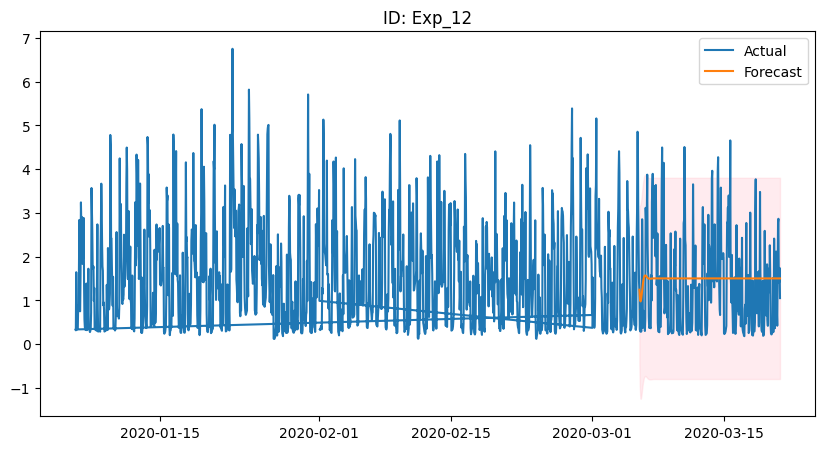

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


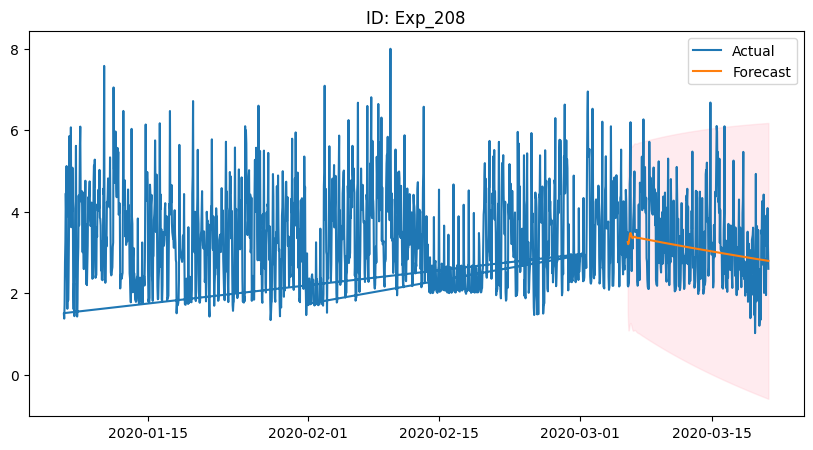

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


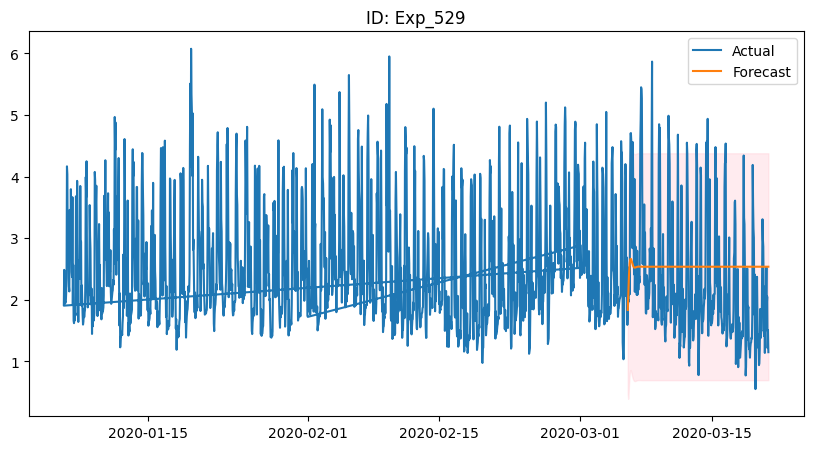

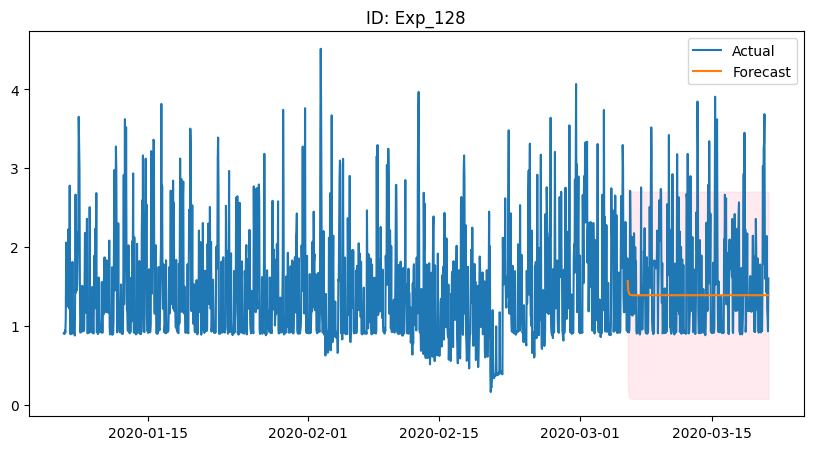

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


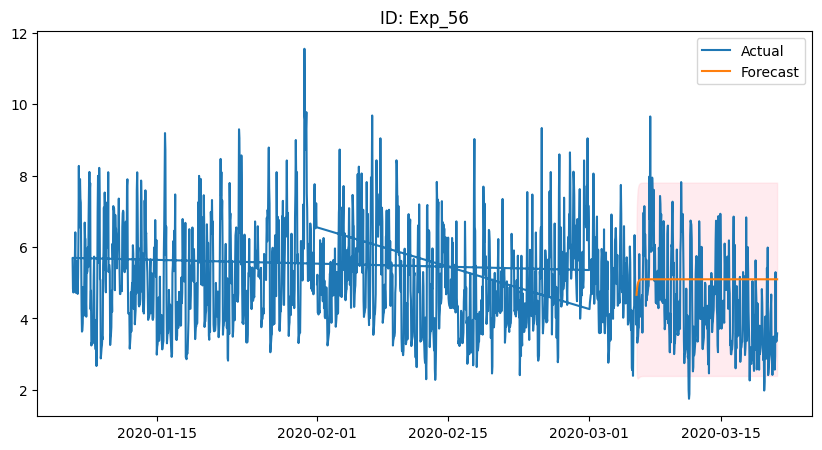

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


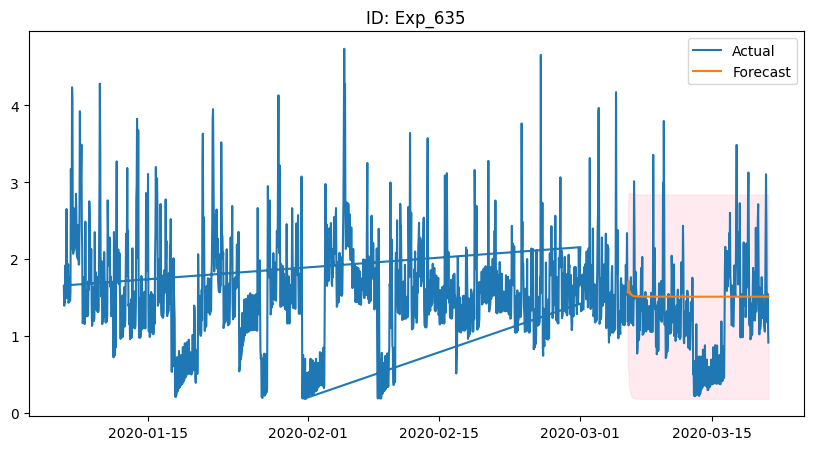

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


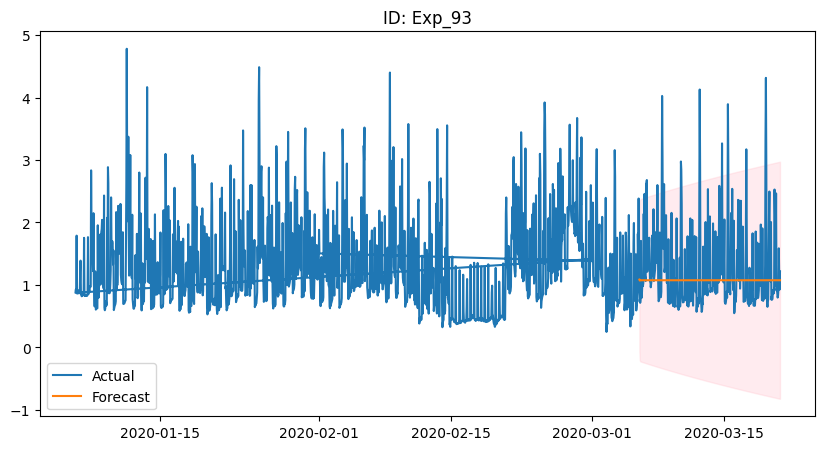

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


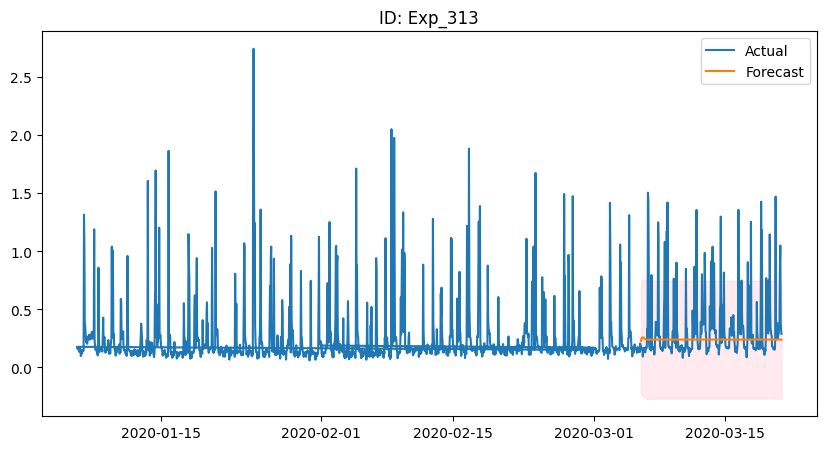

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


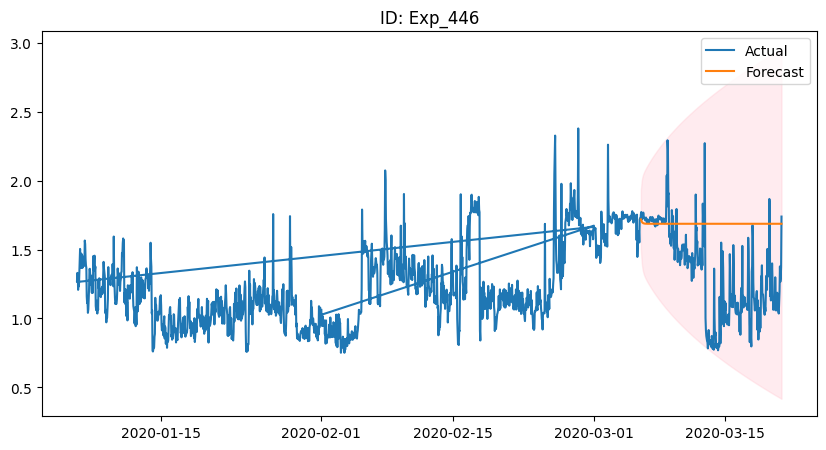

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


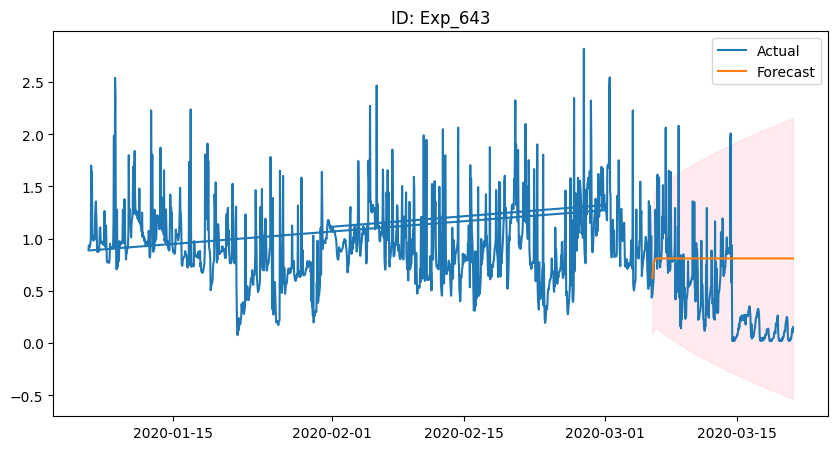

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


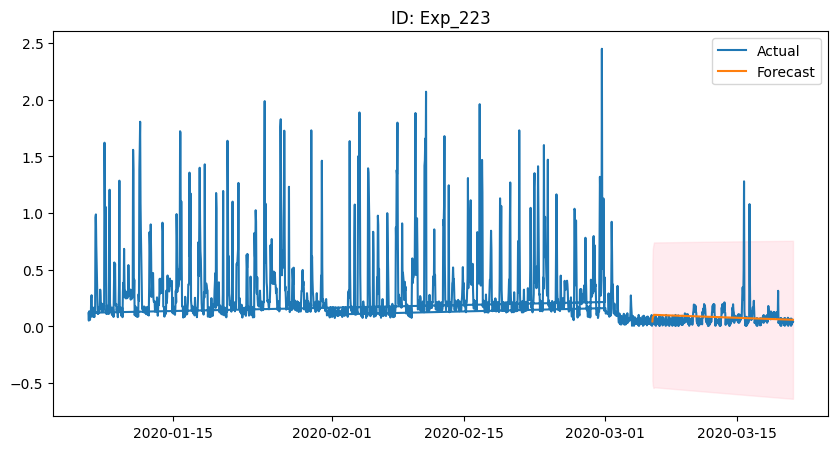

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


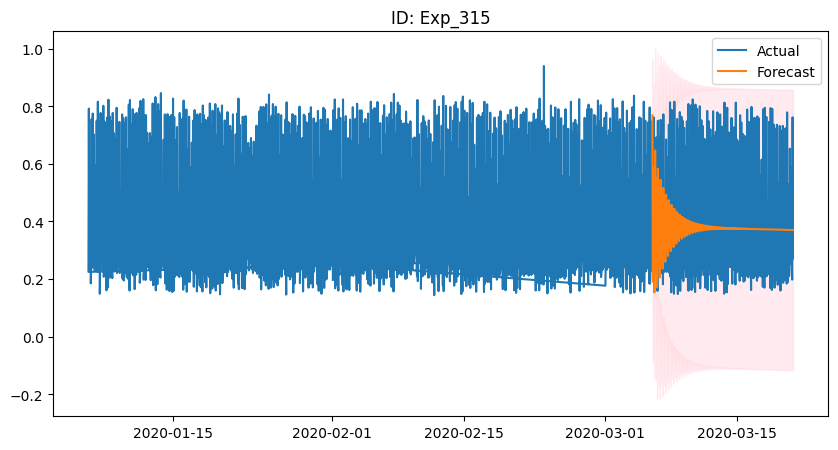

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


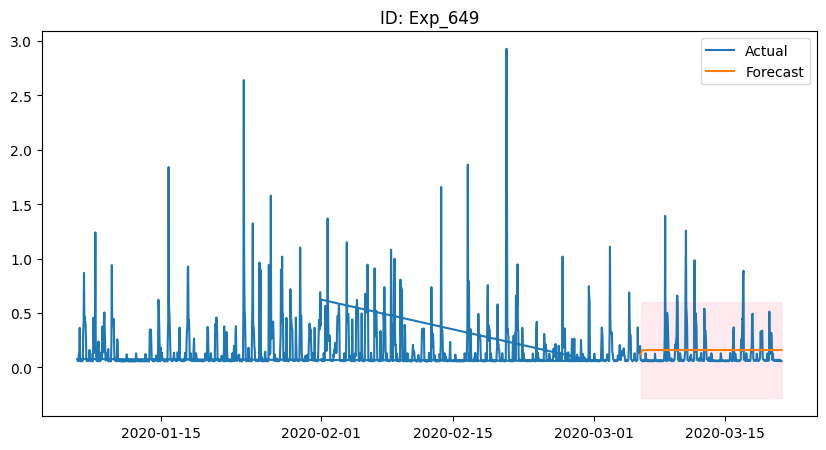

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


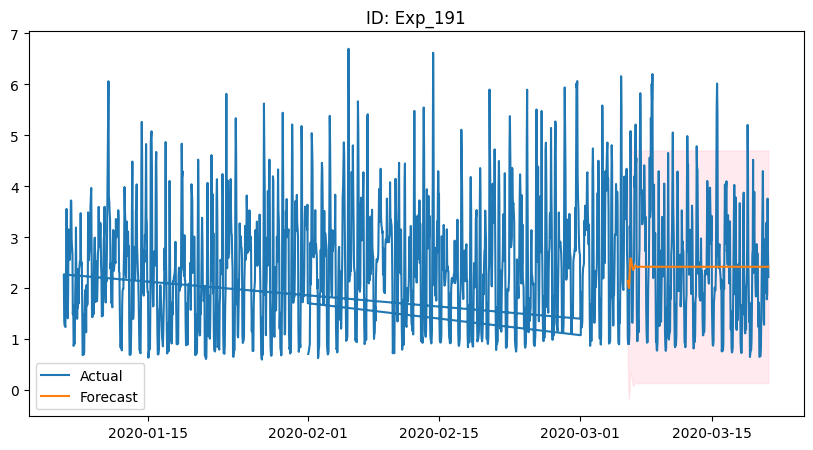

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


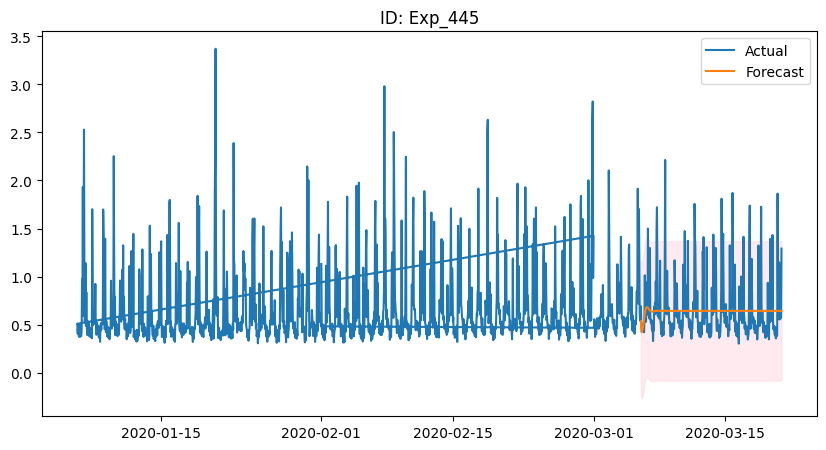

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


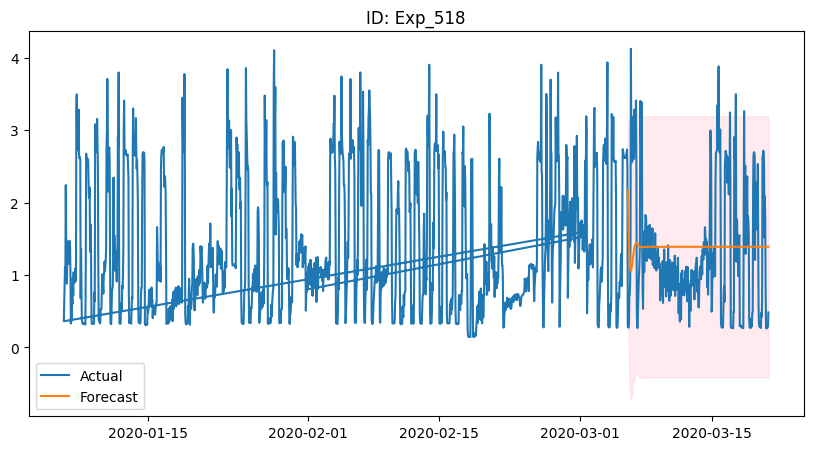

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


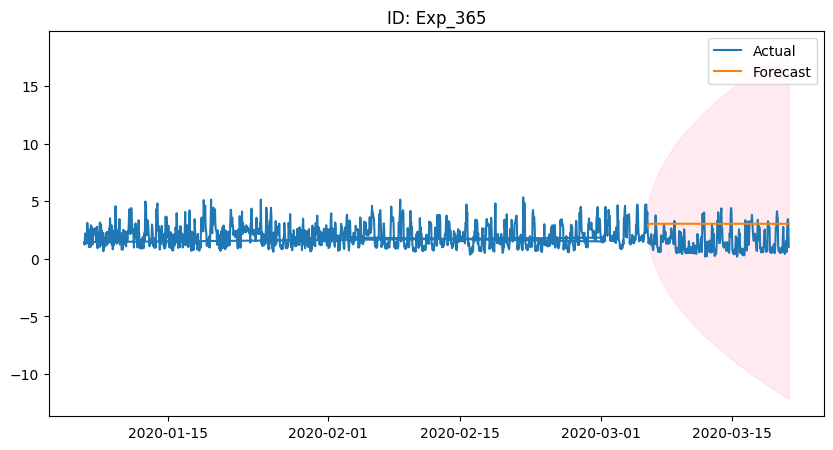

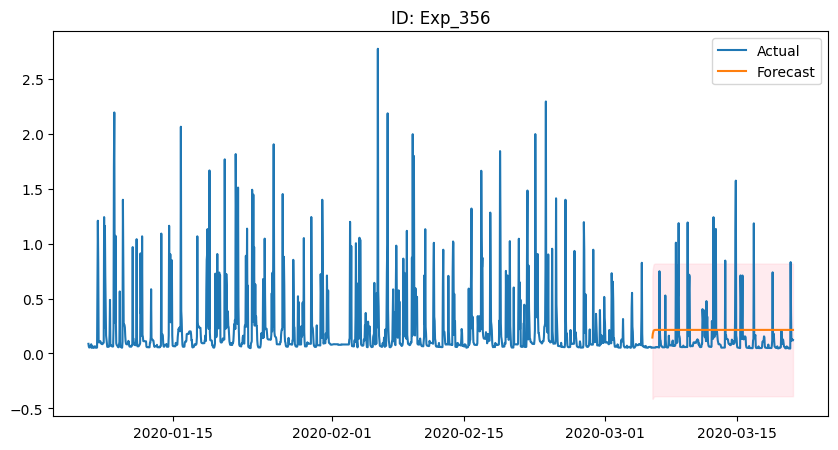

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


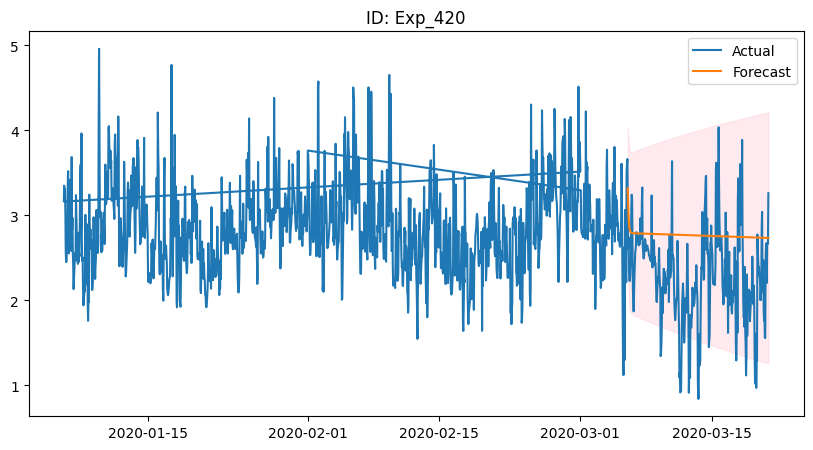

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


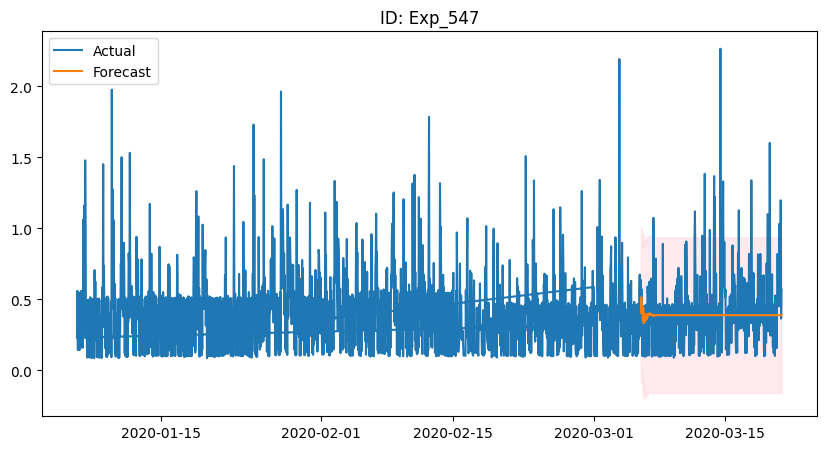

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


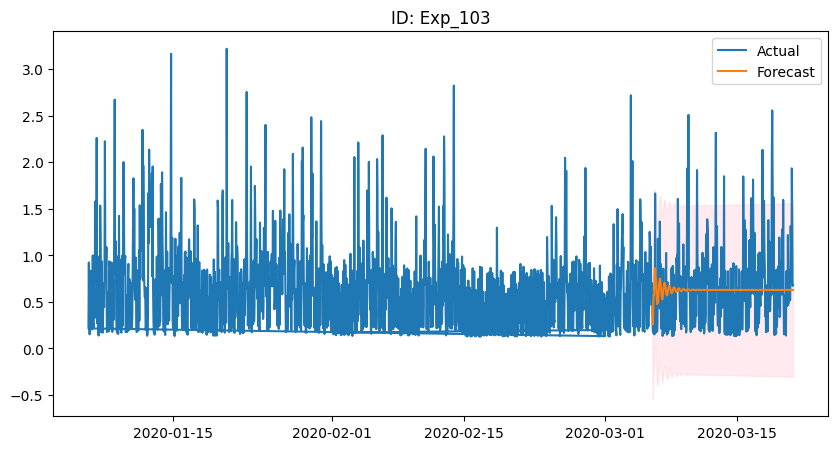

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


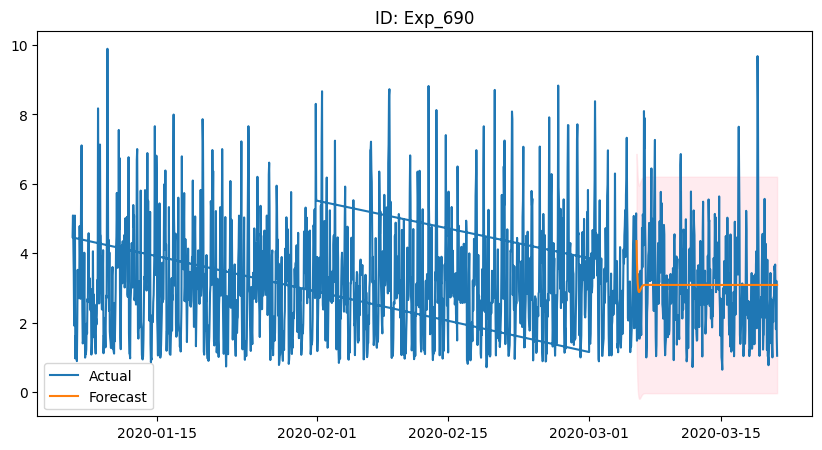

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


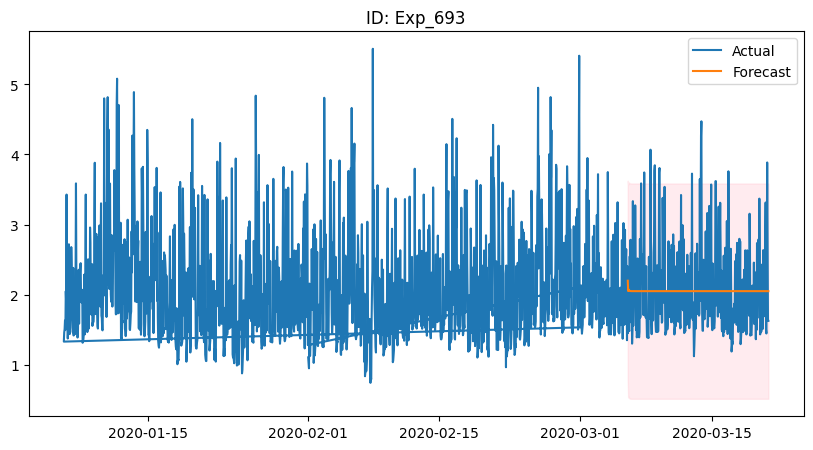

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


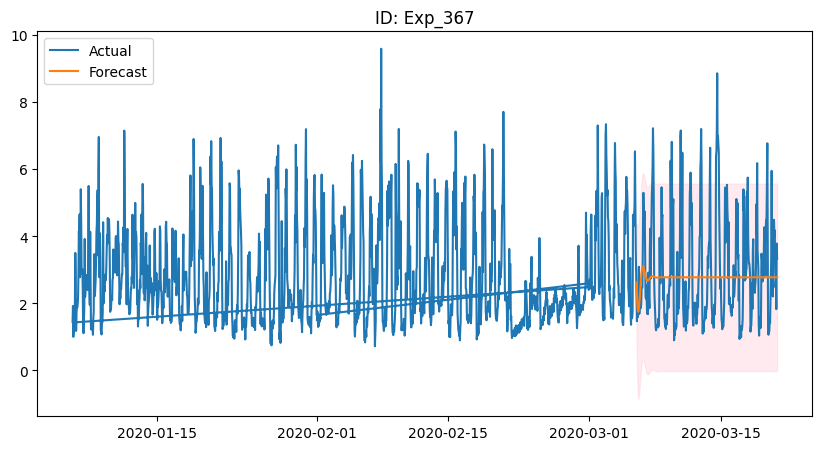

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


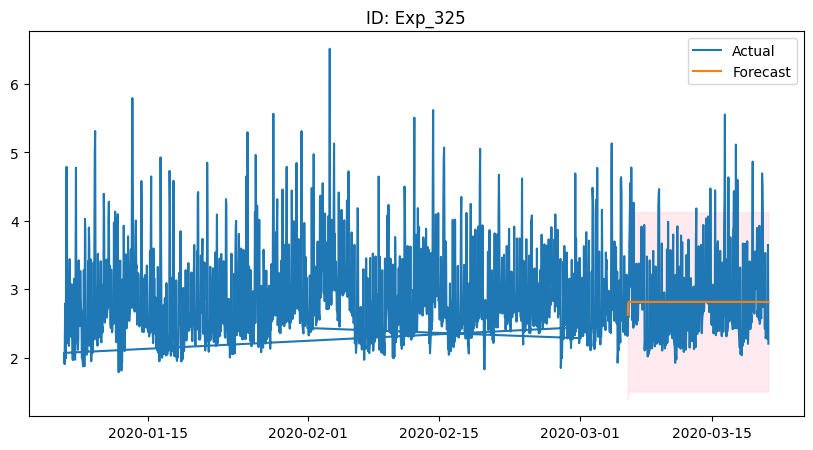

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


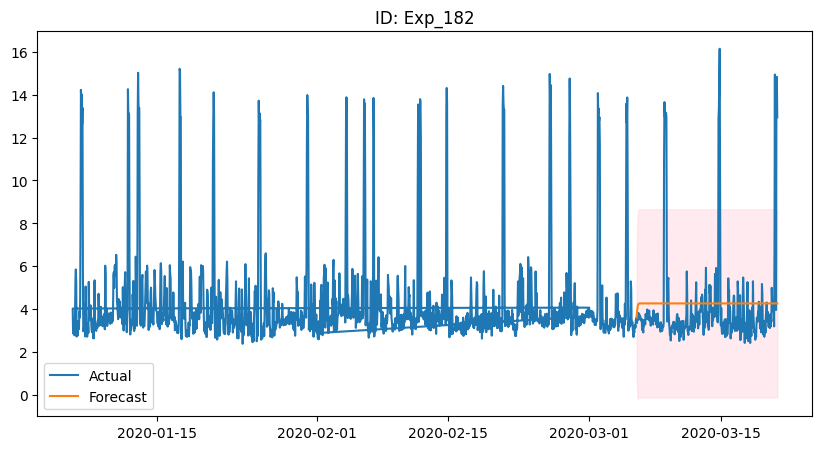

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


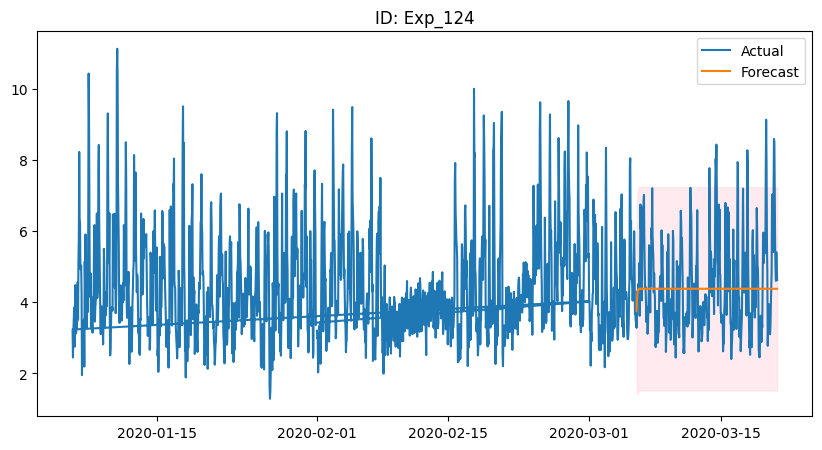

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


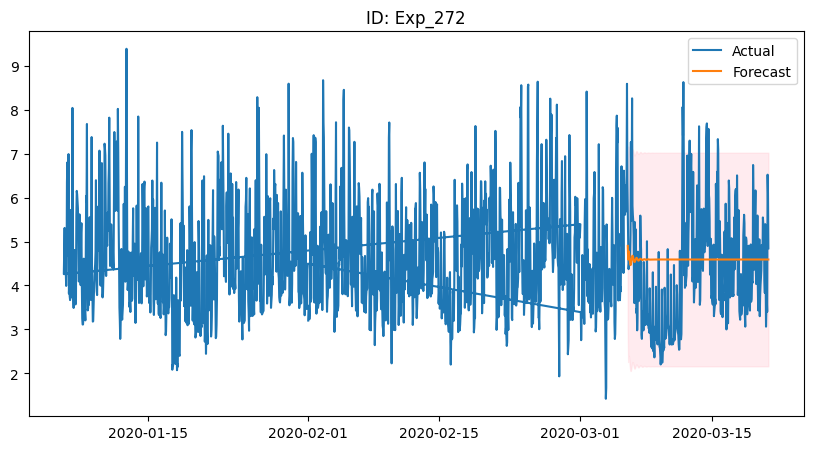

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


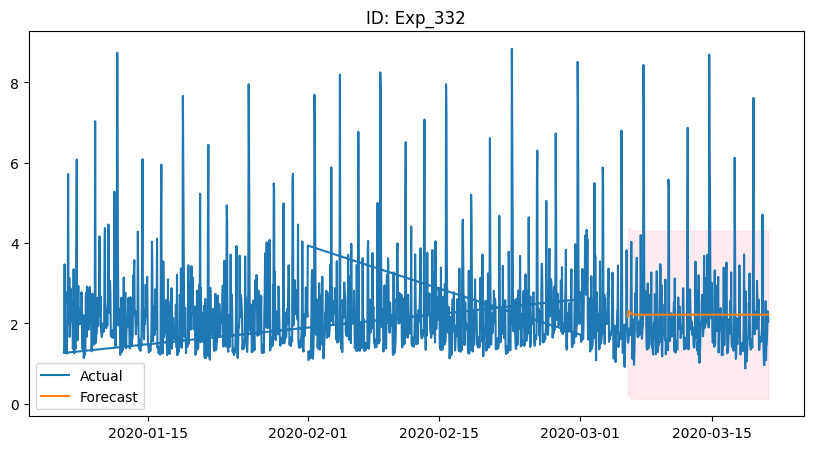

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


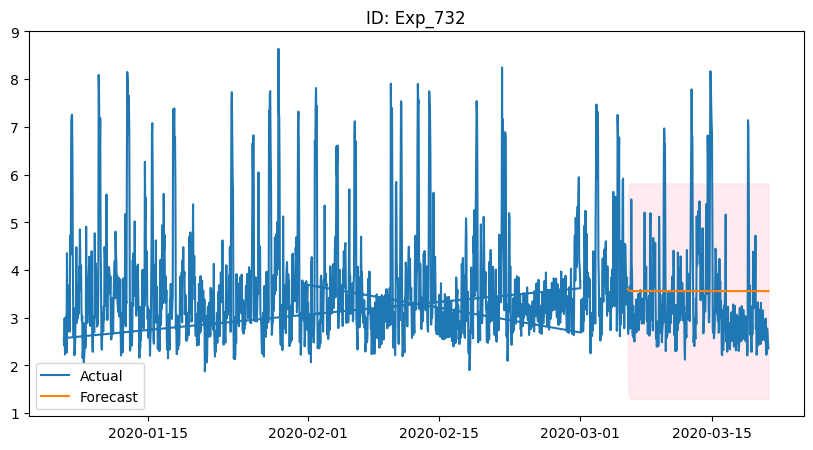

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


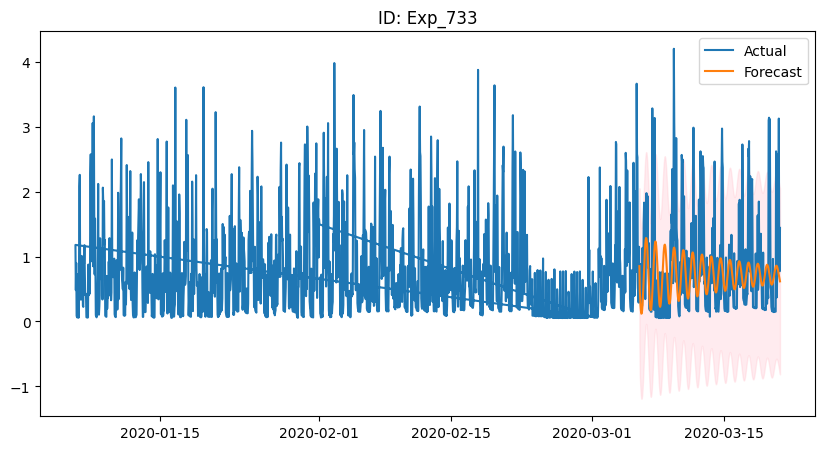

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


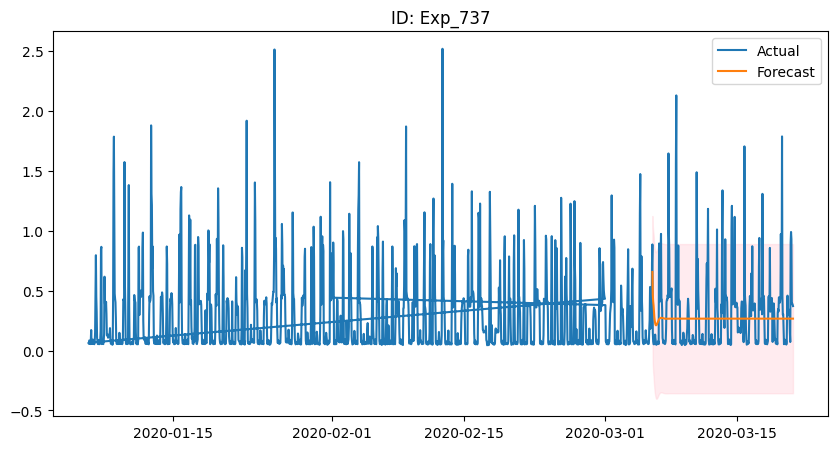

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


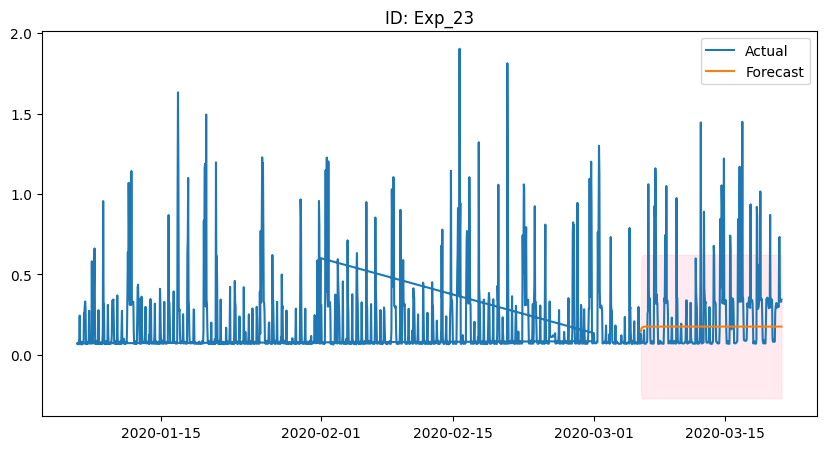

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


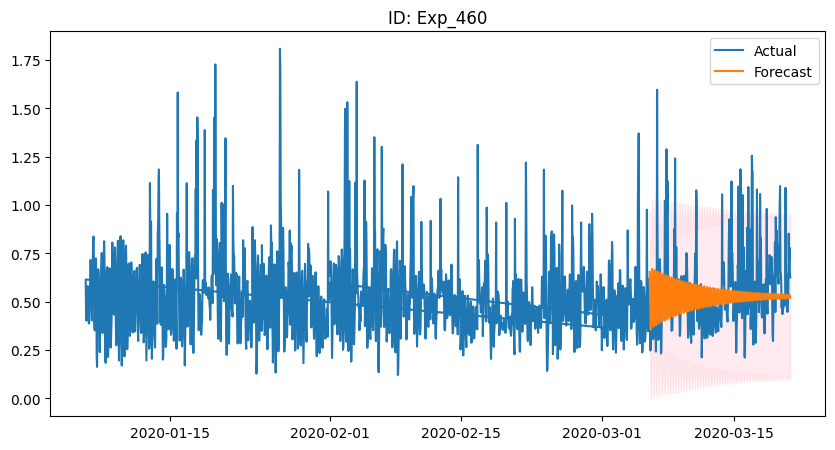

ID: Exp_553
MAE: 0.29
MSE: 0.24
RMSE: 0.49

ID: Exp_401
MAE: 1.06
MSE: 1.99
RMSE: 1.41

ID: Exp_266
MAE: 0.51
MSE: 0.47
RMSE: 0.68

ID: Exp_62
MAE: 0.78
MSE: 0.95
RMSE: 0.97

ID: Exp_111
MAE: 0.40
MSE: 0.26
RMSE: 0.51

ID: Exp_567
MAE: 0.84
MSE: 1.11
RMSE: 1.06

ID: Exp_570
MAE: 0.21
MSE: 0.11
RMSE: 0.34

ID: Exp_500
MAE: 1.03
MSE: 1.90
RMSE: 1.38

ID: Exp_52
MAE: 0.48
MSE: 0.49
RMSE: 0.70

ID: Exp_222
MAE: 0.23
MSE: 0.13
RMSE: 0.36

ID: Exp_587
MAE: 0.27
MSE: 0.13
RMSE: 0.36

ID: Exp_17
MAE: 1.34
MSE: 2.37
RMSE: 1.54

ID: Exp_462
MAE: 0.76
MSE: 0.90
RMSE: 0.95

ID: Exp_271
MAE: 0.88
MSE: 1.11
RMSE: 1.05

ID: Exp_49
MAE: 1.45
MSE: 3.32
RMSE: 1.82

ID: Exp_451
MAE: 0.96
MSE: 1.39
RMSE: 1.18

ID: Exp_502
MAE: 0.25
MSE: 0.11
RMSE: 0.33

ID: Exp_86
MAE: 1.45
MSE: 2.78
RMSE: 1.67

ID: Exp_612
MAE: 0.94
MSE: 1.32
RMSE: 1.15

ID: Exp_509
MAE: 0.35
MSE: 0.17
RMSE: 0.41

ID: Exp_12
MAE: 0.90
MSE: 1.13
RMSE: 1.06

ID: Exp_208
MAE: 0.82
MSE: 1.01
RMSE: 1.01

ID: Exp_529
MAE: 0.90
MSE: 1.14
RMSE: 

In [ ]:
def auto_arimax_forecast_with_accuracy(df1, id_column, target_column, exogenous_column, test_size=0.2):
    unique_ids = df1[id_column].unique()
    results = []

    for unique_id in unique_ids:
        subset = df1[df1[id_column] == unique_id]
        target = subset[target_column]
        exogenous = subset[[exogenous_column]]

        train_size = int(len(target) * (1 - test_size))
        train_target, test_target = target[:train_size], target[train_size:]
        train_exog, test_exog = exogenous[:train_size], exogenous[train_size:]

        model = pm.auto_arima(train_target, exogenous=train_exog, seasonal=False, stepwise=True, suppress_warnings=True)
        forecast, conf_int = model.predict(n_periods=len(test_target), exogenous=test_exog, return_conf_int=True)

        # Calculate accuracy metrics
        mae = mean_absolute_error(test_target, forecast)
        mse = mean_squared_error(test_target, forecast)
        rmse = np.sqrt(mse)

        results.append({
            'ID': unique_id,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse,
            'Forecast': forecast,
            'Conf_int': conf_int,
            'Model': model
        })

        # Plotting the results
        plt.figure(figsize=(10, 5))
        plt.plot(target.index, target, label='Actual')
        plt.plot(test_target.index, forecast, label='Forecast')
        plt.fill_between(test_target.index, conf_int[:, 0], conf_int[:, 1], color='pink', alpha=0.3)
        plt.title(f'ID: {unique_id}')
        plt.legend()
        plt.show()

    return results

# Perform forecasting with accuracy
results = auto_arimax_forecast_with_accuracy(df1, 'ID', 'Demand_kWh', 'Temperature', test_size=0.2)

# Display accuracy results
for result in results:
    print(f"ID: {result['ID']}")
    print(f"MAE: {result['MAE']:.2f}")
    print(f"MSE: {result['MSE']:.2f}")
    print(f"RMSE: {result['RMSE']:.2f}\n")


In [ ]:
# Display accuracy results
i=1
for result in results:
    print(i,"\n")
    print(f"ID: {result['ID']}")
    print(f"MAE: {result['MAE']:.2f}")
    print(f"MSE: {result['MSE']:.2f}")
    print(f"RMSE: {result['RMSE']:.2f}\n")
    i=i+1

1 

ID: Exp_553
MAE: 0.29
MSE: 0.24
RMSE: 0.49

2 

ID: Exp_401
MAE: 1.06
MSE: 1.99
RMSE: 1.41

3 

ID: Exp_266
MAE: 0.51
MSE: 0.47
RMSE: 0.68

4 

ID: Exp_62
MAE: 0.78
MSE: 0.95
RMSE: 0.97

5 

ID: Exp_111
MAE: 0.40
MSE: 0.26
RMSE: 0.51

6 

ID: Exp_567
MAE: 0.84
MSE: 1.11
RMSE: 1.06

7 

ID: Exp_570
MAE: 0.21
MSE: 0.11
RMSE: 0.34

8 

ID: Exp_500
MAE: 1.03
MSE: 1.90
RMSE: 1.38

9 

ID: Exp_52
MAE: 0.48
MSE: 0.49
RMSE: 0.70

10 

ID: Exp_222
MAE: 0.23
MSE: 0.13
RMSE: 0.36

11 

ID: Exp_587
MAE: 0.27
MSE: 0.13
RMSE: 0.36

12 

ID: Exp_17
MAE: 1.34
MSE: 2.37
RMSE: 1.54

13 

ID: Exp_462
MAE: 0.76
MSE: 0.90
RMSE: 0.95

14 

ID: Exp_271
MAE: 0.88
MSE: 1.11
RMSE: 1.05

15 

ID: Exp_49
MAE: 1.45
MSE: 3.32
RMSE: 1.82

16 

ID: Exp_451
MAE: 0.96
MSE: 1.39
RMSE: 1.18

17 

ID: Exp_502
MAE: 0.25
MSE: 0.11
RMSE: 0.33

18 

ID: Exp_86
MAE: 1.45
MSE: 2.78
RMSE: 1.67

19 

ID: Exp_612
MAE: 0.94
MSE: 1.32
RMSE: 1.15

20 

ID: Exp_509
MAE: 0.35
MSE: 0.17
RMSE: 0.41

21 

ID: Exp_12
MAE: 0.90
MSE: 1.1

arima

In [ ]:
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the dataset

data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')
# Convert 'Date' and 'Hour' into a single datetime column
data['Datetime'] = pd.to_datetime(data['Date']) + pd.to_timedelta(data['Hour'] - 1, unit='h')

# Sort data by ID and Datetime
data.sort_values(by=['ID', 'Datetime'], inplace=True)

# Prepare the data by splitting it into training and testing sets based on the 80:20 ratio
# Split the data for each ID separately
train_data = pd.DataFrame()
test_data = pd.DataFrame()

unique_ids = data['ID'].unique()
for unique_id in unique_ids:
    id_data = data[data['ID'] == unique_id]
    train_size = int(len(id_data) * 0.8)

    id_train_data = id_data.iloc[:train_size]
    id_test_data = id_data.iloc[train_size:]

    train_data = pd.concat([train_data, id_train_data])
    test_data = pd.concat([test_data, id_test_data])

# Define the exogenous variables
exog_columns = ['Temperature']

# Function to fit auto ARIMA and forecast
def fit_predict_auto_arima(train, test, exog_columns):
    model = sm.tsa.statespace.SARIMAX(train['Demand_kWh'],
                                      exog=train[exog_columns],
                                      order=(1, 1, 1),
                                      seasonal_order=(1, 1, 1, 24))
    results = model.fit(disp=False)
    forecast = results.predict(start=len(train), end=len(train) + len(test) - 1, exog=test[exog_columns])
    return forecast

# Initialize lists to store results
all_forecasts_list = []
performance_metrics = []

# Process data in smaller batches
batch_size = 5

for i in range(0, len(unique_ids), batch_size):
    batch_ids = unique_ids[i:i + batch_size]
    for unique_id in batch_ids:
        train_id_data = train_data[train_data['ID'] == unique_id]
        test_id_data = test_data[test_data['ID'] == unique_id]

        forecast = fit_predict_auto_arima(train_id_data, test_id_data, exog_columns)

        test_id_data = test_id_data.copy()
        test_id_data['Forecasted_Demand_kWh'] = forecast.values

        # Calculate performance metrics
        mae = mean_absolute_error(test_id_data['Demand_kWh'], test_id_data['Forecasted_Demand_kWh'])
        mse = mean_squared_error(test_id_data['Demand_kWh'], test_id_data['Forecasted_Demand_kWh'])
        rmse = np.sqrt(mse)

        performance_metrics.append({
            'ID': unique_id,
            'MAE': mae,
            'MSE': mse,
            'RMSE': rmse
        })

        all_forecasts_list.append(test_id_data)

    print(f"Processed batch {i + 1} to {i + batch_size}")

# Combine all forecasted data
all_forecasts = pd.concat(all_forecasts_list)

# Convert performance metrics to DataFrame
performance_metrics_df = pd.DataFrame(performance_metrics)

# Display the performance metrics
print("Performance Metrics for Test Data with Only Temperature:")
print(performance_metrics_df)

# Display the first few rows of the forecasted data with actual and predicted values
all_forecasts_display = all_forecasts[['ID', 'Datetime', 'Demand_kWh', 'Forecasted_Demand_kWh']]
print("Forecasted vs Actual Demand_kWh for Test Data with Only Temperature:")
print(all_forecasts_display.head())

# Save results
performance_metrics_df.to_csv('performance_metrics.csv', index=False)
all_forecasts_display.to_csv('all_forecasts.csv', index=False)

print("Final performance metrics:")
print(performance_metrics_df.head())
print("Final forecast vs actual:")
print(all_forecasts_display.head())


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An u

Processed batch 1 to 5


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 6 to 10


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 11 to 15


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: N

Processed batch 16 to 20


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 21 to 25


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 26 to 30


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: N

Processed batch 31 to 35


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 36 to 40


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 41 to 45


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 46 to 50


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No s

Processed batch 51 to 55
Performance Metrics for Test Data with Only Temperature:
         ID       MAE       MSE      RMSE
0   Exp_103  0.316256  0.160610  0.400761
1   Exp_111  0.402843  0.257669  0.507611
2    Exp_12  0.685047  0.763668  0.873881
3   Exp_124  0.807647  1.214537  1.102060
4   Exp_128  0.519798  0.390210  0.624668
5    Exp_17  1.157703  2.188803  1.479460
6   Exp_182  1.850369  7.863184  2.804137
7   Exp_191  0.715393  0.899940  0.948652
8   Exp_208  0.730690  0.865288  0.930209
9   Exp_222  0.196347  0.119354  0.345476
10  Exp_223  0.133496  0.032029  0.178966
11   Exp_23  0.140918  0.057087  0.238929
12  Exp_266  0.380122  0.299670  0.547421
13  Exp_271  0.818184  1.246729  1.116570
14  Exp_272  1.014186  1.625925  1.275118
15  Exp_313  0.133019  0.064005  0.252992
16  Exp_315  0.193375  0.051515  0.226970
17  Exp_325  0.460264  0.364343  0.603608
18  Exp_332  0.594534  0.852909  0.923531
19  Exp_356  0.124611  0.041651  0.204087
20  Exp_365  0.975802  1.282902  1.1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' into a single datetime column
data['Datetime'] = pd.to_datetime(data['Date']) + pd.to_timedelta(data['Hour'] - 1, unit='h')

# Sort data by ID and Datetime
data.sort_values(by=['ID', 'Datetime'], inplace=True)

# Split the data by ID into training (80%) and testing (20%)
unique_ids = data['ID'].unique()
train_data = pd.DataFrame()
test_data = pd.DataFrame()

for unique_id in unique_ids:
    id_data = data[data['ID'] == unique_id]
    train_size = int(len(id_data) * 0.8)

    id_train_data = id_data.iloc[:train_size]
    id_test_data = id_data.iloc[train_size:]

    train_data = pd.concat([train_data, id_train_data])
    test_data = pd.concat([test_data, id_test_data])

# Define the exogenous variables
exog_columns = ['Temperature']

# Function to fit ARIMA and forecast
def fit_predict_arima(train, test, exog_columns):
    model = ARIMA(train['Demand_kWh'],
                  exog=train[exog_columns],
                  order=(1, 1, 1))
    results = model.fit()
    forecast = results.predict(start=len(train), end=len(train) + len(test) - 1, exog=test[exog_columns])
    return forecast

# Initialize lists to store results
all_forecasts_list = []
all_actuals_list = []

# Apply the model for each ID and forecast for the next 24 hours
for unique_id in unique_ids:
    train_id_data = train_data[train_data['ID'] == unique_id]
    test_id_data = test_data[test_data['ID'] == unique_id].head(24)  # Forecast for the next 24 hours

    forecast = fit_predict_arima(train_id_data, test_id_data, exog_columns)

    test_id_data = test_id_data.copy()
    test_id_data['Forecasted_Demand_kWh'] = forecast.values

    all_forecasts_list.append(test_id_data['Forecasted_Demand_kWh'])
    all_actuals_list.append(test_id_data['Demand_kWh'])

# Combine all forecasted and actual data
all_forecasts = pd.concat(all_forecasts_list)
all_actuals = pd.concat(all_actuals_list)

# Calculate overall performance metrics
mae = mean_absolute_error(all_actuals, all_forecasts)
mse = mean_squared_error(all_actuals, all_forecasts)
rmse = np.sqrt(mse)

performance_metrics = {
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse
}

# Display the performance metrics and first few rows of predictions vs actuals
performance_metrics_df = pd.DataFrame([performance_metrics])

# Create a DataFrame for forecasts and actuals
forecast_vs_actuals_df = pd.DataFrame({
    'Actual_Demand_kWh': all_actuals.values,
    'Forecasted_Demand_kWh': all_forecasts.values
})

print("Performance Metrics for Test Data:")
print(performance_metrics_df)

print("Forecasted vs Actual Demand_KWh for Test Data (first few rows):")
print(forecast_vs_actuals_df.head())

# Save results
performance_metrics_df.to_csv('performance_metrics.csv', index=False)
forecast_vs_actuals_df.to_csv('forecast_vs_actuals.csv', index=False)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Performance Metrics for Test Data:
        MAE      MSE      RMSE
0  0.566968  0.72317  0.850394
Forecasted vs Actual Demand_KWh for Test Data (first few rows):
   Actual_Demand_kWh  Forecasted_Demand_kWh
0              0.380               0.634890
1              0.189               0.620477
2              0.165               0.621025
3              0.612               0.623356
4              0.435               0.627481


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(


In [ ]:
df = pd.read_csv('/content/phase_1_data_alfy.csv')
df.head()

,ID,From,Date,Hour,Participation_Phase,Demand_kWh,Temperature,Temperature24,Temperature48,Temperature72,Day/Night
0,Exp_43,2020-02-01 00:00:00+00:00,2020-02-01,1,Phase_1,0.348,7.6,6.1,5.0,4.4,Night
1,Exp_43,2020-02-01 01:00:00+00:00,2020-02-01,2,Phase_1,0.589,8.2,6.2,5.1,4.4,Night
2,Exp_43,2020-02-01 02:00:00+00:00,2020-02-01,3,Phase_1,0.358,8.4,6.3,5.3,4.5,Night
3,Exp_43,2020-02-01 03:00:00+00:00,2020-02-01,4,Phase_1,0.582,8.4,6.4,5.4,4.5,Night
4,Exp_43,2020-02-01 04:00:00+00:00,2020-02-01,5,Phase_1,0.364,8.2,6.5,5.5,4.6,Night


In [ ]:
unique_ids = df['ID'].unique()

# Print unique IDs
print("Unique IDs in the dataset:")
print(len(unique_ids))

Unique IDs in the dataset:
742


In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' into a single datetime column
data['Datetime'] = pd.to_datetime(data['Date']) + pd.to_timedelta(data['Hour'] - 1, unit='h')

# Sort data by ID and Datetime
data.sort_values(by=['ID', 'Datetime'], inplace=True)

# Find unique IDs
unique_ids = data['ID'].unique()

# Initialize lists to store results
all_forecasts_list = []
all_actuals_list = []

# Define the exogenous variables
exog_columns = ['Temperature']

# Function to fit ARIMA and forecast
def fit_predict_arima(train, test, exog_columns):
    model = ARIMA(train['Demand_kWh'],
                  exog=train[exog_columns],
                  order=(1, 1, 1))
    results = model.fit()
    forecast = results.predict(start=len(train), end=len(train) + len(test) - 1, exog=test[exog_columns])
    return forecast

# Split the data by ID into training (80%) and testing (20%)
for unique_id in unique_ids:
    id_data = data[data['ID'] == unique_id]
    train_size = int(len(id_data) * 0.8)

    id_train_data = id_data.iloc[:train_size]
    id_test_data = id_data.iloc[train_size:]

    # Apply the model and forecast for each hour in the test data
    forecast = fit_predict_arima(id_train_data, id_test_data, exog_columns)

    id_test_data = id_test_data.copy()
    id_test_data['Forecasted_Demand_kWh'] = forecast.values

    all_forecasts_list.append(id_test_data[['ID', 'Datetime', 'Demand_kWh', 'Forecasted_Demand_kWh']])
    all_actuals_list.append(id_test_data['Demand_kWh'])

# Combine all forecasted and actual data
all_forecasts = pd.concat(all_forecasts_list)

# Calculate overall performance metrics
mae = mean_absolute_error(all_forecasts['Demand_kWh'], all_forecasts['Forecasted_Demand_kWh'])
mse = mean_squared_error(all_forecasts['Demand_kWh'], all_forecasts['Forecasted_Demand_kWh'])
rmse = np.sqrt(mse)

performance_metrics = {
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse
}

# Display the performance metrics and first few rows of predictions vs actuals
performance_metrics_df = pd.DataFrame([performance_metrics])

print("Performance Metrics for Test Data:")
print(performance_metrics_df)

print("Forecasted vs Actual Demand_KWh for Test Data (first few rows):")
print(all_forecasts.head())

# Save results
performance_metrics_df.to_csv('performance_metrics.csv', index=False)
all_forecasts.to_csv('forecast_vs_actuals.csv', index=False)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this

Performance Metrics for Test Data:
        MAE       MSE      RMSE
0  0.657913  0.956996  0.978261
Forecasted vs Actual Demand_KWh for Test Data (first few rows):
            ID            Datetime  Demand_kWh  Forecasted_Demand_kWh
73440  Exp_103 2020-03-06 00:00:00       0.380               0.634890
73441  Exp_103 2020-03-06 01:00:00       0.189               0.620477
73442  Exp_103 2020-03-06 02:00:00       0.165               0.621025
73443  Exp_103 2020-03-06 03:00:00       0.612               0.623356
73444  Exp_103 2020-03-06 04:00:00       0.435               0.627481


In [ ]:
d1 =pd.read_csv('/content/forecast_vs_actuals.csv')
unique_ids = d1['ID'].unique()

print(len(unique_ids))

54


In [ ]:
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
from sklearn.model_selection import train_test_split

# Load the dataset
# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Ensure the required columns are present
if 'Date' not in data.columns or 'Hour' not in data.columns:
    raise KeyError("The required columns 'Date' and 'Hour' are not present in the dataset.")

# Convert 'Date' and 'Hour' into a single datetime column
data['Datetime'] = pd.to_datetime(data['Date']) + pd.to_timedelta(data['Hour'] - 1, unit='h')

# Ensure the 'Datetime' column is created successfully
if 'Datetime' not in data.columns:
    raise KeyError("The 'Datetime' column could not be created.")

# Sort data by ID and Datetime
data.sort_values(by=['ID', 'Datetime'], inplace=True)

# Find unique IDs
unique_ids = data['ID'].unique()

# Split the IDs into training (80%) and testing (20%)
train_ids, test_ids = train_test_split(unique_ids, test_size=0.2, random_state=42)

# Split the data into training and testing sets based on the unique IDs
train_data = data[data['ID'].isin(train_ids)]
test_data = data[data['ID'].isin(test_ids)]

# Define the exogenous variables
exog_columns = ['Temperature']

# Function to fit ARIMA and forecast
def fit_predict_arima(train, test, exog_columns):
    model = ARIMA(train['Demand_kWh'],
                  exog=train[exog_columns],
                  order=(1, 1, 1))
    results = model.fit()
    forecast = results.predict(start=len(train), end=len(train) + len(test) - 1, exog=test[exog_columns])
    return forecast

# Initialize lists to store results
all_forecasts_list = []
all_actuals_list = []

# Apply the model for each ID in the test set and forecast for each hour
for unique_id in test_ids:
    train_id_data = train_data[train_data['ID'] == unique_id]
    test_id_data = test_data[test_data['ID'] == unique_id]

    # Ensure that both training and testing data are not empty
    if not train_id_data.empty and not test_id_data.empty:
        forecast = fit_predict_arima(train_id_data, test_id_data, exog_columns)

        test_id_data = test_id_data.copy()
        test_id_data['Forecasted_Demand_kWh'] = forecast.values

        all_forecasts_list.append(test_id_data[['ID', 'Datetime', 'Demand_kWh', 'Forecasted_Demand_kWh']])
        all_actuals_list.append(test_id_data['Demand_kWh'])

# Combine all forecasted and actual data
all_forecasts = pd.concat(all_forecasts_list)

# Calculate overall performance metrics
mae = mean_absolute_error(all_forecasts['Demand_kWh'], all_forecasts['Forecasted_Demand_kWh'])
mse = mean_squared_error(all_forecasts['Demand_kWh'], all_forecasts['Forecasted_Demand_kWh'])
rmse = np.sqrt(mse)

performance_metrics = {
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse
}

# Display the performance metrics and first few rows of predictions vs actuals
performance_metrics_df = pd.DataFrame([performance_metrics])

# Create a DataFrame for forecasts and actuals
forecast_vs_actuals_df = pd.DataFrame({
    'Actual_Demand_kWh': all_forecasts['Demand_kWh'].values,
    'Forecasted_Demand_kWh': all_forecasts['Forecasted_Demand_kWh'].values
})

print("Performance Metrics for Test Data:")
print(performance_metrics_df)

print("Forecasted vs Actual Demand_KWh for Test Data (first few rows):")
print(all_forecasts.head())

# Save results
performance_metrics_df.to_csv('performance_metrics.csv', index=False)
all_forecasts.to_csv('forecast_vs_actuals.csv', index=False)

ValueError: No objects to concatenate

In [ ]:
!pip install pmdarima


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.2 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt
import warnings

warnings.filterwarnings("ignore")

# Function to calculate performance metrics
def calculate_performance_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    return mse, rmse, mae

# Function to apply Auto ARIMA and forecast
def auto_arima_forecast(train_data, test_data):
    model = auto_arima(
        train_data['Demand_kWh'],
        exogenous=train_data['Temperature'],
        seasonal=False,  # Set seasonal to False for non-seasonal ARIMA
        trace=False,
        error_action='ignore',
        suppress_warnings=True
    )

    forecast = model.predict(
        n_periods=len(test_data),
        exogenous=test_data['Temperature']
    )
    return forecast

# Splitting data
def train_test_split(data, test_size=0.2):
    unique_ids = data['ID'].unique()
    np.random.shuffle(unique_ids)
    split_index = int(len(unique_ids) * (1 - test_size))
    train_ids, test_ids = unique_ids[:split_index], unique_ids[split_index:]

    train_data = data[data['ID'].isin(train_ids)]
    test_data = data[data['ID'].isin(test_ids)]

    return train_data, test_data, test_ids

# Main function to perform the forecasting and evaluation
def main(data):
    train_data, test_data, test_ids = train_test_split(data, test_size=0.2)

    results = []
    performance_metrics = {'mse': [], 'rmse': [], 'mae': []}

    for houseid in test_ids:
        house_train_data = train_data[train_data['ID'] == houseid]
        house_test_data = test_data[test_data['ID'] == houseid]

        if len(house_train_data) == 0 or len(house_test_data) == 0:
            continue

        forecast = auto_arima_forecast(house_train_data, house_test_data)

        house_test_data['Predicted_Demand_kWh'] = forecast
        results.append(house_test_data[['ID', 'Date', 'Hour', 'Demand_kWh', 'Predicted_Demand_kWh']])

        mse, rmse, mae = calculate_performance_metrics(house_test_data['Demand_kWh'], forecast)
        performance_metrics['mse'].append(mse)
        performance_metrics['rmse'].append(rmse)
        performance_metrics['mae'].append(mae)

    all_results = pd.concat(results)
    overall_performance = {
        'mse': np.mean(performance_metrics['mse']),
        'rmse': np.mean(performance_metrics['rmse']),
        'mae': np.mean(performance_metrics['mae']),
    }

    return all_results, overall_performance

# Example usage
# Replace with your actual data loading
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Replace with your actual data
all_results, overall_performance = main(data)
print("Overall Performance Metrics:", overall_performance)
print(all_results)

#Save results
all_results.to_csv('forecast_results.csv', index=False)


ValueError: No objects to concatenate

In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt
import warnings

warnings.filterwarnings("ignore")

# Function to calculate performance metrics
def calculate_performance_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    return mse, rmse, mae

# Function to apply Auto ARIMA and forecast
def auto_arima_forecast(train_data, test_data):
    model = auto_arima(
        train_data['Demand_kWh'],
        exogenous=train_data[['Temperature', 'Temperature24', 'Temperature48', 'Temperature72']],
        seasonal=False,  # Set seasonal to False for non-seasonal ARIMA
        trace=False,
        error_action='ignore',
        suppress_warnings=True
    )

    forecast = model.predict(
        n_periods=len(test_data),
        exogenous=test_data[['Temperature', 'Temperature24', 'Temperature48', 'Temperature72']]
    )
    return forecast

# Splitting data
def train_test_split(data, test_size=0.2):
    unique_ids = data['ID'].unique()
    np.random.shuffle(unique_ids)
    split_index = int(len(unique_ids) * (1 - test_size))
    train_ids, test_ids = unique_ids[:split_index], unique_ids[split_index:]

    train_data = data[data['ID'].isin(train_ids)]
    test_data = data[data['ID'].isin(test_ids)]

    return train_data, test_data, test_ids

# Main function to perform the forecasting and evaluation
def main(data):
    train_data, test_data, test_ids = train_test_split(data, test_size=0.2)

    results = []
    performance_metrics = {'mse': [], 'rmse': [], 'mae': []}

    print("Number of test IDs:", len(test_ids))

    for houseid in test_ids:
        house_train_data = train_data[train_data['ID'] == houseid]
        house_test_data = test_data[test_data['ID'] == houseid]

        if len(house_train_data) == 0 or len(house_test_data) == 0:
            print(f"Skipping house ID {houseid} due to insufficient data.")
            continue

        print(f"Processing house ID {houseid} with {len(house_train_data)} train records and {len(house_test_data)} test records.")

        forecast = auto_arima_forecast(house_train_data, house_test_data)

        house_test_data['Predicted_Demand_kWh'] = forecast
        results.append(house_test_data[['ID', 'Date', 'Hour', 'Demand_kWh', 'Predicted_Demand_kWh']])

        mse, rmse, mae = calculate_performance_metrics(house_test_data['Demand_kWh'], forecast)
        performance_metrics['mse'].append(mse)
        performance_metrics['rmse'].append(rmse)
        performance_metrics['mae'].append(mae)

    if not results:
        print("No results to concatenate. Please check the data and ensure there is sufficient data for each house ID.")
        return None, None

    all_results = pd.concat(results)
    overall_performance = {
        'mse': np.mean(performance_metrics['mse']),
        'rmse': np.mean(performance_metrics['rmse']),
        'mae': np.mean(performance_metrics['mae']),
    }

    return all_results, overall_performance

# Example usage
# Replace with your actual data loading
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Replace with your actual data
all_results, overall_performance = main(data)
if all_results is not None:
    print("Overall Performance Metrics:", overall_performance)
    print(all_results)
    # Save results
    # all_results.to_csv('forecast_results.csv', index=False)


Number of test IDs: 11
Skipping house ID Exp_356 due to insufficient data.
Skipping house ID Exp_690 due to insufficient data.
Skipping house ID Exp_271 due to insufficient data.
Skipping house ID Exp_313 due to insufficient data.
Skipping house ID Exp_325 due to insufficient data.
Skipping house ID Exp_567 due to insufficient data.
Skipping house ID Exp_62 due to insufficient data.
Skipping house ID Exp_570 due to insufficient data.
Skipping house ID Exp_733 due to insufficient data.
Skipping house ID Exp_420 due to insufficient data.
Skipping house ID Exp_529 due to insufficient data.
No results to concatenate. Please check the data and ensure there is sufficient data for each house ID.


In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
from math import sqrt
import warnings

warnings.filterwarnings("ignore")

# Function to calculate performance metrics
def calculate_performance_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    return mse, rmse, mae

# Function to apply Auto ARIMA and forecast for the given periods
def auto_arima_forecast(train_data, n_periods):
    model = auto_arima(
        train_data['Demand_kWh'],
        exogenous=train_data['Temperature'],
        seasonal=False,  # Set seasonal to False for non-seasonal ARIMA
        trace=False,
        error_action='ignore',
        suppress_warnings=True
    )

    forecast = model.predict(
        n_periods=n_periods,
        exogenous=train_data['Temperature'].iloc[-n_periods:]
    )
    return forecast

# Splitting data
def train_test_split(data, test_size=0.2):
    unique_ids = data['ID'].unique()
  #  np.random.shuffle(unique_ids)
    print("unique_ids",len(unique_ids))
    split_index = int(len(unique_ids) * (1 - test_size))
    print("split_index", split_index)
    train_ids, test_ids = unique_ids[:split_index], unique_ids[split_index:]

    train_data = data[data['ID'].isin(train_ids)]
    test_data = data[data['ID'].isin(test_ids)]
    print("train_ids", train_ids)
    print("train data",train_data)
    print("test_ids",test_ids)
    print("test_data", test_data)
    return train_data, test_data, test_ids

# Main function to perform the forecasting and evaluation
def main(data):
    train_data, test_data, test_ids = train_test_split(data, test_size=0.2)

    results = []
    performance_metrics = {'mse': [], 'rmse': [], 'mae': []}

    print("Number of test IDs:", len(test_ids))

    for houseid in test_ids:
        house_train_data = train_data[train_data['ID'] == houseid]
        house_test_data = test_data[test_data['ID'] == houseid]

        if len(house_train_data) == 0 or len(house_test_data) == 0:
            print(f"Skipping house ID {houseid} due to insufficient data.")
            continue

        print(f"Processing house ID {houseid} with {len(house_train_data)} train records and {len(house_test_data)} test records.")

        unique_test_dates = house_test_data['Date'].unique()

        try:
            for test_date in unique_test_dates:
                day_test_data = house_test_data[house_test_data['Date'] == test_date]
                if len(day_test_data) < 24:
                    continue

                forecast = auto_arima_forecast(house_train_data, n_periods=24)

                day_test_data = day_test_data.head(24)
                day_test_data['Predicted_Demand_kWh'] = forecast
                results.append(day_test_data[['ID', 'Date', 'Hour', 'Demand_kWh', 'Predicted_Demand_kWh']])

                mse, rmse, mae = calculate_performance_metrics(day_test_data['Demand_kWh'], forecast)
                performance_metrics['mse'].append(mse)
                performance_metrics['rmse'].append(rmse)
                performance_metrics['mae'].append(mae)

                house_train_data = house_train_data.append(day_test_data)  # Update the training data with the actual values for the next day
        except Exception as e:
            print(f"Error processing house ID {houseid}: {e}")
            continue

    if not results:
        print("No results to concatenate. Please check the data and ensure there is sufficient data for each house ID.")
        return None, None

    all_results = pd.concat(results)
    overall_performance = {
        'mse': np.mean(performance_metrics['mse']),
        'rmse': np.mean(performance_metrics['rmse']),
        'mae': np.mean(performance_metrics['mae']),
    }

    return all_results, overall_performance

# Example usage
# Replace with your actual data loading
# Simulate a dataset with 54 unique IDs, 75 days of data for 24 hours per day
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Replace with your actual data
all_results, overall_performance = main(data)
if all_results is not None:
    print("Overall Performance Metrics:", overall_performance)
    print(all_results)
    # Save results
# all_results.to_csv('forecast_results.csv', index=False)


unique_ids 54
split_index 43
train_ids ['Exp_553' 'Exp_401' 'Exp_266' 'Exp_62' 'Exp_111' 'Exp_567' 'Exp_570'
 'Exp_500' 'Exp_52' 'Exp_222' 'Exp_587' 'Exp_17' 'Exp_462' 'Exp_271'
 'Exp_49' 'Exp_451' 'Exp_502' 'Exp_86' 'Exp_612' 'Exp_509' 'Exp_12'
 'Exp_208' 'Exp_529' 'Exp_128' 'Exp_56' 'Exp_635' 'Exp_93' 'Exp_313'
 'Exp_446' 'Exp_643' 'Exp_223' 'Exp_315' 'Exp_649' 'Exp_191' 'Exp_445'
 'Exp_518' 'Exp_365' 'Exp_356' 'Exp_420' 'Exp_547' 'Exp_103' 'Exp_690'
 'Exp_693']
train data             ID                  From        Date  Hour Participation_Phase  \
0      Exp_553  2020-02-01T00:00:00Z  2020-02-01     1             Phase_1   
1      Exp_553  2020-02-01T01:00:00Z  2020-02-01     2             Phase_1   
2      Exp_553  2020-02-01T02:00:00Z  2020-02-01     3             Phase_1   
3      Exp_553  2020-02-01T03:00:00Z  2020-02-01     4             Phase_1   
4      Exp_553  2020-02-01T04:00:00Z  2020-02-01     5             Phase_1   
...        ...                   ...         ...   .

New

In [ ]:
import pandas as pd

df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')
df['From'] = pd.to_datetime(df['From'])
df.set_index('From', inplace=True)

print(df.head())


                                ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_553  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_553  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_553  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_553  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_553  2020-02-01     5             Phase_1   

                           Demand_kWh  Temperature  Temperature24  \
From                                                                
2020-02-01 00:00:00+00:00       1.174          7.6            6.1   
2020-02-01 01:00:00+00:00       1.172          8.2            6.2   
2020-02-01 02:00:00+00:00       1.207          8.4            6.3   
2020-02-01 03:00:00+00:00       1.613          8.4            6.4   
2020-02-01 04:00:00+00:00       1.101          8.2   

In [ ]:
train_size = int(len(df) * 0.8)
train, test = df[:train_size], df[train_size:]


In [ ]:
from pmdarima import auto_arima

# Using only the Demand_kWh column for ARIMA
train_data = train['Demand_kWh']
test_data = test['Demand_kWh']



In [ ]:
train_data

From
2020-02-01 00:00:00+00:00    1.174
2020-02-01 01:00:00+00:00    1.172
2020-02-01 02:00:00+00:00    1.207
2020-02-01 03:00:00+00:00    1.613
2020-02-01 04:00:00+00:00    1.101
                             ...  
2020-02-15 19:00:00+00:00    6.639
2020-02-15 20:00:00+00:00    3.607
2020-02-15 21:00:00+00:00    4.292
2020-02-15 22:00:00+00:00    3.261
2020-02-15 23:00:00+00:00    1.709
Name: Demand_kWh, Length: 77760, dtype: float64

In [ ]:
test_data

From
2020-02-16 00:00:00+00:00    1.483
2020-02-16 01:00:00+00:00    1.204
2020-02-16 02:00:00+00:00    1.182
2020-02-16 03:00:00+00:00    1.034
2020-02-16 04:00:00+00:00    1.300
                             ...  
2020-03-20 19:00:00+00:00    0.852
2020-03-20 20:00:00+00:00    0.705
2020-03-20 21:00:00+00:00    0.781
2020-03-20 22:00:00+00:00    0.657
2020-03-20 23:00:00+00:00    0.626
Name: Demand_kWh, Length: 19440, dtype: float64

In [ ]:
# Fit the model with exogenous variables
exogenous_vars = ['Temperature']
model = auto_arima(train_data, exogenous=train[exogenous_vars], seasonal=False, stepwise=True)

print(model.summary())


In [ ]:
# Forecast the next steps with exogenous variables
forecast = model.predict(n_periods=len(test_data), exogenous=test[exogenous_vars])

# Adding the forecast to the test DataFrame
test['Forecast'] = forecast

print(test[['Demand_kWh', 'Forecast']])


In [ ]:
# Function to train, predict, and collect results for each ID
def train_predict_collect(group):
    # Split the data into training and testing sets
    print("group",len(group))
    train_size = int(len(group) * 0.8)
    train, test = group[:train_size], group[train_size:]
    print("train_size", train_size)
    print("train",train)
    print("test",test)
    # Fit the model with exogenous variables
    exogenous_vars = ['Temperature']
    model = auto_arima(train['Demand_kWh'], exogenous=train[exogenous_vars], seasonal=False, stepwise=True)

    # Forecast the next steps with exogenous variables
    forecast = model.predict(n_periods=len(test), exogenous=test[exogenous_vars])
    print("forecast",forecast)
    # Adding the forecast to the test DataFrame
    test['Forecast'] = forecast

    # Return actual and forecast values
    return test[['ID', 'Date', 'Hour', 'Demand_kWh', 'Forecast']]
print("ID",len(df.groupby('ID')))
# Apply the function to each group and collect the results
results = pd.concat([train_predict_collect(group) for _, group in df.groupby('ID')])


ID 54
group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_103  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_103  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_103  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_103  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_103  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_103  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_103  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_103  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_103  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_103  2020-03-05   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_111  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_111  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_111  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_111  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_111  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_111  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_111  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_111  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_111  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_111  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_12  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_12  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_12  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_12  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_12  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_12  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_12  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_12  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_12  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_12  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_124  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_124  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_124  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_124  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_124  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_124  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_124  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_124  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_124  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_124  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-01-06 00:00:00+00:00  Exp_128  2020-01-06     1             Phase_1   
2020-01-06 01:00:00+00:00  Exp_128  2020-01-06     2             Phase_1   
2020-01-06 02:00:00+00:00  Exp_128  2020-01-06     3             Phase_1   
2020-01-06 03:00:00+00:00  Exp_128  2020-01-06     4             Phase_1   
2020-01-06 04:00:00+00:00  Exp_128  2020-01-06     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_128  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_128  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_128  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_128  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_128  2020-03-05    24   

<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_17  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_17  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_17  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_17  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_17  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_17  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_17  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_17  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_17  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_17  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_182  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_182  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_182  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_182  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_182  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_182  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_182  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_182  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_182  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_182  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_191  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_191  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_191  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_191  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_191  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_191  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_191  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_191  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_191  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_191  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_208  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_208  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_208  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_208  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_208  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_208  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_208  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_208  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_208  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_208  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_222  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_222  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_222  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_222  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_222  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_222  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_222  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_222  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_222  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_222  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_223  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_223  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_223  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_223  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_223  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_223  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_223  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_223  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_223  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_223  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_23  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_23  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_23  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_23  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_23  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_23  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_23  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_23  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_23  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_23  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_266  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_266  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_266  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_266  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_266  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_266  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_266  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_266  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_266  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_266  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_271  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_271  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_271  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_271  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_271  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_271  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_271  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_271  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_271  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_271  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_272  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_272  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_272  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_272  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_272  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_272  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_272  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_272  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_272  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_272  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_313  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_313  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_313  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_313  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_313  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_313  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_313  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_313  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_313  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_313  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_315  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_315  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_315  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_315  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_315  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_315  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_315  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_315  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_315  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_315  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_325  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_325  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_325  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_325  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_325  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_325  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_325  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_325  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_325  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_325  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_332  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_332  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_332  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_332  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_332  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_332  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_332  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_332  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_332  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_332  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-01-06 00:00:00+00:00  Exp_356  2020-01-06     1             Phase_1   
2020-01-06 01:00:00+00:00  Exp_356  2020-01-06     2             Phase_1   
2020-01-06 02:00:00+00:00  Exp_356  2020-01-06     3             Phase_1   
2020-01-06 03:00:00+00:00  Exp_356  2020-01-06     4             Phase_1   
2020-01-06 04:00:00+00:00  Exp_356  2020-01-06     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_356  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_356  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_356  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_356  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_356  2020-03-05    24   

<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_365  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_365  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_365  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_365  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_365  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_365  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_365  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_365  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_365  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_365  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_367  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_367  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_367  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_367  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_367  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_367  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_367  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_367  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_367  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_367  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_401  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_401  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_401  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_401  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_401  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_401  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_401  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_401  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_401  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_401  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_420  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_420  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_420  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_420  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_420  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_420  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_420  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_420  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_420  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_420  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_445  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_445  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_445  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_445  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_445  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_445  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_445  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_445  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_445  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_445  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_446  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_446  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_446  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_446  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_446  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_446  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_446  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_446  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_446  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_446  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-01-06 00:00:00+00:00  Exp_451  2020-01-06     1             Phase_1   
2020-01-06 01:00:00+00:00  Exp_451  2020-01-06     2             Phase_1   
2020-01-06 02:00:00+00:00  Exp_451  2020-01-06     3             Phase_1   
2020-01-06 03:00:00+00:00  Exp_451  2020-01-06     4             Phase_1   
2020-01-06 04:00:00+00:00  Exp_451  2020-01-06     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_451  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_451  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_451  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_451  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_451  2020-03-05    24   

<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_460  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_460  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_460  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_460  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_460  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_460  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_460  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_460  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_460  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_460  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_462  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_462  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_462  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_462  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_462  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_462  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_462  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_462  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_462  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_462  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_49  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_49  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_49  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_49  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_49  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_49  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_49  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_49  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_49  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_49  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_500  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_500  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_500  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_500  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_500  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_500  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_500  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_500  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_500  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_500  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-01-06 00:00:00+00:00  Exp_502  2020-01-06     1             Phase_1   
2020-01-06 01:00:00+00:00  Exp_502  2020-01-06     2             Phase_1   
2020-01-06 02:00:00+00:00  Exp_502  2020-01-06     3             Phase_1   
2020-01-06 03:00:00+00:00  Exp_502  2020-01-06     4             Phase_1   
2020-01-06 04:00:00+00:00  Exp_502  2020-01-06     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_502  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_502  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_502  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_502  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_502  2020-03-05    24   

<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_509  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_509  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_509  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_509  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_509  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_509  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_509  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_509  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_509  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_509  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_518  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_518  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_518  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_518  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_518  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_518  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_518  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_518  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_518  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_518  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_52  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_52  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_52  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_52  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_52  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_52  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_52  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_52  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_52  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_52  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_529  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_529  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_529  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_529  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_529  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_529  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_529  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_529  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_529  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_529  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_547  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_547  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_547  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_547  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_547  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_547  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_547  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_547  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_547  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_547  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_553  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_553  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_553  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_553  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_553  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_553  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_553  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_553  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_553  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_553  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_56  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_56  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_56  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_56  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_56  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_56  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_56  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_56  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_56  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_56  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_567  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_567  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_567  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_567  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_567  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_567  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_567  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_567  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_567  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_567  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_570  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_570  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_570  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_570  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_570  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_570  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_570  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_570  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_570  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_570  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_587  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_587  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_587  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_587  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_587  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_587  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_587  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_587  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_587  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_587  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_612  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_612  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_612  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_612  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_612  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_612  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_612  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_612  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_612  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_612  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_62  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_62  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_62  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_62  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_62  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_62  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_62  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_62  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_62  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_62  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_635  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_635  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_635  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_635  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_635  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_635  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_635  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_635  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_635  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_635  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_643  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_643  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_643  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_643  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_643  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_643  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_643  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_643  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_643  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_643  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_649  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_649  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_649  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_649  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_649  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_649  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_649  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_649  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_649  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_649  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_690  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_690  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_690  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_690  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_690  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_690  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_690  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_690  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_690  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_690  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_693  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_693  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_693  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_693  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_693  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_693  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_693  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_693  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_693  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_693  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_732  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_732  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_732  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_732  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_732  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_732  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_732  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_732  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_732  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_732  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_733  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_733  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_733  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_733  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_733  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_733  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_733  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_733  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_733  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_733  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                 ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_737  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_737  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_737  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_737  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_737  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_737  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_737  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_737  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_737  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_737  2020-03-05    24   

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-01-06 00:00:00+00:00  Exp_86  2020-01-06     1             Phase_1   
2020-01-06 01:00:00+00:00  Exp_86  2020-01-06     2             Phase_1   
2020-01-06 02:00:00+00:00  Exp_86  2020-01-06     3             Phase_1   
2020-01-06 03:00:00+00:00  Exp_86  2020-01-06     4             Phase_1   
2020-01-06 04:00:00+00:00  Exp_86  2020-01-06     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_86  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_86  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_86  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_86  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_86  2020-03-05    24             Pha

<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


group 1800
train_size 1440
train                                ID        Date  Hour Participation_Phase  \
From                                                                      
2020-02-01 00:00:00+00:00  Exp_93  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_93  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_93  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_93  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_93  2020-02-01     5             Phase_1   
...                           ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_93  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_93  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_93  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_93  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_93  2020-03-05    24             Pha

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-17-aa2e05685fe1>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


In [ ]:
# Rename columns for clarity
results.rename(columns={'Demand_kWh': 'Actual_Demand', 'Forecast': 'Predicted_Demand'}, inplace=True)

# Calculate overall evaluation metrics
mae = mean_absolute_error(results['Actual_Demand'], results['Predicted_Demand'])
mse = mean_squared_error(results['Actual_Demand'], results['Predicted_Demand'])
rmse = np.sqrt(mse)

# Print overall evaluation metrics
print(f'Overall Mean Absolute Error: {mae}')
print(f'Overall Mean Squared Error: {mse}')
print(f'Overall Root Mean Squared Error: {rmse}')


ValueError: Input contains NaN.

In [ ]:
results

,Actual_Demand,Predicted_Demand
From,,
2020-03-06 00:00:00+00:00,0.380,NaN
2020-03-06 01:00:00+00:00,0.189,NaN
2020-03-06 02:00:00+00:00,0.165,NaN
2020-03-06 03:00:00+00:00,0.612,NaN
2020-03-06 04:00:00+00:00,0.435,NaN
...,...,...
2020-03-20 19:00:00+00:00,0.932,NaN
2020-03-20 20:00:00+00:00,1.585,NaN
2020-03-20 21:00:00+00:00,1.117,NaN


In [ ]:
# Save the results to a file
results.to_csv('demand_forecast_results_by_id.csv', index=False)


In [ ]:
import pandas as pd
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# Load the data
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')
df['From'] = pd.to_datetime(df['From'])
df.set_index('From', inplace=True)

# Function to train, predict, and collect results for each ID
def train_predict_collect(group):
    # Split the data into training and testing sets
    train_size = int(len(group) * 0.8)
    train, test = group[:train_size], group[train_size:]

    print("Train data:")
    print(train)
    print("Test data:")
    print(test)

    # Fit the model with exogenous variables
    exogenous_vars = ['Temperature']
    try:
        model = auto_arima(train['Demand_kWh'], exogenous=train[exogenous_vars], seasonal=False, stepwise=True)
    except Exception as e:
        print(f"Error in model fitting: {e}")
        return test.assign(Forecast=np.nan)

    print("Model summary:")
    print(model.summary())

    # Forecast the next steps with exogenous variables
    try:
        forecast = model.predict(n_periods=len(test), exogenous=test[exogenous_vars])
    except Exception as e:
        print(f"Error in forecasting: {e}")
        return test.assign(Forecast=np.nan)

    # Adding the forecast to the test DataFrame
    test['Forecast'] = forecast

    # Return actual and forecast values along with ID, Date, and Hour
    return test[['ID', 'Date', 'Hour', 'Demand_kWh', 'Forecast']]

# Apply the function to each group and collect the results
results = pd.concat([train_predict_collect(group) for _, group in df.groupby('ID')])

# Rename columns for clarity
results.rename(columns={'Demand_kWh': 'Actual_Demand', 'Forecast': 'Predicted_Demand'}, inplace=True)

# Calculate overall evaluation metrics
mae = mean_absolute_error(results['Actual_Demand'], results['Predicted_Demand'])
mse = mean_squared_error(results['Actual_Demand'], results['Predicted_Demand'])
rmse = np.sqrt(mse)

# Print overall evaluation metrics
print(f'Overall Mean Absolute Error: {mae}')
print(f'Overall Mean Squared Error: {mse}')
print(f'Overall Root Mean Squared Error: {rmse}')

# Save the results to a file
results.to_csv('demand_forecast_results_by_id.csv', index=False)


Train data:
                                ID        Date  Hour Participation_Phase  \
From                                                                       
2020-02-01 00:00:00+00:00  Exp_103  2020-02-01     1             Phase_1   
2020-02-01 01:00:00+00:00  Exp_103  2020-02-01     2             Phase_1   
2020-02-01 02:00:00+00:00  Exp_103  2020-02-01     3             Phase_1   
2020-02-01 03:00:00+00:00  Exp_103  2020-02-01     4             Phase_1   
2020-02-01 04:00:00+00:00  Exp_103  2020-02-01     5             Phase_1   
...                            ...         ...   ...                 ...   
2020-03-05 19:00:00+00:00  Exp_103  2020-03-05    20             Phase_1   
2020-03-05 20:00:00+00:00  Exp_103  2020-03-05    21             Phase_1   
2020-03-05 21:00:00+00:00  Exp_103  2020-03-05    22             Phase_1   
2020-03-05 22:00:00+00:00  Exp_103  2020-03-05    23             Phase_1   
2020-03-05 23:00:00+00:00  Exp_103  2020-03-05    24             Phase_1   


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(0, 1, 3)   Log Likelihood               -1103.991
Date:                Mon, 27 May 2024   AIC                           2215.982
Time:                        13:28:10   BIC                           2237.069
Sample:                             0   HQIC                          2223.854
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.6833      0.024    -28.627      0.000      -0.730      -0.637
ma.L2         -0.1942      0.033     -5.965      0.000      -0.258      -0.130
ma.L3         -0.0816      0.028     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 1)   Log Likelihood               -1820.864
Date:                Mon, 27 May 2024   AIC                           3655.728
Time:                        13:28:49   BIC                           3692.635
Sample:                             0   HQIC                          3669.506
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1538      0.044      3.477      0.001       0.067       0.241
ar.L1          1.5137      0.073     20.769      0.000       1.371       1.657
ar.L2         -0.6486      0.069     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 1)   Log Likelihood               -2074.886
Date:                Mon, 27 May 2024   AIC                           4161.772
Time:                        13:29:54   BIC                           4193.406
Sample:                             0   HQIC                          4173.581
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.6478      0.219     12.073      0.000       2.218       3.078
ar.L1          0.0453      0.098      0.464      0.643      -0.146       0.237
ar.L2          0.5220      0.068     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 0)   Log Likelihood               -1295.811
Date:                Mon, 27 May 2024   AIC                           2601.622
Time:                        13:30:14   BIC                           2627.984
Sample:                    01-06-2020   HQIC                          2611.463
                         - 03-05-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.7036      0.049     14.258      0.000       0.607       0.800
ar.L1          0.4394      0.024     18.163      0.000       0.392       0.487
ar.L2          0.0107      0.029     

<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 0)   Log Likelihood               -2538.929
Date:                Mon, 27 May 2024   AIC                           5085.858
Time:                        13:30:31   BIC                           5106.948
Sample:                             0   HQIC                          5093.731
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.3255      0.118     19.734      0.000       2.094       2.556
ar.L1          0.6009      0.025     24.081      0.000       0.552       0.650
ar.L2         -0.1870      0.026     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 3)   Log Likelihood               -2469.063
Date:                Mon, 27 May 2024   AIC                           4950.127
Time:                        13:30:56   BIC                           4981.761
Sample:                             0   HQIC                          4961.936
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.4562      0.252      9.766      0.000       1.963       2.949
ar.L1          0.4233      0.040     10.591      0.000       0.345       0.502
ma.L1          0.5581      0.039     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 2)   Log Likelihood               -1632.392
Date:                Mon, 27 May 2024   AIC                           3282.783
Time:                        13:31:40   BIC                           3330.235
Sample:                             0   HQIC                          3300.497
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.9554      0.132      7.242      0.000       0.697       1.214
ar.L1          1.5163      0.164      9.250      0.000       1.195       1.838
ar.L2         -1.2011      0.266     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 3)   Log Likelihood               -1866.313
Date:                Mon, 27 May 2024   AIC                           3746.625
Time:                        13:32:10   BIC                           3783.532
Sample:                             0   HQIC                          3760.402
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          2.4484      0.045     54.696      0.000       2.361       2.536
ar.L2         -2.1754      0.075    -28.880      0.000      -2.323      -2.028
ar.L3          0.7268      0.034     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -145.197
Date:                Mon, 27 May 2024   AIC                            298.394
Time:                        13:32:32   BIC                            319.483
Sample:                             0   HQIC                           306.266
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1455      0.021      7.081      0.000       0.105       0.186
ar.L1          0.7515      0.027     27.833      0.000       0.699       0.804
ma.L1         -0.3463      0.034    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 1, 5)   Log Likelihood                -136.805
Date:                Mon, 27 May 2024   AIC                            289.610
Time:                        13:33:27   BIC                            331.784
Sample:                             0   HQIC                           305.354
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0001      0.000     -0.311      0.756      -0.001       0.001
ar.L1         -0.0383      0.226     -0.170      0.865      -0.480       0.404
ma.L1         -0.3878      0.226     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 1)   Log Likelihood                 390.985
Date:                Mon, 27 May 2024   AIC                           -771.971
Time:                        13:33:48   BIC                           -745.609
Sample:                             0   HQIC                          -762.130
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1137      0.027      4.197      0.000       0.061       0.167
ar.L1         -0.0494      0.222     -0.222      0.824      -0.485       0.386
ar.L2          0.4034      0.122     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 0)   Log Likelihood               -1249.250
Date:                Mon, 27 May 2024   AIC                           2508.500
Time:                        13:34:05   BIC                           2534.862
Sample:                             0   HQIC                          2518.341
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.1019      0.086     12.759      0.000       0.933       1.271
ar.L1          0.4538      0.024     18.820      0.000       0.407       0.501
ar.L2          0.0309      0.027     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 5)   Log Likelihood               -1742.564
Date:                Mon, 27 May 2024   AIC                           3509.128
Time:                        13:35:33   BIC                           3572.397
Sample:                             0   HQIC                          3532.746
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.4876      0.058      8.349      0.000       0.373       0.602
ar.L1          2.0318      0.030     66.855      0.000       1.972       2.091
ar.L2         -2.1620      0.043    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 4)   Log Likelihood               -2018.822
Date:                Mon, 27 May 2024   AIC                           4053.643
Time:                        13:36:35   BIC                           4095.822
Sample:                             0   HQIC                          4069.388
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.6564      0.130     12.720      0.000       1.401       1.912
ar.L1          1.4914      0.051     29.185      0.000       1.391       1.592
ar.L2         -0.8522      0.045    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 1)   Log Likelihood                  40.504
Date:                Mon, 27 May 2024   AIC                            -65.008
Time:                        13:37:04   BIC                            -22.829
Sample:                             0   HQIC                           -49.262
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0344      0.020      1.720      0.085      -0.005       0.074
ar.L1          1.1461      0.143      8.010      0.000       0.866       1.427
ar.L2         -0.2153      0.061     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 5)   Log Likelihood                1257.059
Date:                Mon, 27 May 2024   AIC                          -2492.118
Time:                        13:38:01   BIC                          -2434.122
Sample:                             0   HQIC                         -2470.468
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9764      0.034    -28.393      0.000      -1.044      -0.909
ar.L2         -0.3108      0.018    -17.450      0.000      -0.346      -0.276
ar.L3          0.5367      0.012     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1368.055
Date:                Mon, 27 May 2024   AIC                           2744.111
Time:                        13:38:19   BIC                           2765.200
Sample:                             0   HQIC                          2751.984
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.4934      0.208     11.965      0.000       2.085       2.902
ar.L1          0.1140      0.073      1.570      0.116      -0.028       0.256
ma.L1          0.2600      0.072     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 2)   Log Likelihood               -1984.287
Date:                Mon, 27 May 2024   AIC                           3980.575
Time:                        13:39:00   BIC                           4012.209
Sample:                             0   HQIC                          3992.384
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2902      0.109      2.660      0.008       0.076       0.504
ar.L1          1.1543      0.069     16.812      0.000       1.020       1.289
ar.L2         -0.2851      0.069     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 0)   Log Likelihood                -231.255
Date:                Mon, 27 May 2024   AIC                            474.510
Time:                        13:39:15   BIC                            506.144
Sample:                    01-06-2020   HQIC                           486.319
                         - 03-05-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1224      0.019      6.395      0.000       0.085       0.160
ar.L1          0.3530      0.018     19.694      0.000       0.318       0.388
ar.L2          0.0363      0.027     

<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(0, 1, 2)   Log Likelihood               -1751.931
Date:                Mon, 27 May 2024   AIC                           3509.862
Time:                        13:39:36   BIC                           3525.677
Sample:                             0   HQIC                          3515.766
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3862      0.025    -15.343      0.000      -0.436      -0.337
ma.L2         -0.1167      0.025     -4.724      0.000      -0.165      -0.068
sigma2         0.6682      0.020     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 1)   Log Likelihood               -1769.852
Date:                Mon, 27 May 2024   AIC                           3555.704
Time:                        13:39:59   BIC                           3597.883
Sample:                             0   HQIC                          3571.449
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2723      0.058      4.715      0.000       0.159       0.386
ar.L1          1.5528      0.074     20.960      0.000       1.408       1.698
ar.L2         -0.5967      0.071     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 0)   Log Likelihood               -2137.435
Date:                Mon, 27 May 2024   AIC                           4280.870
Time:                        13:40:13   BIC                           4296.687
Sample:                             0   HQIC                          4286.775
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.8832      0.075     11.853      0.000       0.737       1.029
ar.L1          0.7599      0.011     67.826      0.000       0.738       0.782
sigma2         1.1390      0.020     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 1)   Log Likelihood                -580.532
Date:                Mon, 27 May 2024   AIC                           1169.064
Time:                        13:40:20   BIC                           1190.154
Sample:                             0   HQIC                          1176.937
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.6054      0.019     82.970      0.000       1.567       1.643
ar.L2         -0.6054      0.019    -31.283      0.000      -0.643      -0.567
ma.L1         -0.9659      0.008   -1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 1)   Log Likelihood                -436.213
Date:                Mon, 27 May 2024   AIC                            888.427
Time:                        13:40:48   BIC                            930.606
Sample:                             0   HQIC                           904.172
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0853      0.017      4.892      0.000       0.051       0.119
ar.L1          1.2374      0.039     31.453      0.000       1.160       1.315
ar.L2         -0.3013      0.034     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 1, 3)   Log Likelihood                1122.142
Date:                Mon, 27 May 2024   AIC                          -2234.284
Time:                        13:41:39   BIC                          -2207.925
Sample:                             0   HQIC                         -2224.444
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7164      0.054     13.257      0.000       0.610       0.822
ma.L1         -1.1056      0.055    -19.938      0.000      -1.214      -0.997
ma.L2          0.3241      0.032     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 5)   Log Likelihood               -1651.750
Date:                Mon, 27 May 2024   AIC                           3321.501
Time:                        13:42:56   BIC                           3368.952
Sample:                    01-06-2020   HQIC                          3339.214
                         - 03-05-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.4482      0.016     27.362      0.000       0.416       0.480
ar.L1          1.7258      0.004    484.139      0.000       1.719       1.733
ar.L2         -0.9938      0.003   -3

<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 3)   Log Likelihood                 603.693
Date:                Mon, 27 May 2024   AIC                          -1191.387
Time:                        13:44:14   BIC                          -1149.207
Sample:                             0   HQIC                         -1175.641
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1216      0.015      8.003      0.000       0.092       0.151
ar.L1          1.9288      0.036     53.734      0.000       1.858       1.999
ar.L2         -1.8396      0.044    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 2)   Log Likelihood               -1415.222
Date:                Mon, 27 May 2024   AIC                           2840.444
Time:                        13:45:09   BIC                           2866.806
Sample:                             0   HQIC                          2850.284
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.6802      0.200      8.412      0.000       1.289       2.072
ar.L1          0.6133      0.045     13.691      0.000       0.526       0.701
ma.L1          0.1119      0.048     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(0, 1, 3)   Log Likelihood               -2458.012
Date:                Mon, 27 May 2024   AIC                           4924.024
Time:                        13:45:32   BIC                           4945.110
Sample:                             0   HQIC                          4931.895
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.3426      0.026    -13.057      0.000      -0.394      -0.291
ma.L2         -0.4274      0.027    -16.051      0.000      -0.480      -0.375
ma.L3         -0.2111      0.026     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 1)   Log Likelihood               -1798.301
Date:                Mon, 27 May 2024   AIC                           3610.602
Time:                        13:46:15   BIC                           3647.509
Sample:                             0   HQIC                          3624.379
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2713      0.066      4.092      0.000       0.141       0.401
ar.L1          1.4437      0.063     23.006      0.000       1.321       1.567
ar.L2         -0.4736      0.052     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 1, 4)   Log Likelihood                -498.241
Date:                Mon, 27 May 2024   AIC                           1010.482
Time:                        13:47:00   BIC                           1047.384
Sample:                    01-06-2020   HQIC                          1024.258
                         - 03-05-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4392      0.026    -16.718      0.000      -0.491      -0.388
ar.L2         -0.8727      0.025    -34.668      0.000      -0.922      -0.823
ma.L1         -0.2897      0.030     

<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 1)   Log Likelihood                -569.455
Date:                Mon, 27 May 2024   AIC                           1154.911
Time:                        13:47:33   BIC                           1197.090
Sample:                             0   HQIC                          1170.656
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.6632      0.071      9.296      0.000       0.523       0.803
ar.L1         -0.2380      0.067     -3.534      0.000      -0.370      -0.106
ar.L2         -0.0574      0.028     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 1)   Log Likelihood                -967.049
Date:                Mon, 27 May 2024   AIC                           1944.097
Time:                        13:47:51   BIC                           1970.459
Sample:                             0   HQIC                          1953.938
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0825      0.018      4.605      0.000       0.047       0.118
ar.L1          1.7021      0.054     31.743      0.000       1.597       1.807
ar.L2         -0.7614      0.044    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(0, 1, 2)   Log Likelihood                -761.334
Date:                Mon, 27 May 2024   AIC                           1528.669
Time:                        13:48:08   BIC                           1544.484
Sample:                             0   HQIC                          1534.573
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.7377      0.021    -35.015      0.000      -0.779      -0.696
ma.L2         -0.1980      0.021     -9.303      0.000      -0.240      -0.156
sigma2         0.1685      0.004     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 1)   Log Likelihood               -1519.451
Date:                Mon, 27 May 2024   AIC                           3050.902
Time:                        13:48:49   BIC                           3082.537
Sample:                             0   HQIC                          3062.711
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2962      0.065      4.525      0.000       0.168       0.425
ar.L1          1.4879      0.062     24.175      0.000       1.367       1.608
ar.L2         -0.5638      0.062     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 5)   Log Likelihood                 -45.630
Date:                Mon, 27 May 2024   AIC                            115.259
Time:                        13:49:57   BIC                            178.528
Sample:                             0   HQIC                           138.877
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1048      0.046      2.296      0.022       0.015       0.194
ar.L1          0.0706      0.437      0.162      0.872      -0.786       0.927
ar.L2          1.2580      0.072     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 2)   Log Likelihood                -901.298
Date:                Mon, 27 May 2024   AIC                           1818.596
Time:                        13:50:54   BIC                           1860.775
Sample:                             0   HQIC                          1834.341
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0319      0.080     12.962      0.000       0.876       1.188
ar.L1          0.8773      0.045     19.497      0.000       0.789       0.966
ar.L2         -1.0044      0.055    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 0)   Log Likelihood               -2042.859
Date:                Mon, 27 May 2024   AIC                           4091.718
Time:                        13:51:04   BIC                           4107.535
Sample:                             0   HQIC                          4097.623
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.5772      0.116     13.580      0.000       1.350       1.805
ar.L1          0.6903      0.020     34.439      0.000       0.651       0.730
sigma2         0.9989      0.031     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 0)   Log Likelihood               -1794.862
Date:                Mon, 27 May 2024   AIC                           3603.725
Time:                        13:51:20   BIC                           3640.632
Sample:                             0   HQIC                          3617.502
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2591      0.106     11.826      0.000       1.050       1.468
ar.L1          0.7393      0.029     25.924      0.000       0.683       0.795
ar.L2         -0.2178      0.036     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 1)   Log Likelihood                -123.956
Date:                Mon, 27 May 2024   AIC                            255.912
Time:                        13:51:40   BIC                            277.002
Sample:                             0   HQIC                           263.785
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1632      0.026      6.185      0.000       0.111       0.215
ar.L1          0.5848      0.054     10.761      0.000       0.478       0.691
ma.L1         -0.2219      0.057     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 1)   Log Likelihood                -334.040
Date:                Mon, 27 May 2024   AIC                            684.081
Time:                        13:52:18   BIC                            726.260
Sample:                             0   HQIC                           699.826
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0966      0.017      5.524      0.000       0.062       0.131
ar.L1          1.3063      0.042     31.359      0.000       1.225       1.388
ar.L2         -0.3432      0.037     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 1, 1)   Log Likelihood               -1754.765
Date:                Mon, 27 May 2024   AIC                           3515.529
Time:                        13:52:29   BIC                           3531.344
Sample:                             0   HQIC                          3521.433
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5018      0.024     20.808      0.000       0.455       0.549
ma.L1         -0.9454      0.009   -103.142      0.000      -0.963      -0.927
sigma2         0.6704      0.020     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 1)   Log Likelihood               -1682.625
Date:                Mon, 27 May 2024   AIC                           3379.250
Time:                        13:53:03   BIC                           3416.157
Sample:                             0   HQIC                          3393.028
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3677      0.221      1.662      0.097      -0.066       0.801
ar.L1          1.3814      0.201      6.882      0.000       0.988       1.775
ar.L2         -0.6595      0.140     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(5, 0, 0)   Log Likelihood                -987.038
Date:                Mon, 27 May 2024   AIC                           1988.077
Time:                        13:53:23   BIC                           2024.983
Sample:                             0   HQIC                          2001.854
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.3595      0.040      8.908      0.000       0.280       0.439
ar.L1          0.5993      0.020     29.713      0.000       0.560       0.639
ar.L2          0.0019      0.028     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 1, 3)   Log Likelihood                -173.378
Date:                Mon, 27 May 2024   AIC                            356.755
Time:                        13:54:02   BIC                            383.114
Sample:                             0   HQIC                           366.595
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6247      0.067      9.331      0.000       0.493       0.756
ma.L1         -1.2030      0.068    -17.577      0.000      -1.337      -1.069
ma.L2          0.3083      0.047     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 0)   Log Likelihood                 347.266
Date:                Mon, 27 May 2024   AIC                           -688.532
Time:                        13:54:16   BIC                           -672.715
Sample:                             0   HQIC                          -682.628
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0742      0.009      8.240      0.000       0.057       0.092
ar.L1          0.5371      0.010     55.178      0.000       0.518       0.556
sigma2         0.0361      0.000     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -2401.416
Date:                Mon, 27 May 2024   AIC                           4812.832
Time:                        13:54:46   BIC                           4839.194
Sample:                             0   HQIC                          4822.672
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.2568      0.063      4.076      0.000       0.133       0.380
ar.L1          1.4961      0.036     42.026      0.000       1.426       1.566
ar.L2         -0.5793      0.023    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 0, 0)   Log Likelihood               -1582.603
Date:                Mon, 27 May 2024   AIC                           3175.205
Time:                        13:55:06   BIC                           3201.567
Sample:                             0   HQIC                          3185.046
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.2101      0.074     16.304      0.000       1.065       1.356
ar.L1          0.3637      0.025     14.586      0.000       0.315       0.413
ar.L2         -0.0186      0.027     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(1, 0, 0)   Log Likelihood               -1767.049
Date:                Mon, 27 May 2024   AIC                           3540.098
Time:                        13:55:16   BIC                           3555.916
Sample:                             0   HQIC                          3546.003
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      1.0757      0.076     14.130      0.000       0.926       1.225
ar.L1          0.6976      0.016     42.291      0.000       0.665       0.730
sigma2         0.6811      0.017     

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 0, 3)   Log Likelihood               -1328.877
Date:                Mon, 27 May 2024   AIC                           2671.753
Time:                        13:56:04   BIC                           2708.660
Sample:                             0   HQIC                          2685.531
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0496      0.003     16.582      0.000       0.044       0.055
ar.L1          1.9225      0.004    440.370      0.000       1.914       1.931
ar.L2         -0.9917      0.004   -2

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(4, 0, 1)   Log Likelihood                  25.265
Date:                Mon, 27 May 2024   AIC                            -36.530
Time:                        13:56:41   BIC                              0.376
Sample:                             0   HQIC                           -22.753
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0241      0.005      4.763      0.000       0.014       0.034
ar.L1          1.6109      0.035     46.095      0.000       1.542       1.679
ar.L2         -0.8653      0.040    -

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(3, 1, 1)   Log Likelihood               -1729.118
Date:                Mon, 27 May 2024   AIC                           3468.236
Time:                        13:57:11   BIC                           3494.595
Sample:                    01-06-2020   HQIC                          3478.076
                         - 03-05-2020                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5024      0.025     20.021      0.000       0.453       0.552
ar.L2         -0.0291      0.032     -0.918      0.359      -0.091       0.033
ar.L3          0.0867      0.029     

<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


Model summary:
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 1440
Model:               SARIMAX(2, 1, 1)   Log Likelihood               -1271.048
Date:                Mon, 27 May 2024   AIC                           2550.096
Time:                        13:57:41   BIC                           2571.183
Sample:                             0   HQIC                          2557.968
                               - 1440                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4465      0.022     19.906      0.000       0.403       0.490
ar.L2         -0.0536      0.028     -1.883      0.060      -0.109       0.002
ma.L1         -0.9612      0.009   -1

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-22-0ce0e03069a7>:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Forecast'] = forecast


ValueError: Input contains NaN.

In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load data
file_path = '/content/drive/MyDrive/practicum_data/phase1_only_records.csv'  # Replace with your file path
data = pd.read_csv(file_path)

# Data Preparation
data['Date'] = pd.to_datetime(data['Date'])
data.sort_values(by=['ID', 'Date', 'Hour'], inplace=True)

# Identify unique household IDs
household_ids = data['ID'].unique()
np.random.shuffle(household_ids)

# Split household IDs into 80% train and 20% test
train_size = int(len(household_ids) * 0.8)
train_ids = household_ids[:train_size]
test_ids = household_ids[train_size:]

# Initialize DataFrame to collect actual and predicted values for the test set
results = pd.DataFrame()

# Train Auto ARIMA models and make predictions for each household in the test set
for household_id in test_ids:
    household_data = data[data['ID'] == household_id]

    # Split the data into training and test sets based on the date
    train_household_data = household_data[household_data['Date'] < '2020-03-01']
    test_household_data = household_data[household_data['Date'] >= '2020-03-01']

    # Ensure there's enough data for training and testing
    if len(train_household_data) > 0 and len(test_household_data) > 0:
        # Fit Auto ARIMA model (non-seasonal)
        model = auto_arima(train_household_data['Demand_kWh'], seasonal=False)

        # Make predictions for the test period
        forecast = model.predict(n_periods=len(test_household_data))

        # Collect actual and predicted values
        temp_results = test_household_data[['ID', 'Date', 'Hour']].copy()
        temp_results['Actual_Demand_kWh'] = test_household_data['Demand_kWh'].values
        temp_results['Predicted_Demand_kWh'] = forecast

        # Append the results
        results = pd.concat([results, temp_results])

# Calculate evaluation metrics
mae = mean_absolute_error(results['Actual_Demand_kWh'], results['Predicted_Demand_kWh'])
mse = mean_squared_error(results['Actual_Demand_kWh'], results['Predicted_Demand_kWh'])
rmse = np.sqrt(mse)

# Save results to a CSV file
results.to_csv('electricity_consumption_predictions_auto_arima.csv', index=False)

# Display the overall evaluation metrics
overall_metrics = {
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse
}

print(overall_metrics)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/u

ValueError: Input contains NaN.

In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load data
file_path = '/content/drive/MyDrive/practicum_data/phase1_only_records.csv'  # Replace with your file path
data = pd.read_csv(file_path)

# Data Preparation
data['Date'] = pd.to_datetime(data['Date'])
data.sort_values(by=['ID', 'Date', 'Hour'], inplace=True)

# Identify unique household IDs
household_ids = data['ID'].unique()
np.random.shuffle(household_ids)

# Split household IDs into 80% train and 20% test
train_size = int(len(household_ids) * 0.8)
train_ids = household_ids[:train_size]
test_ids = household_ids[train_size:]

# Initialize DataFrame to collect actual and predicted values for the test set
results = pd.DataFrame()

# Train Auto ARIMA models and make predictions for each household in the test set
for household_id in test_ids:
    household_data = data[data['ID'] == household_id]

    # Split the data into training and test sets based on the date
    train_household_data = household_data[household_data['Date'] < '2020-03-01']
    test_household_data = household_data[household_data['Date'] >= '2020-03-01']

    # Ensure there's enough data for training and testing
    if len(train_household_data) > 0 and len(test_household_data) > 0:
        try:
            # Fit Auto ARIMA model (non-seasonal)
            model = auto_arima(train_household_data['Demand_kWh'], seasonal=False, error_action='ignore', suppress_warnings=True)

            # Make predictions for the test period
            forecast = model.predict(n_periods=len(test_household_data))

            # Collect actual and predicted values
            temp_results = test_household_data[['ID', 'Date', 'Hour']].copy()
            temp_results['Actual_Demand_kWh'] = test_household_data['Demand_kWh'].values
            temp_results['Predicted_Demand_kWh'] = forecast

            # Append the results
            results = pd.concat([results, temp_results])
        except Exception as e:
            print(f"Model fitting failed for household ID {household_id}: {e}")

# Calculate evaluation metrics
mae = mean_absolute_error(results['Actual_Demand_kWh'], results['Predicted_Demand_kWh'])
mse = mean_squared_error(results['Actual_Demand_kWh'], results['Predicted_Demand_kWh'])
rmse = np.sqrt(mse)

# Save results to a CSV file
results.to_csv('electricity_consumption_predictions_auto_arima.csv', index=False)

# Display the overall evaluation metrics
overall_metrics = {
    'MAE': mae,
    'MSE': mse,
    'RMSE': rmse
}

print(overall_metrics)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
/u

ValueError: Input contains NaN.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error

# Load the dataset
data = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' to datetime
data['Date'] = pd.to_datetime(data['Date'])
data['DateTime'] = data['Date'] + pd.to_timedelta(data['Hour'] - 1, unit='h')

# Set 'DateTime' as the index
data.set_index('DateTime', inplace=True)

# Define function to train and forecast using Auto ARIMA for each household
def train_and_forecast_auto_arima(household_id, data):
    household_data = data[data['From'] == household_id]
    household_data = household_data[['Demand_kWh', 'Temperature']]

    # Train-test split
    train_size = int(len(household_data) * 0.8)
    train, test = household_data.iloc[:train_size], household_data.iloc[train_size:]

    # Fit Auto ARIMA model
    model = auto_arima(train['Demand_kWh'], seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)

    # Forecast
    forecast = model.predict(n_periods=len(test))
    test['forecast'] = forecast
    print("forecast",forecast)

    # Evaluate the model
    mse = mean_squared_error(test['Demand_kWh'], test['forecast'])
    rmse = np.sqrt(mse)

    return household_id, model, rmse

# Iterate over all unique household IDs
results = []
household_ids = data['From'].unique()

for household_id in household_ids:
    result = train_and_forecast_auto_arima(household_id, data)
    results.append(result)
    print(f'Household: {household_id}, RMSE: {result[2]}')

# Optionally, save the results
results_df = pd.DataFrame(results, columns=['Household_ID', 'Model', 'RMSE'])
results_df.to_csv('household_forecasting_results.csv', index=False)

# Plot results for a sample household
sample_household_id = household_ids[0]
sample_result = [result for result in results if result[0] == sample_household_id][0]
model = sample_result[1]

# Get the sample household data
sample_data = data[data['From'] == sample_household_id]
train_size = int(len(sample_data) * 0.8)
train, test = sample_data.iloc[:train_size], sample_data.iloc[train_size:]

# Forecast for the sample household
forecast = model.predict(n_periods=len(test))
test['forecast'] = forecast

# plt.figure(figsize=(10, 6))
# plt.plot(train['Demand_kWh'], label='Train')
# plt.plot(test['Demand_kWh'], label='Test')
# plt.plot(test['forecast'], label='Forecast')
# plt.legend()
# plt.title(f'Household: {sample_household_id}')
# plt.show()


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0]             : AIC=187.418, Time=0.16 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=205.905, Time=0.02 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=192.977, Time=0.04 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=197.796, Time=0.05 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=185.633, Time=0.15 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=198.167, Time=0.07 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=183.634, Time=0.12 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=185.633, Time=0.17 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=192.079, Time=0.04 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=181.405, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=180.123, Time=0.06 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=178.625, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=180.151, Time=0.03 sec

Best model:  ARIMA(0,0,0)(0,0,0)[0] intercept
Total fit time: 1.152 seconds
forecast 43    1.820837
44    1.820

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:836: FutureWarning: No supported index is available. In the next version, calling this method in a model without a supported index will result in an exception.
  return get_prediction_index(
<ipython-input-5-ca7ad38d1e1f>:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['forecast'] = forecast


ValueError: Input contains NaN.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/drive/MyDrive/practicum_data/phase1_only_records.csv'
data = pd.read_csv(file_path)

# # Fix the hour 24 issue
# data.loc[data['Hour'] == 24, 'Hour'] = 0
# data.loc[data['Hour'] == 0, 'Date'] = pd.to_datetime(data.loc[data['Hour'] == 0, 'Date']) + pd.Timedelta(days=1)
# data['Date'] = pd.to_datetime(data['Date']).dt.strftime('%Y-%m-%d')

# # Combine 'Date' and 'Hour' to create a datetime column
# data['Datetime'] = pd.to_datetime(data['Date'] + ' ' + data['Hour'].astype(str) + ':00:00')
data.set_index('From', inplace=True)



# # Plot the time series
# plt.figure(figsize=(12, 6))
# plt.plot(data, label='Demand_kWh')
# plt.title('Demand_kWh Time Series')
# plt.xlabel('Datetime')
# plt.ylabel('Demand_kWh')
# plt.legend()
# plt.show()


In [ ]:

# Include other relevant columns for the model
data = data[['Demand_kWh', 'Temperature']]

# # Plot the time series
# plt.figure(figsize=(12, 6))
# plt.plot(data['Demand_kWh'], label='Demand_kWh')
# plt.title('Demand_kWh Time Series')
# plt.xlabel('Datetime')
# plt.ylabel('Demand_kWh')
# plt.legend()
# plt.show()

# Split the data into training and test sets
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

# Fit the SARIMAX model
model = ARIMA(train['Demand_kWh'], exog=train[['Temperature']], order=(5, 1, 0))
model_fit = model.fit()

# Print model summary
print(model_fit.summary())

# Forecast the demand
forecast = model_fit.forecast(steps=len(test), exog=test[['Temperature']])
forecast_index = test.index

# Plot the forecast
# plt.figure(figsize=(12, 6))
# plt.plot(train.index, train['Demand_kWh'], label='Training')
# plt.plot(test.index, test['Demand_kWh'], label='Test')
# plt.plot(forecast_index, forecast, label='Forecast')
# plt.title('Demand Forecast')
# plt.xlabel('Datetime')
# plt.ylabel('Demand_kWh')
# plt.legend()
# plt.show()

# Calculate and print the Mean Squared Error
mse = mean_squared_error(test['Demand_kWh'], forecast)
print(f'Mean Squared Error: {mse}')

                               SARIMAX Results                                
Dep. Variable:             Demand_kWh   No. Observations:                77760
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -86694.683
Date:                Tue, 28 May 2024   AIC                         173403.367
Time:                        19:25:03   BIC                         173468.196
Sample:                             0   HQIC                        173423.266
                              - 77760                                         
Covariance Type:                  opg                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Temperature    -0.0382      0.003    -12.388      0.000      -0.044      -0.032
ar.L1          -0.2644      0.002   -119.612      0.000      -0.269      -0.260
ar.L2          -0.2465      0.002   -100.594    

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/drive/MyDrive/practicum_data/phase1_only_records.csv'
data = pd.read_csv(file_path)

# Fix the hour 24 issue
data.loc[data['Hour'] == 24, 'Hour'] = 0
data.loc[data['Hour'] == 0, 'Date'] = pd.to_datetime(data.loc[data['Hour'] == 0, 'Date']) + pd.Timedelta(days=1)
data['Date'] = pd.to_datetime(data['Date']).dt.strftime('%Y-%m-%d')

# Combine 'Date' and 'Hour' to create a datetime column
data['Datetime'] = pd.to_datetime(data['Date'] + ' ' + data['Hour'].astype(str) + ':00:00')
data.set_index('Datetime', inplace=True)

# Keep only the target column and ID, Date, Hour
data = data[['ID', 'Date', 'Hour', 'Demand_kWh']]

# # Plot the time series
# plt.figure(figsize=(12, 6))
# plt.plot(data['Demand_kWh'], label='Demand_kWh')
# plt.title('Demand_kWh Time Series')
# plt.xlabel('Datetime')
# plt.ylabel('Demand_kWh')
# plt.legend()
# plt.show()

# Split the data into training and test sets
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]

# Fit the auto_arima model
model = auto_arima(train['Demand_kWh'], seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)

# Print model summary
print(model.summary())

# Forecast the demand
forecast = model.predict(n_periods=len(test))
forecast_index = test.index

# # Plot the forecast
# plt.figure(figsize=(12, 6))
# plt.plot(train.index, train['Demand_kWh'], label='Training')
# plt.plot(test.index, test['Demand_kWh'], label='Test')
# plt.plot(forecast_index, forecast, label='Forecast')
# plt.title('Demand Forecast')
# plt.xlabel('Datetime')
# plt.ylabel('Demand_kWh')
# plt.legend()
# plt.show()

# Calculate and print the Mean Squared Error
mse = mean_squared_error(test['Demand_kWh'], forecast)
mae = mean_absolute_error(test['Demand_kWh'], forecast)
rmse = np.sqrt(mse)
print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Create a DataFrame with the actual and predicted demand
results = test.copy()
results['Predicted_Demand_kWh'] = forecast

# Save the results to a CSV file
results.reset_index(inplace=True)
results = results[['ID', 'Date', 'Hour', 'Demand_kWh', 'Predicted_Demand_kWh']]
results.columns = ['ID', 'Date', 'Hour', 'Actual_Demand_kWh', 'Predicted_Demand_kWh']
results.to_csv('demand_forecast_results.csv', index=False)

print("Results saved to 'demand_forecast_results.csv'")


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=166070.904, Time=50.55 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=181527.617, Time=8.10 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=178852.831, Time=5.68 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=177150.866, Time=12.20 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=181525.617, Time=0.89 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=166026.838, Time=64.37 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=172189.392, Time=27.41 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=166069.957, Time=47.76 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=166022.685, Time=86.68 sec
 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=167891.969, Time=56.97 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=166027.743, Time=139.68 sec
 ARIMA(1,1,4)(0,0,0)[0] intercept   : AIC=166012.104, Time=161.91 sec
 ARIMA(0,1,4)(0,0,0)[0] intercept   : AIC=166704.319, Time=63.96 sec
 ARIMA(2,1,4)(0,0,0)[0] intercept   : AIC=166026.430, Time=10

In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)

# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.8):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods)

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results.csv', index=False)

print("Forecast results have been written to forecast_results.csv")


Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_

In [ ]:
dd = pd.read_csv('/content/forecast_results.csv')

In [ ]:
dd.head()


,ID,Date,Hour,Actual_Demand,Predicted_Demand
0,Exp_553,2020-03-06,1,1.559,1.629793
1,Exp_553,2020-03-06,2,1.573,1.655568
2,Exp_553,2020-03-06,3,2.140,1.664695
3,Exp_553,2020-03-06,4,1.567,1.667926
4,Exp_553,2020-03-06,5,1.566,1.669070


In [ ]:
unique_ids = dd['ID'].unique()
print(len(unique_ids))
# Print the unique IDs
print("Unique IDs:")
for unique_id in unique_ids:
    print(unique_id)

54
Unique IDs:
Exp_553
Exp_401
Exp_266
Exp_62
Exp_111
Exp_567
Exp_570
Exp_500
Exp_52
Exp_222
Exp_587
Exp_17
Exp_462
Exp_271
Exp_49
Exp_451
Exp_502
Exp_86
Exp_612
Exp_509
Exp_12
Exp_208
Exp_529
Exp_128
Exp_56
Exp_635
Exp_93
Exp_313
Exp_446
Exp_643
Exp_223
Exp_315
Exp_649
Exp_191
Exp_445
Exp_518
Exp_365
Exp_356
Exp_420
Exp_547
Exp_103
Exp_690
Exp_693
Exp_367
Exp_325
Exp_182
Exp_124
Exp_272
Exp_332
Exp_732
Exp_733
Exp_737
Exp_23
Exp_460


In [ ]:
dd['Date'] = pd.to_datetime(dd['Date'])

# Group by 'ID' and count the unique dates for each ID
unique_dates_per_id = dd.groupby('ID')['Date'].nunique()

# Print the number of unique dates for each ID
print("Number of unique dates for each ID:")
print(unique_dates_per_id)

Number of unique dates for each ID:
ID
Exp_103    16
Exp_111    16
Exp_12     16
Exp_124    16
Exp_128    16
Exp_17     16
Exp_182    16
Exp_191    16
Exp_208    16
Exp_222    16
Exp_223    16
Exp_23     16
Exp_266    16
Exp_271    16
Exp_272    16
Exp_313    16
Exp_315    16
Exp_325    16
Exp_332    16
Exp_356    16
Exp_365    16
Exp_367    16
Exp_401    16
Exp_420    16
Exp_445    16
Exp_446    16
Exp_451    16
Exp_460    16
Exp_462    16
Exp_49     16
Exp_500    16
Exp_502    16
Exp_509    16
Exp_518    16
Exp_52     16
Exp_529    16
Exp_547    16
Exp_553    16
Exp_56     16
Exp_567    16
Exp_570    16
Exp_587    16
Exp_612    16
Exp_62     16
Exp_635    16
Exp_643    16
Exp_649    16
Exp_690    16
Exp_693    16
Exp_732    16
Exp_733    16
Exp_737    16
Exp_86     16
Exp_93     16
Name: Date, dtype: int64


In [ ]:
dd['Date'] = pd.to_datetime(dd['Date'])

# Group by 'ID' and find the last date for each ID
last_date_per_id = dd.groupby('ID')['Date'].max()

# Print the last date for each ID
print("Last date for each ID:")
print(last_date_per_id)

Last date for each ID:
ID
Exp_103   2020-03-21
Exp_111   2020-03-21
Exp_12    2020-03-21
Exp_124   2020-03-21
Exp_128   2020-03-21
Exp_17    2020-03-21
Exp_182   2020-03-21
Exp_191   2020-03-21
Exp_208   2020-03-21
Exp_222   2020-03-21
Exp_223   2020-03-21
Exp_23    2020-03-21
Exp_266   2020-03-21
Exp_271   2020-03-21
Exp_272   2020-03-21
Exp_313   2020-03-21
Exp_315   2020-03-21
Exp_325   2020-03-21
Exp_332   2020-03-21
Exp_356   2020-03-21
Exp_365   2020-03-21
Exp_367   2020-03-21
Exp_401   2020-03-21
Exp_420   2020-03-21
Exp_445   2020-03-21
Exp_446   2020-03-21
Exp_451   2020-03-21
Exp_460   2020-03-21
Exp_462   2020-03-21
Exp_49    2020-03-21
Exp_500   2020-03-21
Exp_502   2020-03-21
Exp_509   2020-03-21
Exp_518   2020-03-21
Exp_52    2020-03-21
Exp_529   2020-03-21
Exp_547   2020-03-21
Exp_553   2020-03-21
Exp_56    2020-03-21
Exp_567   2020-03-21
Exp_570   2020-03-21
Exp_587   2020-03-21
Exp_612   2020-03-21
Exp_62    2020-03-21
Exp_635   2020-03-21
Exp_643   2020-03-21
Exp_649 

In [ ]:
record_count_per_id = dd['ID'].value_counts()

# Print the number of records for each ID
print("Number of records for each ID:")
print(record_count_per_id)

Number of records for each ID:
ID
Exp_553    360
Exp_103    360
Exp_643    360
Exp_223    360
Exp_315    360
Exp_649    360
Exp_191    360
Exp_445    360
Exp_518    360
Exp_365    360
Exp_356    360
Exp_420    360
Exp_547    360
Exp_690    360
Exp_401    360
Exp_693    360
Exp_367    360
Exp_325    360
Exp_182    360
Exp_124    360
Exp_272    360
Exp_332    360
Exp_732    360
Exp_733    360
Exp_737    360
Exp_23     360
Exp_446    360
Exp_313    360
Exp_93     360
Exp_635    360
Exp_266    360
Exp_62     360
Exp_111    360
Exp_567    360
Exp_570    360
Exp_500    360
Exp_52     360
Exp_222    360
Exp_587    360
Exp_17     360
Exp_462    360
Exp_271    360
Exp_49     360
Exp_451    360
Exp_502    360
Exp_86     360
Exp_612    360
Exp_509    360
Exp_12     360
Exp_208    360
Exp_529    360
Exp_128    360
Exp_56     360
Exp_460    360
Name: count, dtype: int64


In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)

# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.5):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods)

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results_50_50.csv', index=False)

print("Forecast results have been written to forecast_results_50_50.csv")


Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_

In [ ]:
d1 = pd.read_csv('/content/forecast_results_50_50.csv')

In [ ]:
record_count_per_id = d1['ID'].value_counts()

# Print the number of records for each ID
print("Number of records for each ID:")
print(record_count_per_id)

Number of records for each ID:
ID
Exp_553    900
Exp_103    900
Exp_643    900
Exp_223    900
Exp_315    900
Exp_649    900
Exp_191    900
Exp_445    900
Exp_518    900
Exp_365    900
Exp_356    900
Exp_420    900
Exp_547    900
Exp_690    900
Exp_401    900
Exp_693    900
Exp_367    900
Exp_325    900
Exp_182    900
Exp_124    900
Exp_272    900
Exp_332    900
Exp_732    900
Exp_733    900
Exp_737    900
Exp_23     900
Exp_446    900
Exp_313    900
Exp_93     900
Exp_635    900
Exp_266    900
Exp_62     900
Exp_111    900
Exp_567    900
Exp_570    900
Exp_500    900
Exp_52     900
Exp_222    900
Exp_587    900
Exp_17     900
Exp_462    900
Exp_271    900
Exp_49     900
Exp_451    900
Exp_502    900
Exp_86     900
Exp_612    900
Exp_509    900
Exp_12     900
Exp_208    900
Exp_529    900
Exp_128    900
Exp_56     900
Exp_460    900
Name: count, dtype: int64


In [ ]:
d1['Date'] = pd.to_datetime(d1['Date'])

# Group by 'ID' and count the unique dates for each ID
unique_dates_per_id = d1.groupby('ID')['Date'].nunique()

# Print the number of unique dates for each ID
print("Number of unique dates for each ID:")
print(unique_dates_per_id)

Number of unique dates for each ID:
ID
Exp_103    39
Exp_111    39
Exp_12     39
Exp_124    39
Exp_128    39
Exp_17     39
Exp_182    39
Exp_191    39
Exp_208    39
Exp_222    39
Exp_223    39
Exp_23     39
Exp_266    39
Exp_271    39
Exp_272    39
Exp_313    39
Exp_315    39
Exp_325    39
Exp_332    39
Exp_356    39
Exp_365    39
Exp_367    39
Exp_401    39
Exp_420    39
Exp_445    39
Exp_446    39
Exp_451    39
Exp_460    39
Exp_462    39
Exp_49     39
Exp_500    39
Exp_502    39
Exp_509    39
Exp_518    39
Exp_52     39
Exp_529    39
Exp_547    39
Exp_553    39
Exp_56     39
Exp_567    39
Exp_570    39
Exp_587    39
Exp_612    39
Exp_62     39
Exp_635    39
Exp_643    39
Exp_649    39
Exp_690    39
Exp_693    39
Exp_732    39
Exp_733    39
Exp_737    39
Exp_86     39
Exp_93     39
Name: Date, dtype: int64


In [ ]:
import pandas as pd
import numpy as np
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
import warnings
from sklearn.model_selection import train_test_split

# Suppress warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/drive/MyDrive/practicum_data/phase1_only_records.csv'
data = pd.read_csv(file_path)

data['Datetime'] = pd.to_datetime(data['Date']) + pd.to_timedelta(data['Hour'], unit='h')

# Set 'Datetime' as index
data.set_index('Datetime', inplace=True)

# Include temperature data as exogenous variables
exogenous_vars = ['Temperature']
data = data[['ID', 'Date', 'Hour', 'Demand_kWh'] + exogenous_vars]

# Get unique IDs
unique_ids = data['ID'].unique()

# Split unique IDs into training (80%) and testing (20%) sets
train_ids, test_ids = train_test_split(unique_ids, test_size=0.2, random_state=42)

# Split the data into training and testing sets based on the IDs
train_data = data[data['ID'].isin(train_ids)]
test_data = data[data['ID'].isin(test_ids)]

# Group by ID to train and predict individually
forecast_results = []

for id in test_ids:
    train_subset = train_data[train_data['ID'] == id]
    test_subset = test_data[test_data['ID'] == id]

    # Fit the auto_arima model on the training subset with exogenous variables
    model = auto_arima(train_subset['Demand_kWh'], exogenous=train_subset[exogenous_vars], seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)

    # Predict the demand on the testing subset with exogenous variables
    forecast = model.predict(n_periods=len(test_subset), exogenous=test_subset[exogenous_vars])
    test_subset['Predicted_Demand_kWh'] = forecast

    forecast_results.append(test_subset)

# Concatenate all the results
forecast_results_df = pd.concat(forecast_results)

# Calculate the evaluation metrics
mse = mean_squared_error(forecast_results_df['Demand_kWh'], forecast_results_df['Predicted_Demand_kWh'])
mae = mean_absolute_error(forecast_results_df['Demand_kWh'], forecast_results_df['Predicted_Demand_kWh'])
rmse = np.sqrt(mse)

print(f'Mean Squared Error (MSE): {mse}')
print(f'Mean Absolute Error (MAE): {mae}')
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Save the results to a CSV file
forecast_results_df = forecast_results_df[['ID', 'Date', 'Hour', 'Demand_kWh', 'Predicted_Demand_kWh']]
forecast_results_df.columns = ['ID', 'Date', 'Hour', 'Actual_Demand_kWh', 'Predicted_Demand_kWh']
forecast_results_df.to_csv('demand_forecast_results.csv', index=False)

print("Results saved to 'demand_forecast_results.csv'")


ValueError: Found array with 0 sample(s) (shape=(0,)) while a minimum of 1 is required.

In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)
exog_vars = ['Temperature']
# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.8):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           exogenous=train[exog_vars],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods,exogenous=test[exog_vars])

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results.csv', index=False)

print("Forecast results have been written to forecast_results.csv")

Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_

In [ ]:
dd = pd.read_csv('/content/forecast_results.csv')
dd.head()

,ID,Date,Hour,Actual_Demand,Predicted_Demand
0,Exp_553,2020-03-06,1,1.559,1.629793
1,Exp_553,2020-03-06,2,1.573,1.655568
2,Exp_553,2020-03-06,3,2.140,1.664695
3,Exp_553,2020-03-06,4,1.567,1.667926
4,Exp_553,2020-03-06,5,1.566,1.669070


In [ ]:
unique_ids = dd['ID'].unique()
print(len(unique_ids))
# Print the unique IDs
print("Unique IDs:")
for unique_id in unique_ids:
    print(unique_id)

54
Unique IDs:
Exp_553
Exp_401
Exp_266
Exp_62
Exp_111
Exp_567
Exp_570
Exp_500
Exp_52
Exp_222
Exp_587
Exp_17
Exp_462
Exp_271
Exp_49
Exp_451
Exp_502
Exp_86
Exp_612
Exp_509
Exp_12
Exp_208
Exp_529
Exp_128
Exp_56
Exp_635
Exp_93
Exp_313
Exp_446
Exp_643
Exp_223
Exp_315
Exp_649
Exp_191
Exp_445
Exp_518
Exp_365
Exp_356
Exp_420
Exp_547
Exp_103
Exp_690
Exp_693
Exp_367
Exp_325
Exp_182
Exp_124
Exp_272
Exp_332
Exp_732
Exp_733
Exp_737
Exp_23
Exp_460


In [ ]:
dd['Date'] = pd.to_datetime(dd['Date'])

# Group by 'ID' and count the unique dates for each ID
unique_dates_per_id = dd.groupby('ID')['Date'].nunique()

# Print the number of unique dates for each ID
print("Number of unique dates for each ID:")
print(unique_dates_per_id)

Number of unique dates for each ID:
ID
Exp_103    16
Exp_111    16
Exp_12     16
Exp_124    16
Exp_128    16
Exp_17     16
Exp_182    16
Exp_191    16
Exp_208    16
Exp_222    16
Exp_223    16
Exp_23     16
Exp_266    16
Exp_271    16
Exp_272    16
Exp_313    16
Exp_315    16
Exp_325    16
Exp_332    16
Exp_356    16
Exp_365    16
Exp_367    16
Exp_401    16
Exp_420    16
Exp_445    16
Exp_446    16
Exp_451    16
Exp_460    16
Exp_462    16
Exp_49     16
Exp_500    16
Exp_502    16
Exp_509    16
Exp_518    16
Exp_52     16
Exp_529    16
Exp_547    16
Exp_553    16
Exp_56     16
Exp_567    16
Exp_570    16
Exp_587    16
Exp_612    16
Exp_62     16
Exp_635    16
Exp_643    16
Exp_649    16
Exp_690    16
Exp_693    16
Exp_732    16
Exp_733    16
Exp_737    16
Exp_86     16
Exp_93     16
Name: Date, dtype: int64


In [ ]:
dd['Date'] = pd.to_datetime(dd['Date'])

# Group by 'ID' and find the last date for each ID
last_date_per_id = dd.groupby('ID')['Date'].max()

# Print the last date for each ID
print("Last date for each ID:")
print(last_date_per_id)

Last date for each ID:
ID
Exp_103   2020-03-21
Exp_111   2020-03-21
Exp_12    2020-03-21
Exp_124   2020-03-21
Exp_128   2020-03-21
Exp_17    2020-03-21
Exp_182   2020-03-21
Exp_191   2020-03-21
Exp_208   2020-03-21
Exp_222   2020-03-21
Exp_223   2020-03-21
Exp_23    2020-03-21
Exp_266   2020-03-21
Exp_271   2020-03-21
Exp_272   2020-03-21
Exp_313   2020-03-21
Exp_315   2020-03-21
Exp_325   2020-03-21
Exp_332   2020-03-21
Exp_356   2020-03-21
Exp_365   2020-03-21
Exp_367   2020-03-21
Exp_401   2020-03-21
Exp_420   2020-03-21
Exp_445   2020-03-21
Exp_446   2020-03-21
Exp_451   2020-03-21
Exp_460   2020-03-21
Exp_462   2020-03-21
Exp_49    2020-03-21
Exp_500   2020-03-21
Exp_502   2020-03-21
Exp_509   2020-03-21
Exp_518   2020-03-21
Exp_52    2020-03-21
Exp_529   2020-03-21
Exp_547   2020-03-21
Exp_553   2020-03-21
Exp_56    2020-03-21
Exp_567   2020-03-21
Exp_570   2020-03-21
Exp_587   2020-03-21
Exp_612   2020-03-21
Exp_62    2020-03-21
Exp_635   2020-03-21
Exp_643   2020-03-21
Exp_649 

In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)
exog_vars = ['Temperature']
# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.75):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           exogenous=train[exog_vars],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods,exogenous=test[exog_vars])

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results_1_7525.csv', index=False)

print("Forecast results have been written to forecast_results_1_7525.csv")

Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_

In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)
exog_vars = ['Temperature']
# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.5):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           exogenous=train[exog_vars],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods,exogenous=test[exog_vars])

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results_1_5050.csv', index=False)

print("Forecast results have been written to forecast_results_1_5050.csv")

Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_

In [ ]:
import pandas as pd
import pmdarima as pm
from pmdarima import auto_arima
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# Load your dataset (assuming it is a CSV file)
df = pd.read_csv('/content/drive/MyDrive/practicum_data/phase1_only_records.csv')

# Convert 'Date' and 'Hour' columns to a datetime object
df['Datetime'] = pd.to_datetime(df['Date']) + pd.to_timedelta(df['Hour'], unit='h')

# Set 'Datetime' as index
df.set_index('Datetime', inplace=True)
exog_vars = ['Temperature']
# Prepare a function to fit and forecast using auto_arima for each ID
def fit_forecast_arima(df, split_ratio=0.6):
    ids = df['ID'].unique()
    forecasts = []

    for id_ in ids:
        print(f"Processing ID: {id_}")
        df_id = df[df['ID'] == id_].sort_index()

        # Split the data into train and test
        split_index = int(len(df_id) * split_ratio)
        train = df_id.iloc[:split_index]
        test = df_id.iloc[split_index:]

        # Fit the ARIMA model
        model = auto_arima(train['Demand_kWh'],
                           exogenous=train[exog_vars],
                           seasonal=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=False)

        # Forecast
        n_periods = len(test)
        forecast = model.predict(n_periods=n_periods,exogenous=test[exog_vars])

        # Store the forecast and actual values
        forecast_df = pd.DataFrame({
            'ID': id_,
            'Datetime': test.index,
            'Actual_Demand': test['Demand_kWh'],
            'Predicted_Demand': forecast
        })

        forecasts.append(forecast_df)

    return pd.concat(forecasts)

# Run the forecasting function
results_df = fit_forecast_arima(df)

# Calculate overall error metrics
mse = mean_squared_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
mae = mean_absolute_error(results_df['Actual_Demand'], results_df['Predicted_Demand'])
rmse = np.sqrt(mse)

print(f"Overall MSE: {mse}")
print(f"Overall MAE: {mae}")
print(f"Overall RMSE: {rmse}")

# Write the results to a file
results_df['Date'] = results_df['Datetime'].dt.date
results_df['Hour'] = results_df['Datetime'].dt.hour
results_df = results_df[['ID', 'Date', 'Hour', 'Actual_Demand', 'Predicted_Demand']]
results_df.to_csv('forecast_results_1_6040.csv', index=False)

print("Forecast results have been written to forecast_results_1_5050.csv")

Processing ID: Exp_553
Processing ID: Exp_401
Processing ID: Exp_266
Processing ID: Exp_62
Processing ID: Exp_111
Processing ID: Exp_567
Processing ID: Exp_570
Processing ID: Exp_500
Processing ID: Exp_52
Processing ID: Exp_222
Processing ID: Exp_587
Processing ID: Exp_17
Processing ID: Exp_462
Processing ID: Exp_271
Processing ID: Exp_49
Processing ID: Exp_451
Processing ID: Exp_502
Processing ID: Exp_86
Processing ID: Exp_612
Processing ID: Exp_509
Processing ID: Exp_12
Processing ID: Exp_208
Processing ID: Exp_529
Processing ID: Exp_128
Processing ID: Exp_56
Processing ID: Exp_635
Processing ID: Exp_93
Processing ID: Exp_313
Processing ID: Exp_446
Processing ID: Exp_643
Processing ID: Exp_223
Processing ID: Exp_315
Processing ID: Exp_649
Processing ID: Exp_191
Processing ID: Exp_445
Processing ID: Exp_518
Processing ID: Exp_365
Processing ID: Exp_356
Processing ID: Exp_420
Processing ID: Exp_547
Processing ID: Exp_103
Processing ID: Exp_690
Processing ID: Exp_693
Processing ID: Exp_